In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import numpy
import sys
import scipy
from scipy.spatial import SphericalVoronoi
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import math
import MDAnalysis
import voronoi_analysis_library
#except ImportError:
    #sys.path.append('/Users/treddy/github_projects/py_sphere_Voronoi') #for remote work on rMBP
    #sys.path.append('/sansom/n22/bioc1009/spherical_Voronoi_virus_work')
    #import voronoi_analysis_library
assert int(MDAnalysis.__version__.split('.')[1]) > 14, "Need MDAnalysis version > 0.14 for proper writing of resids in large .gro files"

So, I can load many of the standard Python libraries above, but there will almost certainly be some dependency problems to resolve on hpslu with respect to my spherical Voronoi code.

By installing the Anaconda Python distribution in a local directory on hpslu I seem to have resolved the library issues.

In [10]:
#start drafting IPython parallel workflow setup
import ipyparallel as ipp
rc = ipp.Client()

In [11]:
#make sure the engines are connected to the controller:
rc.ids

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [12]:
#so, have 10 cores available for work
#make sure each engine (each core) has the appropriate imports & magics for its namespace
with rc[:].sync_imports(): #with PYTHONPATH appropriately adjusted BEFORE starting ipcluster
    import sys; sys.path.append('/sansom/n22/bioc1009/spherical_Voronoi_virus_work')
    import numpy
    import scipy
    import math
    import MDAnalysis 
    import voronoi_analysis_library

importing sys on engine(s)
importing numpy on engine(s)
importing scipy on engine(s)
importing math on engine(s)
importing MDAnalysis on engine(s)
importing voronoi_analysis_library on engine(s)


In [13]:
%px %load_ext autoreload
%px %autoreload 2

In [15]:
#assign appropriate remote engine(s) as needed:
engine_sim33 = rc[0]
engine_sim35 = rc[1]
engine_sim36 = rc[2]
engine_sim37 = rc[3]

In [16]:
#it will likely take quite a while to load the sim33 Universe object because of the files still on hfs0:
#try to load the sim33 universe object asynchronously on a remote engine (likewise for sim35--and eventually other replicates)
engine_sim33.execute("reload(voronoi_analysis_library)")
engine_sim35.execute("reload(voronoi_analysis_library)")
ar_sim33 = engine_sim33.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/',data_path_2='/sansom/n04/bioc1009/July2_2012_equil_vesicle_NO_Forss/',limit_1=99,limit_2=101,limit_3=-30,limit_4 =-28, coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/vesicle_build_adjusted_June19_2012/compact_neutral_antifreeze_nosolvent.gro', traj_data_extension='yes')")
ar_sim35 = engine_sim35.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Aug_20_2012_non_Forss_virion_prod_5us_rad_080_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")


In [17]:
#try loading more replicates in parallel now (should be able to handle those that do not include FORS glycolipid):
engine_sim36.execute("reload(voronoi_analysis_library)")
engine_sim37.execute("reload(voronoi_analysis_library)")
ar_sim36 = engine_sim36.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Aug_21_2012_non_Forss_virion_prod_5us_rad_080_PULL_CODE/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/Aug_21_2012_non_Forss_virion_prod_5us_rad_080_PULL_CODE/',limit_3=-6,limit_4=-4)")
ar_sim37 = engine_sim37.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Nov_26_2012_non_Forss_virion_prod_5us_rad_080_unrestrained_323K/',limit_1=-6,limit_2=-4,coordinate_filepath='/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/July2_2012_equil_vesicle_NO_Forss/protein_incorporation/g_membed/completed_embedding_Aug14_2012/compact_sys_no_solvent.gro')")



In [18]:
#assign remote engines for sims38/39:
engine_sim38 = rc[4]
engine_sim39 = rc[5]

In [19]:
#load the universe objects into memory for sims38/39 on their respective engines:
engine_sim38.execute("reload(voronoi_analysis_library)")
engine_sim39.execute("reload(voronoi_analysis_library)")
ar_sim38 = engine_sim38.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/Jan_11_2013_sim38_FORS_inclusive_295K_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/Forss_virion_by_conversion_Sept_2012/md_Lizzie_PR3_compact.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/Jan_11_2013_sim38_FORS_inclusive_295K_unrestrained/',limit_3=-6,limit_4=-4)")
ar_sim39 = engine_sim39.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine(data_path_1 = '/sbcb/hfs0/bioc1009/postdoc_data/production_simulations/March_16_2013_sim39_FORS_inclusive_323K_unrestrained/',limit_1=-6,limit_2=-4,coordinate_filepath='/sansom/sc2/bioc1009/postdoc_work/improved_virion/Forss_virion_by_conversion_Sept_2012/md_Lizzie_PR3_compact.gro',traj_data_extension_with_replace='yes',data_path_2='/sansom/n04/bioc1009/March_16_2013_sim39_FORS_inclusive_323K_unrestrained/',limit_3=-6,limit_4=-4)")

In [20]:
#assign a remote engine for dengue (sim126 extended)
engine_dengue = rc[6]

In [228]:
#load the skip-10 processed dengue trajectory (5-10 microseconds at 323 K; verify ~5000 frames after loading) on the remote IPython engine
engine_dengue.execute("reload(voronoi_analysis_library)")
ar_dengue = engine_dengue.execute("universe_object = voronoi_analysis_library.produce_universe_object_on_remote_engine_dengue('/sansom/n22/bioc1009/sim126_extended/sim126_insect_dengue_323K_extended.tpr')") #the sim126 extended trajectory file list is generated inside the function

In [22]:
#start testing production and loading of control xtc files:
engine_control_1 = rc[7]
engine_control_2 = rc[8]

In [23]:
#load the first control trajectory into a universe object on a remote IPython engine
ar_load_control_1 = engine_control_1.execute("universe_object = MDAnalysis.Universe('/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_1.gro','/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_1.xtc')")

In [24]:
#and now load the second control trajectory into a universe object on a remote IPython engine
ar_load_control_2 = engine_control_2.execute("universe_object = MDAnalysis.Universe('/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.gro','/sansom/n22/bioc1009/spherical_Voronoi_virus_work/control_traj_2.xtc')")

In [230]:
#check to see if universe objects have been loaded asychronously on their respective IPython engines (cores):
[ar.ready() for ar in [ar_sim33,ar_sim35,ar_sim36,ar_sim37,ar_sim38,ar_sim39,ar_dengue,ar_load_control_1, ar_load_control_2]]

[True, True, True, True, True, True, True, True, True]

In [26]:
#check that the number of frames for the universe objectes generated on remote engines is sensible:
print engine_sim33['universe_object.trajectory.n_frames']
print engine_sim35['universe_object.trajectory.n_frames']
print engine_sim36['universe_object.trajectory.n_frames']
print engine_sim37['universe_object.trajectory.n_frames']
print engine_sim38['universe_object.trajectory.n_frames']
print engine_sim39['universe_object.trajectory.n_frames']
print engine_dengue['universe_object.trajectory.n_frames']
print engine_control_1['universe_object.trajectory.n_frames']
print engine_control_2['universe_object.trajectory.n_frames']

48956
49446
40381
49089
49505
50013
5001
5000
5000


In [27]:
#The frame counts loaded on remote engines look reasonable.

In [28]:
#test newly-abstracted precursor code for radial distance assessment on sims33/35 in parallel initially
engine_sim33.execute("reload(voronoi_analysis_library)")
engine_sim35.execute("reload(voronoi_analysis_library)")
precursor_ar_sim33 = engine_sim33.execute("list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim35 = engine_sim35.execute("sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")

In [29]:
#perform precursor radial distance analysis for first control universe
engine_control_1.execute("reload(voronoi_analysis_library)")
precursor_ar_control_1 = engine_control_1.execute("control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None,control_condition=1)")


In [30]:
#perform precursor radial distance analysis for second control universe
engine_control_2.execute("reload(voronoi_analysis_library)")
precursor_ar_control_2 = engine_control_2.execute("control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None,control_condition=1)")


In [31]:
#now expand the testing of abstracted precursor code to include the remaing flu simulations (sims 36,37,38,39)
engine_sim36.execute("reload(voronoi_analysis_library)")
engine_sim37.execute("reload(voronoi_analysis_library)")
engine_sim38.execute("reload(voronoi_analysis_library)")
engine_sim39.execute("reload(voronoi_analysis_library)")
precursor_ar_sim36 = engine_sim36.execute("sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim37 = engine_sim37.execute("sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=None)")
precursor_ar_sim38 = engine_sim38.execute("sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_frame_numbers,sim38_list_FORS_percent_above_treshold,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=1)")
precursor_ar_sim39 = engine_sim39.execute("sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_frame_numbers,sim39_list_FORS_percent_above_treshold,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold=voronoi_analysis_library.precursor_radial_distance_analysis(universe_object,FORS_present=1)")

In [32]:
#start testing precursor radial distance assessment code for dengue simulation:
engine_dengue.execute("reload(voronoi_analysis_library)")
precursor_ar_dengue = engine_dengue.execute("list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,list_frame_numbers,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_dengue_lipid_headgroup_midpoint_distances,list_min_protein_distances,list_max_protein_distances,array_min_dengue_lipid_headgroup_radial_distances,array_max_dengue_lipid_headgroup_radial_distances,array_min_protein_distances,array_max_protein_distances,array_average_dengue_lipid_headgroup_radial_distances,array_std_dev_dengue_lipid_headgroup_radial_distances,array_dengue_lipid_headgroup_unbiased_midpoint_distances,array_dengue_lipid_headgroup_percent_above_midpoint_threshold,array_dengue_lipid_headgroup_percent_below_midpoint_threshold,array_frame_numbers = voronoi_analysis_library.precursor_radial_distance_analysis_dengue(universe_object)")

In [33]:
(precursor_ar_control_1.ready(),precursor_ar_sim33.ready(),precursor_ar_sim35.ready(),precursor_ar_sim36.ready(),precursor_ar_sim37.ready(),precursor_ar_sim38.ready(),precursor_ar_sim39.ready(),precursor_ar_dengue.ready(),precursor_ar_control_2.ready())

(False, False, False, False, False, False, False, False, False)

In [34]:
#now pull the precursor radial distance assessment data back from the engines so I can plot locally below
list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,sim33_list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold = [engine_sim33[key] for key in ['list_min_PPCH_PO4_distances','list_max_PPCH_PO4_distances','list_average_PPCH_PO4_distances','list_std_dev_PPCH_PO4_distances','list_frame_numbers','list_PPCH_percent_above_treshold','list_min_CHOL_ROH_distances','list_max_CHOL_ROH_distances','list_average_CHOL_ROH_distances','list_std_dev_CHOL_ROH_distances','list_CHOL_ROH_midpoint_distances','list_CHOL_ROH_percent_above_threshold','list_CHOL_ROH_percent_below_threshold','list_min_remaining_headgroup_distances','list_max_remaining_headgroup_distances','list_average_remaining_headgroup_distances','list_std_dev_remaining_headgroup_distances','list_remaining_headgroup_midpoint_distances','list_remaining_headgroup_percent_above_threshold','list_remaining_headgroup_percent_below_threshold','threshold']]
sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold = [engine_sim35[key] for key in ['sim35_list_min_PPCH_PO4_distances','sim35_list_max_PPCH_PO4_distances','sim35_list_average_PPCH_PO4_distances','sim35_list_std_dev_PPCH_PO4_distances','sim35_list_frame_numbers','sim35_list_PPCH_percent_above_treshold','sim35_list_min_CHOL_ROH_distances','sim35_list_max_CHOL_ROH_distances','sim35_list_average_CHOL_ROH_distances','sim35_list_std_dev_CHOL_ROH_distances','sim35_list_CHOL_ROH_midpoint_distances','sim35_list_CHOL_ROH_percent_above_threshold','sim35_list_CHOL_ROH_percent_below_threshold','sim35_list_min_remaining_headgroup_distances','sim35_list_max_remaining_headgroup_distances','sim35_list_average_remaining_headgroup_distances','sim35_list_std_dev_remaining_headgroup_distances','sim35_list_remaining_headgroup_midpoint_distances','sim35_list_remaining_headgroup_percent_above_threshold','sim35_list_remaining_headgroup_percent_below_threshold','sim35_threshold']]
sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold = [engine_sim36[key] for key in ['sim36_list_min_PPCH_PO4_distances','sim36_list_max_PPCH_PO4_distances','sim36_list_average_PPCH_PO4_distances','sim36_list_std_dev_PPCH_PO4_distances','sim36_list_frame_numbers','sim36_list_PPCH_percent_above_treshold','sim36_list_min_CHOL_ROH_distances','sim36_list_max_CHOL_ROH_distances','sim36_list_average_CHOL_ROH_distances','sim36_list_std_dev_CHOL_ROH_distances','sim36_list_CHOL_ROH_midpoint_distances','sim36_list_CHOL_ROH_percent_above_threshold','sim36_list_CHOL_ROH_percent_below_threshold','sim36_list_min_remaining_headgroup_distances','sim36_list_max_remaining_headgroup_distances','sim36_list_average_remaining_headgroup_distances','sim36_list_std_dev_remaining_headgroup_distances','sim36_list_remaining_headgroup_midpoint_distances','sim36_list_remaining_headgroup_percent_above_threshold','sim36_list_remaining_headgroup_percent_below_threshold','sim36_threshold']]
sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold = [engine_sim37[key] for key in ['sim37_list_min_PPCH_PO4_distances','sim37_list_max_PPCH_PO4_distances','sim37_list_average_PPCH_PO4_distances','sim37_list_std_dev_PPCH_PO4_distances','sim37_list_frame_numbers','sim37_list_PPCH_percent_above_treshold','sim37_list_min_CHOL_ROH_distances','sim37_list_max_CHOL_ROH_distances','sim37_list_average_CHOL_ROH_distances','sim37_list_std_dev_CHOL_ROH_distances','sim37_list_CHOL_ROH_midpoint_distances','sim37_list_CHOL_ROH_percent_above_threshold','sim37_list_CHOL_ROH_percent_below_threshold','sim37_list_min_remaining_headgroup_distances','sim37_list_max_remaining_headgroup_distances','sim37_list_average_remaining_headgroup_distances','sim37_list_std_dev_remaining_headgroup_distances','sim37_list_remaining_headgroup_midpoint_distances','sim37_list_remaining_headgroup_percent_above_threshold','sim37_list_remaining_headgroup_percent_below_threshold','sim37_threshold']]
sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_frame_numbers,sim38_list_FORS_percent_above_treshold,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold = [engine_sim38[key] for key in ['sim38_list_min_FORS_AM2_distances','sim38_list_max_FORS_AM2_distances','sim38_list_average_FORS_AM2_distances','sim38_list_std_dev_FORS_AM2_distances','sim38_list_frame_numbers','sim38_list_FORS_percent_above_treshold','sim38_list_min_PPCH_PO4_distances','sim38_list_max_PPCH_PO4_distances','sim38_list_average_PPCH_PO4_distances','sim38_list_std_dev_PPCH_PO4_distances','sim38_list_PPCH_percent_above_treshold','sim38_list_min_CHOL_ROH_distances','sim38_list_max_CHOL_ROH_distances','sim38_list_average_CHOL_ROH_distances','sim38_list_std_dev_CHOL_ROH_distances','sim38_list_CHOL_ROH_midpoint_distances','sim38_list_CHOL_ROH_percent_above_threshold','sim38_list_CHOL_ROH_percent_below_threshold','sim38_list_min_remaining_headgroup_distances','sim38_list_max_remaining_headgroup_distances','sim38_list_average_remaining_headgroup_distances','sim38_list_std_dev_remaining_headgroup_distances','sim38_list_remaining_headgroup_midpoint_distances','sim38_list_remaining_headgroup_percent_above_threshold','sim38_list_remaining_headgroup_percent_below_threshold','sim38_threshold']]
sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_frame_numbers,sim39_list_FORS_percent_above_treshold,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold = [engine_sim39[key] for key in ['sim39_list_min_FORS_AM2_distances','sim39_list_max_FORS_AM2_distances','sim39_list_average_FORS_AM2_distances','sim39_list_std_dev_FORS_AM2_distances','sim39_list_frame_numbers','sim39_list_FORS_percent_above_treshold','sim39_list_min_PPCH_PO4_distances','sim39_list_max_PPCH_PO4_distances','sim39_list_average_PPCH_PO4_distances','sim39_list_std_dev_PPCH_PO4_distances','sim39_list_PPCH_percent_above_treshold','sim39_list_min_CHOL_ROH_distances','sim39_list_max_CHOL_ROH_distances','sim39_list_average_CHOL_ROH_distances','sim39_list_std_dev_CHOL_ROH_distances','sim39_list_CHOL_ROH_midpoint_distances','sim39_list_CHOL_ROH_percent_above_threshold','sim39_list_CHOL_ROH_percent_below_threshold','sim39_list_min_remaining_headgroup_distances','sim39_list_max_remaining_headgroup_distances','sim39_list_average_remaining_headgroup_distances','sim39_list_std_dev_remaining_headgroup_distances','sim39_list_remaining_headgroup_midpoint_distances','sim39_list_remaining_headgroup_percent_above_threshold','sim39_list_remaining_headgroup_percent_below_threshold','sim39_threshold']]


In [35]:
#likewise, pull the precursor dengue radial distance assessment data back from the remote engine:
list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,dengue_list_frame_numbers,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_dengue_lipid_headgroup_midpoint_distances,list_min_protein_distances,list_max_protein_distances,array_min_dengue_lipid_headgroup_radial_distances,array_max_dengue_lipid_headgroup_radial_distances,array_min_protein_distances,array_max_protein_distances,array_average_dengue_lipid_headgroup_radial_distances,array_std_dev_dengue_lipid_headgroup_radial_distances,array_dengue_lipid_headgroup_unbiased_midpoint_distances,array_dengue_lipid_headgroup_percent_above_midpoint_threshold,array_dengue_lipid_headgroup_percent_below_midpoint_threshold,array_frame_numbers = [engine_dengue[key] for key in ['list_min_dengue_lipid_headgroup_distances','list_max_dengue_lipid_headgroup_distances','list_average_dengue_lipid_headgroup_distances','list_std_dev_dengue_lipid_headgroup_distances','list_frame_numbers','list_dengue_lipid_headgroup_percent_above_threshold','list_dengue_lipid_headgroup_percent_below_threshold','list_dengue_lipid_headgroup_midpoint_distances','list_min_protein_distances','list_max_protein_distances','array_min_dengue_lipid_headgroup_radial_distances','array_max_dengue_lipid_headgroup_radial_distances','array_min_protein_distances','array_max_protein_distances','array_average_dengue_lipid_headgroup_radial_distances','array_std_dev_dengue_lipid_headgroup_radial_distances','array_dengue_lipid_headgroup_unbiased_midpoint_distances','array_dengue_lipid_headgroup_percent_above_midpoint_threshold','array_dengue_lipid_headgroup_percent_below_midpoint_threshold','array_frame_numbers']]


In [36]:
#likewise, pull the precursor control #1 radial distance assessment data back from the remote engine:
control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold = [engine_control_1[key] for key in ['control_1_list_min_PPCH_PO4_distances','control_1_list_max_PPCH_PO4_distances','control_1_list_average_PPCH_PO4_distances','control_1_list_std_dev_PPCH_PO4_distances','control_1_list_frame_numbers','control_1_list_PPCH_percent_above_treshold','control_1_list_min_CHOL_ROH_distances','control_1_list_max_CHOL_ROH_distances','control_1_list_average_CHOL_ROH_distances','control_1_list_std_dev_CHOL_ROH_distances','control_1_list_CHOL_ROH_midpoint_distances','control_1_list_CHOL_ROH_percent_above_threshold','control_1_list_CHOL_ROH_percent_below_threshold','control_1_list_min_remaining_headgroup_distances','control_1_list_max_remaining_headgroup_distances','control_1_list_average_remaining_headgroup_distances','control_1_list_std_dev_remaining_headgroup_distances','control_1_list_remaining_headgroup_midpoint_distances','control_1_list_remaining_headgroup_percent_above_threshold','control_1_list_remaining_headgroup_percent_below_threshold','control_1_threshold']]


In [37]:
#likewise, pull the precursor control #2 radial distance assessment data back from the remote engine:
control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold = [engine_control_2[key] for key in ['control_2_list_min_PPCH_PO4_distances','control_2_list_max_PPCH_PO4_distances','control_2_list_average_PPCH_PO4_distances','control_2_list_std_dev_PPCH_PO4_distances','control_2_list_frame_numbers','control_2_list_PPCH_percent_above_treshold','control_2_list_min_CHOL_ROH_distances','control_2_list_max_CHOL_ROH_distances','control_2_list_average_CHOL_ROH_distances','control_2_list_std_dev_CHOL_ROH_distances','control_2_list_CHOL_ROH_midpoint_distances','control_2_list_CHOL_ROH_percent_above_threshold','control_2_list_CHOL_ROH_percent_below_threshold','control_2_list_min_remaining_headgroup_distances','control_2_list_max_remaining_headgroup_distances','control_2_list_average_remaining_headgroup_distances','control_2_list_std_dev_remaining_headgroup_distances','control_2_list_remaining_headgroup_midpoint_distances','control_2_list_remaining_headgroup_percent_above_threshold','control_2_list_remaining_headgroup_percent_below_threshold','control_2_threshold']]


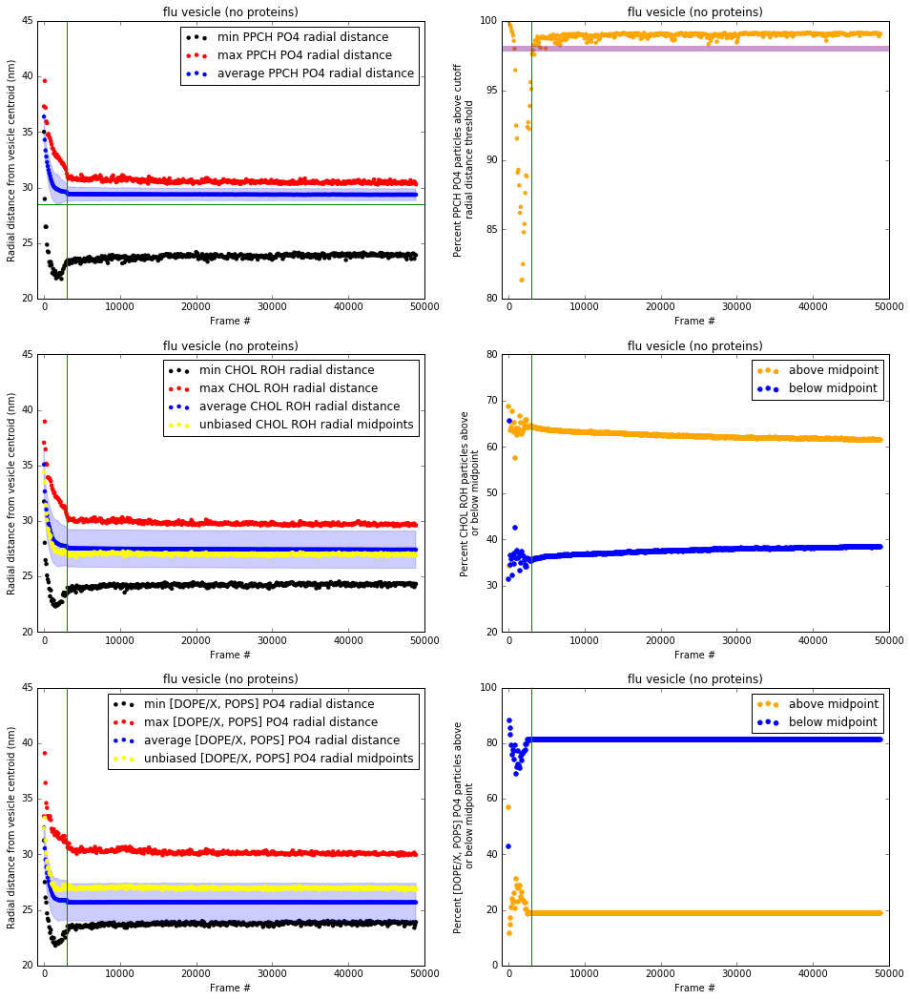

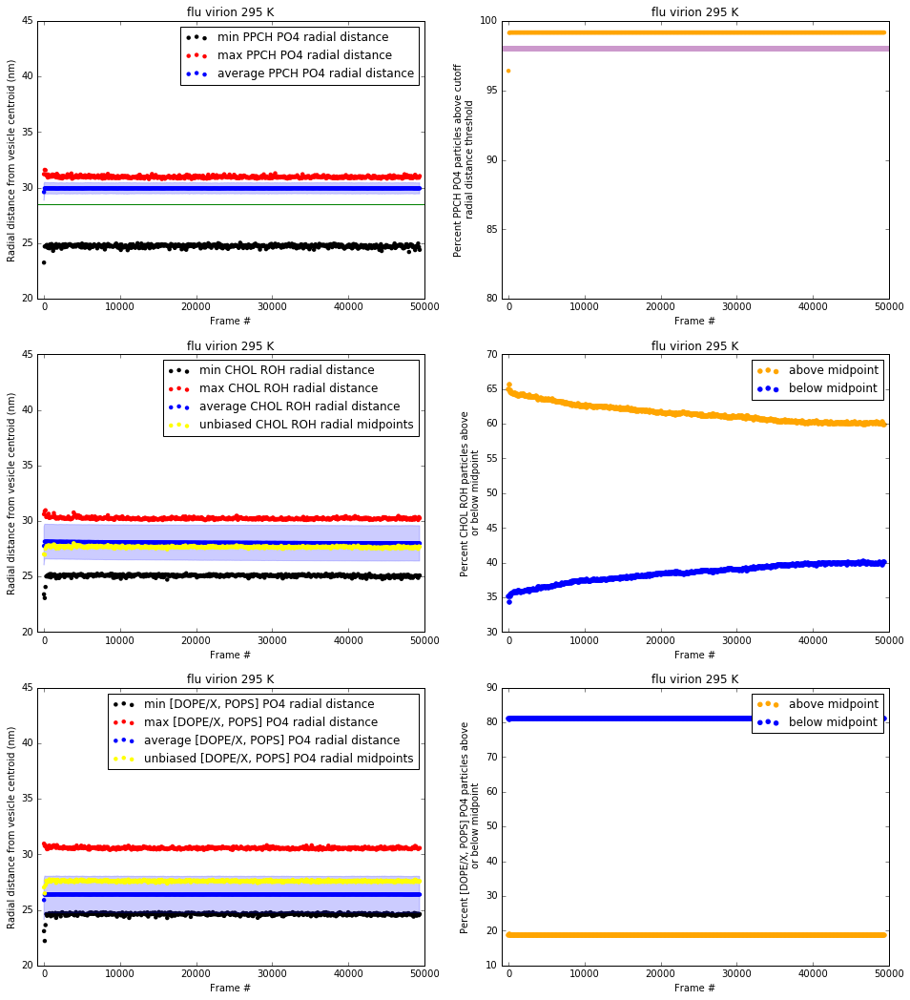

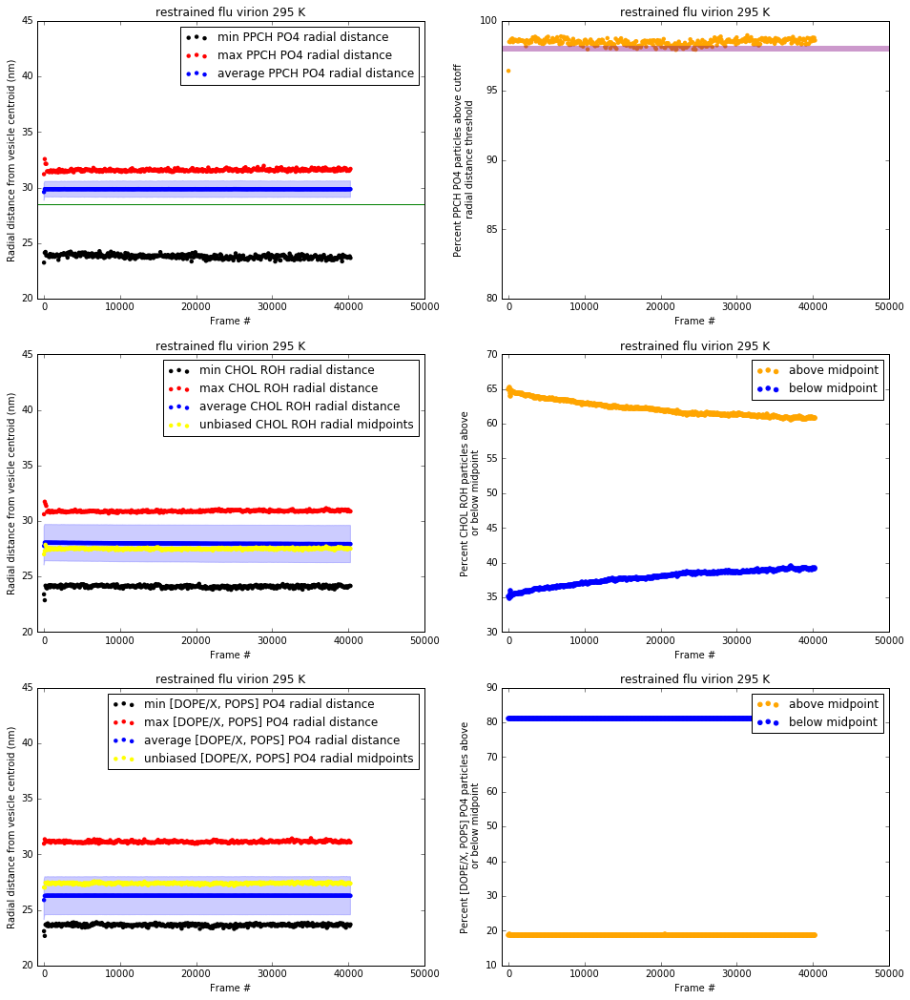

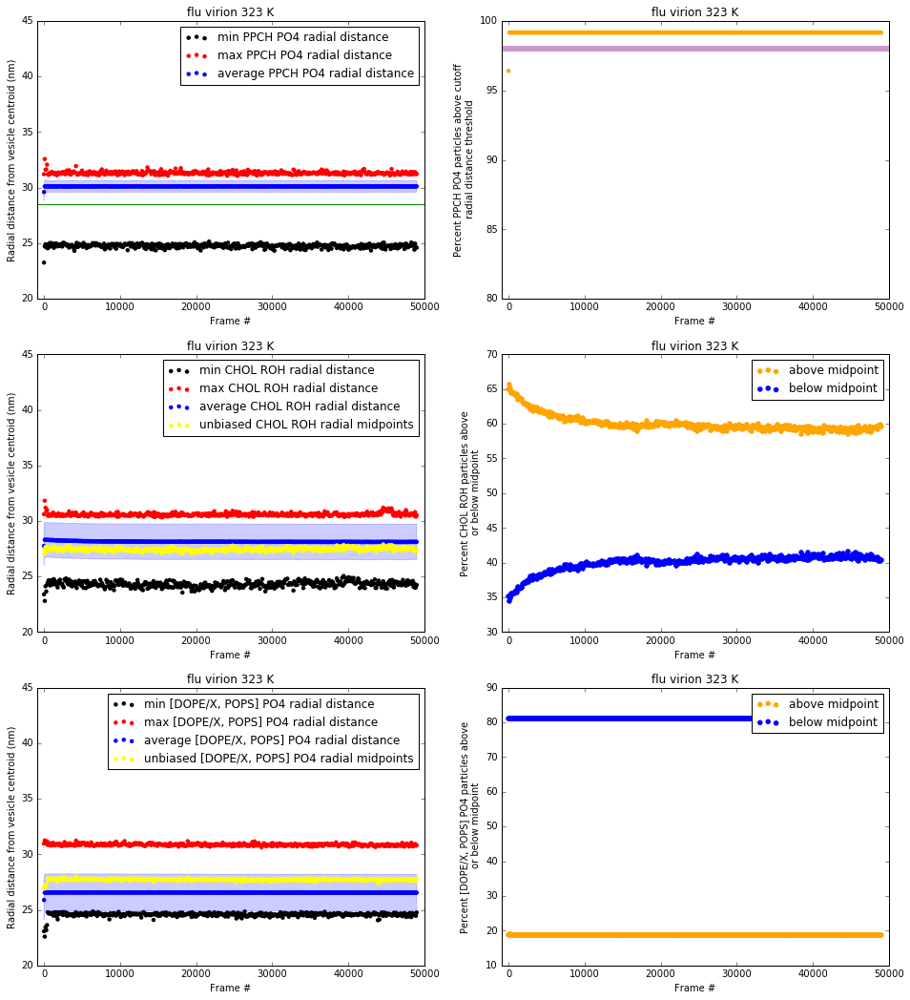

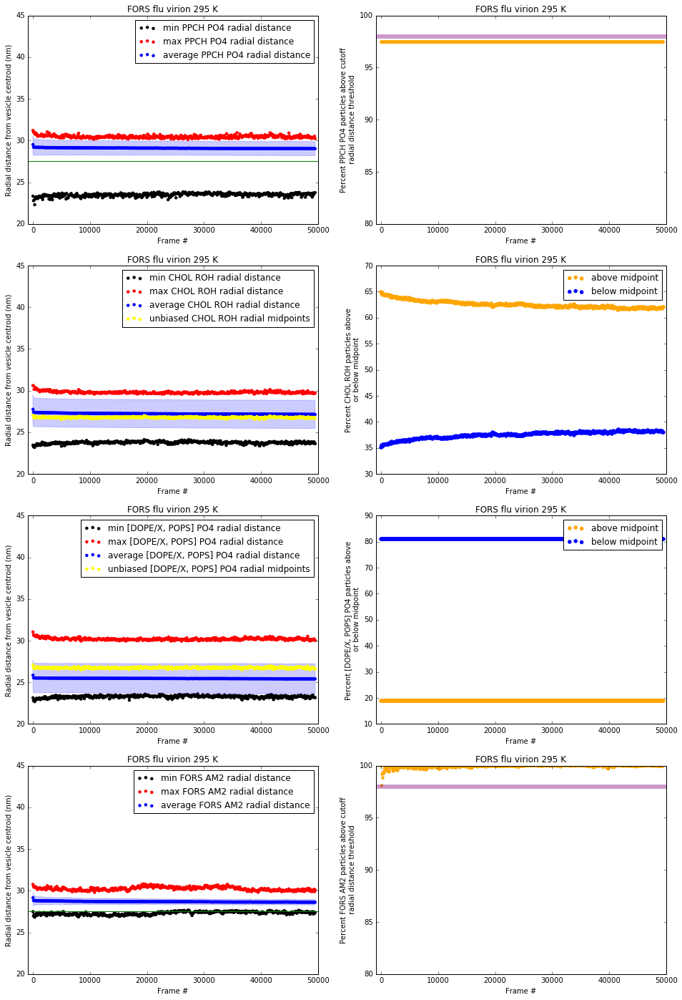

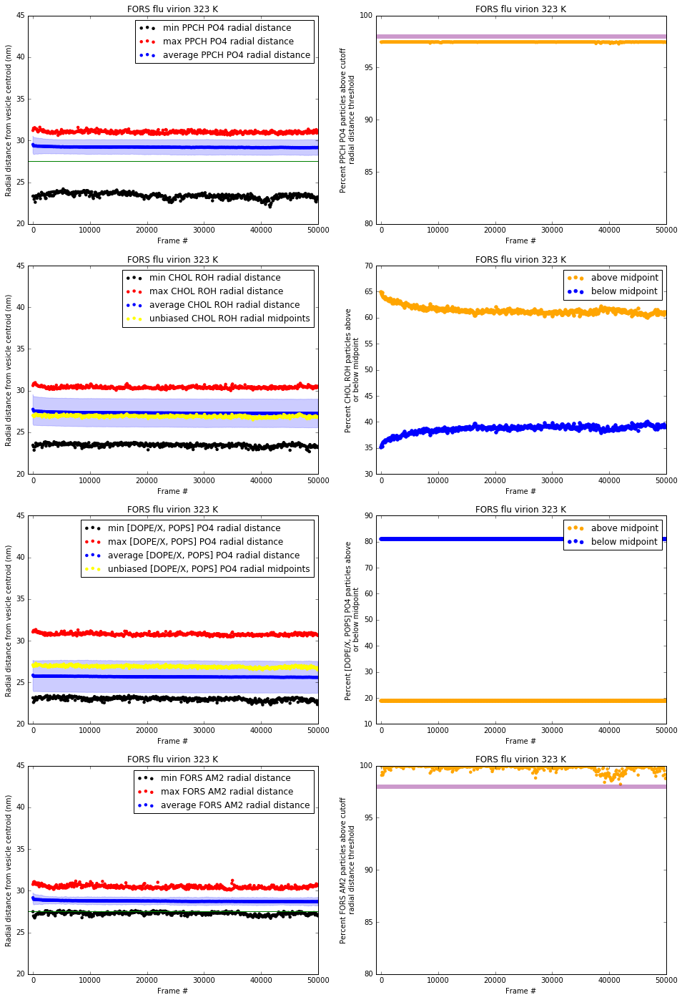

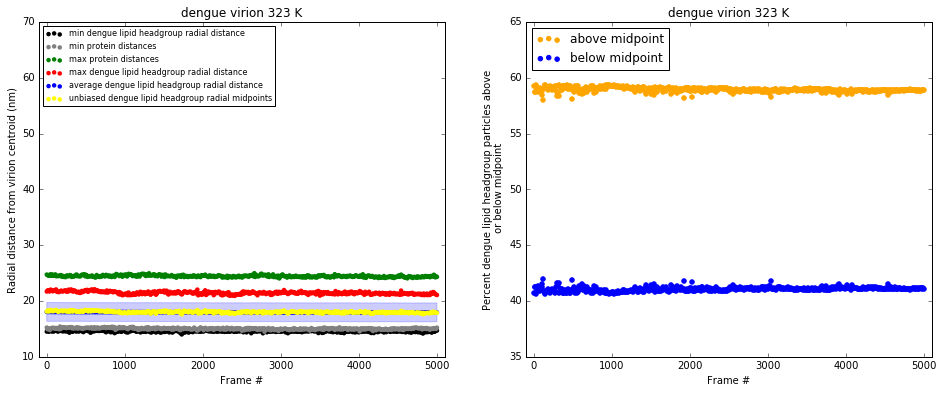

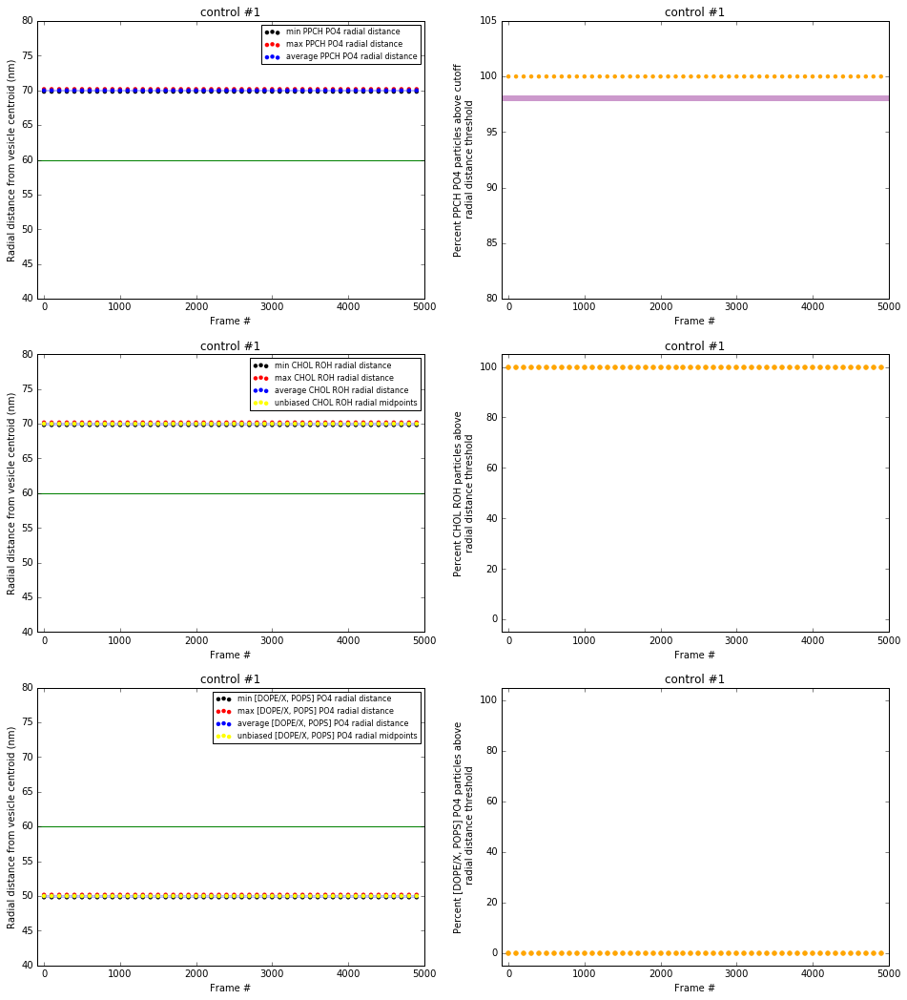

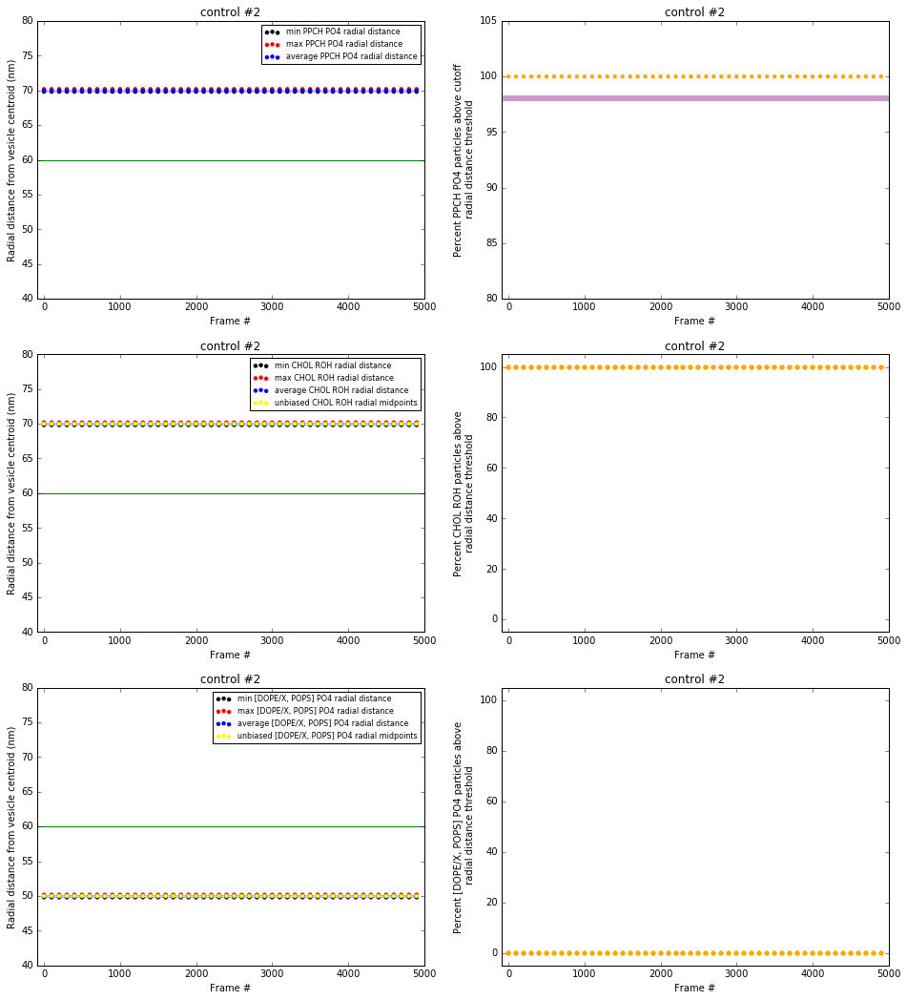

In [38]:
import voronoi_analysis_library
import voronoi_plotting_library
#plot the testing data produced above:
fig_sim33 = plt.figure()
sim33_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_sim33,list_min_PPCH_PO4_distances,list_max_PPCH_PO4_distances,list_average_PPCH_PO4_distances,list_std_dev_PPCH_PO4_distances,sim33_list_frame_numbers,list_PPCH_percent_above_treshold,list_min_CHOL_ROH_distances,list_max_CHOL_ROH_distances,list_average_CHOL_ROH_distances,list_std_dev_CHOL_ROH_distances,list_CHOL_ROH_midpoint_distances,list_CHOL_ROH_percent_above_threshold,list_CHOL_ROH_percent_below_threshold,list_min_remaining_headgroup_distances,list_max_remaining_headgroup_distances,list_average_remaining_headgroup_distances,list_std_dev_remaining_headgroup_distances,list_remaining_headgroup_midpoint_distances,list_remaining_headgroup_percent_above_threshold,list_remaining_headgroup_percent_below_threshold,threshold)
sim33_radial_assessment_instance.plot('flu vesicle (no proteins)',equil_line=1)
#test plot for sim35:
fig_sim35 = plt.figure()
sim35_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_sim35,sim35_list_min_PPCH_PO4_distances,sim35_list_max_PPCH_PO4_distances,sim35_list_average_PPCH_PO4_distances,sim35_list_std_dev_PPCH_PO4_distances,sim35_list_frame_numbers,sim35_list_PPCH_percent_above_treshold,sim35_list_min_CHOL_ROH_distances,sim35_list_max_CHOL_ROH_distances,sim35_list_average_CHOL_ROH_distances,sim35_list_std_dev_CHOL_ROH_distances,sim35_list_CHOL_ROH_midpoint_distances,sim35_list_CHOL_ROH_percent_above_threshold,sim35_list_CHOL_ROH_percent_below_threshold,sim35_list_min_remaining_headgroup_distances,sim35_list_max_remaining_headgroup_distances,sim35_list_average_remaining_headgroup_distances,sim35_list_std_dev_remaining_headgroup_distances,sim35_list_remaining_headgroup_midpoint_distances,sim35_list_remaining_headgroup_percent_above_threshold,sim35_list_remaining_headgroup_percent_below_threshold,sim35_threshold)
sim35_radial_assessment_instance.plot('flu virion 295 K')
#test plot for sim36:
fig_sim36 = plt.figure()
sim36_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_sim36,sim36_list_min_PPCH_PO4_distances,sim36_list_max_PPCH_PO4_distances,sim36_list_average_PPCH_PO4_distances,sim36_list_std_dev_PPCH_PO4_distances,sim36_list_frame_numbers,sim36_list_PPCH_percent_above_treshold,sim36_list_min_CHOL_ROH_distances,sim36_list_max_CHOL_ROH_distances,sim36_list_average_CHOL_ROH_distances,sim36_list_std_dev_CHOL_ROH_distances,sim36_list_CHOL_ROH_midpoint_distances,sim36_list_CHOL_ROH_percent_above_threshold,sim36_list_CHOL_ROH_percent_below_threshold,sim36_list_min_remaining_headgroup_distances,sim36_list_max_remaining_headgroup_distances,sim36_list_average_remaining_headgroup_distances,sim36_list_std_dev_remaining_headgroup_distances,sim36_list_remaining_headgroup_midpoint_distances,sim36_list_remaining_headgroup_percent_above_threshold,sim36_list_remaining_headgroup_percent_below_threshold,sim36_threshold)
sim36_radial_assessment_instance.plot('restrained flu virion 295 K')
#test plot for sim37:
fig_sim37 = plt.figure()
sim37_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_sim37,sim37_list_min_PPCH_PO4_distances,sim37_list_max_PPCH_PO4_distances,sim37_list_average_PPCH_PO4_distances,sim37_list_std_dev_PPCH_PO4_distances,sim37_list_frame_numbers,sim37_list_PPCH_percent_above_treshold,sim37_list_min_CHOL_ROH_distances,sim37_list_max_CHOL_ROH_distances,sim37_list_average_CHOL_ROH_distances,sim37_list_std_dev_CHOL_ROH_distances,sim37_list_CHOL_ROH_midpoint_distances,sim37_list_CHOL_ROH_percent_above_threshold,sim37_list_CHOL_ROH_percent_below_threshold,sim37_list_min_remaining_headgroup_distances,sim37_list_max_remaining_headgroup_distances,sim37_list_average_remaining_headgroup_distances,sim37_list_std_dev_remaining_headgroup_distances,sim37_list_remaining_headgroup_midpoint_distances,sim37_list_remaining_headgroup_percent_above_threshold,sim37_list_remaining_headgroup_percent_below_threshold,sim37_threshold)
sim37_radial_assessment_instance.plot('flu virion 323 K')
#test plot for sim38:
fig_sim38 = plt.figure()
sim38_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_sim38,sim38_list_min_PPCH_PO4_distances,sim38_list_max_PPCH_PO4_distances,sim38_list_average_PPCH_PO4_distances,sim38_list_std_dev_PPCH_PO4_distances,sim38_list_frame_numbers,sim38_list_PPCH_percent_above_treshold,sim38_list_min_CHOL_ROH_distances,sim38_list_max_CHOL_ROH_distances,sim38_list_average_CHOL_ROH_distances,sim38_list_std_dev_CHOL_ROH_distances,sim38_list_CHOL_ROH_midpoint_distances,sim38_list_CHOL_ROH_percent_above_threshold,sim38_list_CHOL_ROH_percent_below_threshold,sim38_list_min_remaining_headgroup_distances,sim38_list_max_remaining_headgroup_distances,sim38_list_average_remaining_headgroup_distances,sim38_list_std_dev_remaining_headgroup_distances,sim38_list_remaining_headgroup_midpoint_distances,sim38_list_remaining_headgroup_percent_above_threshold,sim38_list_remaining_headgroup_percent_below_threshold,sim38_threshold,sim38_list_min_FORS_AM2_distances,sim38_list_max_FORS_AM2_distances,sim38_list_average_FORS_AM2_distances,sim38_list_std_dev_FORS_AM2_distances,sim38_list_FORS_percent_above_treshold,FORS_present=1)
sim38_radial_assessment_instance.plot('FORS flu virion 295 K')
#test plot for sim39:
fig_sim39 = plt.figure()
sim39_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_sim39,sim39_list_min_PPCH_PO4_distances,sim39_list_max_PPCH_PO4_distances,sim39_list_average_PPCH_PO4_distances,sim39_list_std_dev_PPCH_PO4_distances,sim39_list_frame_numbers,sim39_list_PPCH_percent_above_treshold,sim39_list_min_CHOL_ROH_distances,sim39_list_max_CHOL_ROH_distances,sim39_list_average_CHOL_ROH_distances,sim39_list_std_dev_CHOL_ROH_distances,sim39_list_CHOL_ROH_midpoint_distances,sim39_list_CHOL_ROH_percent_above_threshold,sim39_list_CHOL_ROH_percent_below_threshold,sim39_list_min_remaining_headgroup_distances,sim39_list_max_remaining_headgroup_distances,sim39_list_average_remaining_headgroup_distances,sim39_list_std_dev_remaining_headgroup_distances,sim39_list_remaining_headgroup_midpoint_distances,sim39_list_remaining_headgroup_percent_above_threshold,sim39_list_remaining_headgroup_percent_below_threshold,sim39_threshold,sim39_list_min_FORS_AM2_distances,sim39_list_max_FORS_AM2_distances,sim39_list_average_FORS_AM2_distances,sim39_list_std_dev_FORS_AM2_distances,sim39_list_FORS_percent_above_treshold,FORS_present=1)
sim39_radial_assessment_instance.plot('FORS flu virion 323 K')
#test plot for dengue:
fig_dengue = plt.figure()
dengue_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment_dengue(fig_dengue,list_min_dengue_lipid_headgroup_distances,list_max_dengue_lipid_headgroup_distances,list_average_dengue_lipid_headgroup_distances,list_std_dev_dengue_lipid_headgroup_distances,dengue_list_frame_numbers,list_dengue_lipid_headgroup_percent_above_threshold,list_dengue_lipid_headgroup_percent_below_threshold,list_dengue_lipid_headgroup_midpoint_distances,list_min_protein_distances,list_max_protein_distances,array_min_dengue_lipid_headgroup_radial_distances,array_max_dengue_lipid_headgroup_radial_distances,array_min_protein_distances,array_max_protein_distances,array_average_dengue_lipid_headgroup_radial_distances,array_std_dev_dengue_lipid_headgroup_radial_distances,array_dengue_lipid_headgroup_unbiased_midpoint_distances,array_dengue_lipid_headgroup_percent_above_midpoint_threshold,array_dengue_lipid_headgroup_percent_below_midpoint_threshold,array_frame_numbers)
dengue_radial_assessment_instance.plot('dengue virion 323 K')
#test plot for control #1:
fig_control_1 = plt.figure()
control_1_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_control_1,control_1_list_min_PPCH_PO4_distances,control_1_list_max_PPCH_PO4_distances,control_1_list_average_PPCH_PO4_distances,control_1_list_std_dev_PPCH_PO4_distances,control_1_list_frame_numbers,control_1_list_PPCH_percent_above_treshold,control_1_list_min_CHOL_ROH_distances,control_1_list_max_CHOL_ROH_distances,control_1_list_average_CHOL_ROH_distances,control_1_list_std_dev_CHOL_ROH_distances,control_1_list_CHOL_ROH_midpoint_distances,control_1_list_CHOL_ROH_percent_above_threshold,control_1_list_CHOL_ROH_percent_below_threshold,control_1_list_min_remaining_headgroup_distances,control_1_list_max_remaining_headgroup_distances,control_1_list_average_remaining_headgroup_distances,control_1_list_std_dev_remaining_headgroup_distances,control_1_list_remaining_headgroup_midpoint_distances,control_1_list_remaining_headgroup_percent_above_threshold,control_1_list_remaining_headgroup_percent_below_threshold,control_1_threshold,control_condition=1)
control_1_radial_assessment_instance.plot('control #1')
#test plot for control #2:
fig_control_2 = plt.figure()
control_2_radial_assessment_instance = voronoi_plotting_library.radial_distance_assessment(fig_control_2,control_2_list_min_PPCH_PO4_distances,control_2_list_max_PPCH_PO4_distances,control_2_list_average_PPCH_PO4_distances,control_2_list_std_dev_PPCH_PO4_distances,control_2_list_frame_numbers,control_2_list_PPCH_percent_above_treshold,control_2_list_min_CHOL_ROH_distances,control_2_list_max_CHOL_ROH_distances,control_2_list_average_CHOL_ROH_distances,control_2_list_std_dev_CHOL_ROH_distances,control_2_list_CHOL_ROH_midpoint_distances,control_2_list_CHOL_ROH_percent_above_threshold,control_2_list_CHOL_ROH_percent_below_threshold,control_2_list_min_remaining_headgroup_distances,control_2_list_max_remaining_headgroup_distances,control_2_list_average_remaining_headgroup_distances,control_2_list_std_dev_remaining_headgroup_distances,control_2_list_remaining_headgroup_midpoint_distances,control_2_list_remaining_headgroup_percent_above_threshold,control_2_list_remaining_headgroup_percent_below_threshold,control_2_threshold,control_condition=1)
control_2_radial_assessment_instance.plot('control #2')

Clearly, we can capture > 98 % of the PPCH PO4 particles by requiring that radial distance exceeds 28.5 nm (just outside 1 standard deviation from the average for PPCH PO4). This isn't surprising given that PPCH was initially placed entirely in the outer leaflet and only a small amount of PPCH flipped to inner leaflet during equilibration. So, one thing we might want to do for the outer leaflet is project all headgroup particles to the average of PPCH PO4. For PPCH PO4, this would mean taking all particles > 28.5 nm and projecting to the average value (to avoid projecting inner leaflet outliers).

For CHOL ROH particles I think it is most sensible to use the unbiased midpoint of the max and min radial distances in a given frame as the threshold for determination of leaflet assignment. So, if a CHOL ROH particle falls above the midpoint threshold in a given frame, it should be projected up to the PPCH PO4 average radial distance (and check that there are no steric conflicts after projection).

For the minor outer leaflet species (POPS, DOPX, DOPE) it also seems sensible to use an unbiased midpoint cutoff. In a given frame PO4 particles would then be projected up or down to the average value of the appropriate leaflet. My current focus is the outer leaflet where we would probably aim to project everything up to the PPCH PO4 average radial distance (again, need to check for steric conflicts after projection).

I've now expanded this analysis to include the flu virion at 295 K, and the results look quite similar--I think it may be possible to use similar leaflet assignment and projection criteria.

In [39]:
#import time
#start_time = time.time()
#%%prun -T bench.txt
#testing abstraction / generalization of above large Voronoi analysis loop code:
#now testing asychronous parallel workflow for sims33/35
engine_sim33.execute('reload(voronoi_analysis_library)')
engine_sim33.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
ar_sim33 = engine_sim33.execute("sim33_list_frame_numbers_stage_2,sim33_list_percent_surface_area_reconstitution,sim33_list_percent_surface_area_reconstitution_inner_leaflet,sim33_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,3000,'full',1000,PPCH_PO4_threshold=285,proteins_present='no')")
#block until both results are ready (for proper benchmark,etc.)
#dview.wait([ar_sim35,ar_sim33])
#end_time = time.time()
#print 'execution time (seconds):', end_time - start_time

In [40]:
engine_sim35.execute('reload(voronoi_analysis_library)')
engine_sim35.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
ar_sim35 = engine_sim35.execute("sim35_list_frame_numbers_stage_2,sim35_list_percent_surface_area_reconstitution_from_lipids_only,sim35_list_percent_surface_area_reconstitution_from_proteins_only,sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim35_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")


In [41]:
#test area per molecule analysis on control condition #1:
engine_control_1.execute("reload(voronoi_analysis_library)")
engine_control_1.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
ar_control_1 = engine_control_1.execute("control_1_list_frame_numbers_stage_2,control_1_list_percent_surface_area_reconstitution,control_1_list_percent_surface_area_reconstitution_inner_leaflet,control_1_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,control_condition=1)") #stage 2 specifier to avoid namespace conflict with precursor analysis


In [42]:
#test area per molecule analysis on control condition #2:
engine_control_2.execute("reload(voronoi_analysis_library)")
engine_control_2.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
ar_control_2 = engine_control_2.execute("control_2_list_frame_numbers_stage_2,control_2_list_percent_surface_area_reconstitution,control_2_list_percent_surface_area_reconstitution_inner_leaflet,control_2_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,control_condition=1)") #stage 2 specifier to avoid namespace conflict with precursor analysis


In [43]:
#expand area per molecule analysis to include sims 36/37 by performing asynchronous parallel calculation on their respective engines:
engine_sim36.execute('reload(voronoi_analysis_library)')
engine_sim36.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim37.execute('reload(voronoi_analysis_library)')
engine_sim37.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
ar_sim36 = engine_sim36.execute("sim36_list_frame_numbers_stage_2,sim36_list_percent_surface_area_reconstitution_from_lipids_only,sim36_list_percent_surface_area_reconstitution_from_proteins_only,sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim36_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")
ar_sim37 = engine_sim37.execute("sim37_list_frame_numbers_stage_2,sim37_list_percent_surface_area_reconstitution_from_lipids_only,sim37_list_percent_surface_area_reconstitution_from_proteins_only,sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim37_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=285,proteins_present='yes')")



In [44]:
#expand area per molecule analysis to include sims38/39 once voronoi_analysis_library.voronoi_analysis_loop() function has been expanded to work properly with FORS residues
engine_sim38.execute('reload(voronoi_analysis_library)')
engine_sim38.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
engine_sim39.execute('reload(voronoi_analysis_library)')
engine_sim39.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
#currently just testing the new FORS-adjusted code (expecting at least one or two problems):
ar_sim38 = engine_sim38.execute("sim38_list_frame_numbers_stage_2,sim38_list_percent_surface_area_reconstitution_from_lipids_only,sim38_list_percent_surface_area_reconstitution_from_proteins_only,sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim38_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=275,proteins_present='yes',FORS_present='yes')")
ar_sim39 = engine_sim39.execute("sim39_list_frame_numbers_stage_2,sim39_list_percent_surface_area_reconstitution_from_lipids_only,sim39_list_percent_surface_area_reconstitution_from_proteins_only,sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim39_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',1000,PPCH_PO4_threshold=275,proteins_present='yes',FORS_present='yes')")


In [45]:
#now expand area per molecule analysis to include the dengue trajectory (testing phase)
engine_dengue.execute('reload(voronoi_analysis_library)')
engine_dengue.execute('import sys; sys.path.append("/sansom/sc2/bioc1009/github_projects/spherical_Voronoi/py_sphere_Voronoi")')
ar_dengue = engine_dengue.execute("dengue_list_frame_numbers_stage_2,dengue_list_percent_surface_area_reconstitution_from_lipids_only,dengue_list_percent_surface_area_reconstitution_from_proteins_only,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_dictionary_headgroup_data = voronoi_analysis_library.voronoi_analysis_loop(universe_object,0,'full',100,proteins_present='yes',dengue_condition=1)")

In [46]:
(ar_sim33.ready(),ar_sim35.ready(),ar_sim36.ready(),ar_sim37.ready(),ar_sim38.ready(),ar_sim39.ready(),ar_control_1.ready(),ar_control_2.ready(),ar_dengue.ready())

(False, False, False, False, False, False, False, False, False)

In [47]:
#pull out the Voronoi data parsed on various IPython engines (other cores):
sim35_list_frame_numbers_stage_2,sim35_list_percent_surface_area_reconstitution_from_lipids_only,sim35_list_percent_surface_area_reconstitution_from_proteins_only,sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim35_dictionary_headgroup_data = [engine_sim35[key] for key in ["sim35_list_frame_numbers_stage_2","sim35_list_percent_surface_area_reconstitution_from_lipids_only","sim35_list_percent_surface_area_reconstitution_from_proteins_only","sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim35_dictionary_headgroup_data"]]
sim33_list_frame_numbers_stage_2,sim33_list_percent_surface_area_reconstitution,sim33_list_percent_surface_area_reconstitution_inner_leaflet,sim33_dictionary_headgroup_data = [engine_sim33[key] for key in ["sim33_list_frame_numbers_stage_2","sim33_list_percent_surface_area_reconstitution","sim33_list_percent_surface_area_reconstitution_inner_leaflet","sim33_dictionary_headgroup_data"]]


In [48]:
#now pull out the Voronoi data from additional simulation conditions (sims36/37):
sim36_list_frame_numbers_stage_2,sim36_list_percent_surface_area_reconstitution_from_lipids_only,sim36_list_percent_surface_area_reconstitution_from_proteins_only,sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim36_dictionary_headgroup_data = [engine_sim36[key] for key in ["sim36_list_frame_numbers_stage_2","sim36_list_percent_surface_area_reconstitution_from_lipids_only","sim36_list_percent_surface_area_reconstitution_from_proteins_only","sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim36_dictionary_headgroup_data"]]
sim37_list_frame_numbers_stage_2,sim37_list_percent_surface_area_reconstitution_from_lipids_only,sim37_list_percent_surface_area_reconstitution_from_proteins_only,sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim37_dictionary_headgroup_data = [engine_sim37[key] for key in ["sim37_list_frame_numbers_stage_2","sim37_list_percent_surface_area_reconstitution_from_lipids_only","sim37_list_percent_surface_area_reconstitution_from_proteins_only","sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim37_dictionary_headgroup_data"]]

In [49]:
#now pull out the Voronoi data from additional simulation conditions (sims38/39):
sim38_list_frame_numbers_stage_2,sim38_list_percent_surface_area_reconstitution_from_lipids_only,sim38_list_percent_surface_area_reconstitution_from_proteins_only,sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim38_dictionary_headgroup_data = [engine_sim38[key] for key in ["sim38_list_frame_numbers_stage_2","sim38_list_percent_surface_area_reconstitution_from_lipids_only","sim38_list_percent_surface_area_reconstitution_from_proteins_only","sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim38_dictionary_headgroup_data"]]
sim39_list_frame_numbers_stage_2,sim39_list_percent_surface_area_reconstitution_from_lipids_only,sim39_list_percent_surface_area_reconstitution_from_proteins_only,sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,sim39_dictionary_headgroup_data = [engine_sim39[key] for key in ["sim39_list_frame_numbers_stage_2","sim39_list_percent_surface_area_reconstitution_from_lipids_only","sim39_list_percent_surface_area_reconstitution_from_proteins_only","sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","sim39_dictionary_headgroup_data"]]


In [50]:
#pull out the Voronoi data from the dengue simulation condition:
dengue_list_frame_numbers_stage_2,dengue_list_percent_surface_area_reconstitution_from_lipids_only,dengue_list_percent_surface_area_reconstitution_from_proteins_only,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_dictionary_headgroup_data = [engine_dengue[key] for key in ["dengue_list_frame_numbers_stage_2","dengue_list_percent_surface_area_reconstitution_from_lipids_only","dengue_list_percent_surface_area_reconstitution_from_proteins_only","dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet","dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet","dengue_dictionary_headgroup_data"]]


In [51]:
#now pull back Voronoi data for the two control conditions
control_1_list_frame_numbers_stage_2,control_1_list_percent_surface_area_reconstitution,control_1_list_percent_surface_area_reconstitution_inner_leaflet,control_1_dictionary_headgroup_data = [engine_control_1[key] for key in ["control_1_list_frame_numbers_stage_2","control_1_list_percent_surface_area_reconstitution","control_1_list_percent_surface_area_reconstitution_inner_leaflet","control_1_dictionary_headgroup_data"]]
control_2_list_frame_numbers_stage_2,control_2_list_percent_surface_area_reconstitution,control_2_list_percent_surface_area_reconstitution_inner_leaflet,control_2_dictionary_headgroup_data = [engine_control_2[key] for key in ["control_2_list_frame_numbers_stage_2","control_2_list_percent_surface_area_reconstitution","control_2_list_percent_surface_area_reconstitution_inner_leaflet","control_2_dictionary_headgroup_data"]]

---------
Flu virion 295 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.52104301879
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.49310389033
---------
---------
Restrained flu virion 295 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.54434355507
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.48593299576
---------
---------
Flu virion 323 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.3609027249
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.32794780835
---------
---------
Flu virion FORS 295 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.59823036113
avg array_percent_surface_area_reconstitution_protein_outer_leaflet: 2.60180139606
---------
---------
Flu virion FORS 323 K
avg array_percent_surface_area_reconstitution_protein_inner_leaflet: 2.38224159844
avg array_percent_surface_area_reconstitution_protein_oute

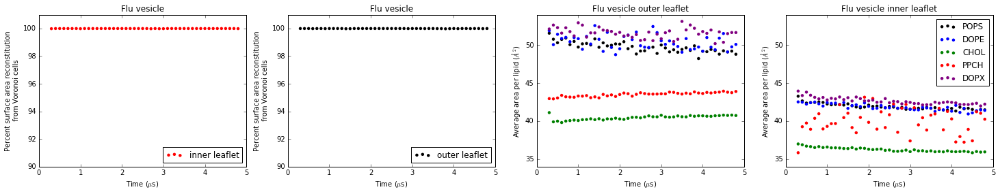

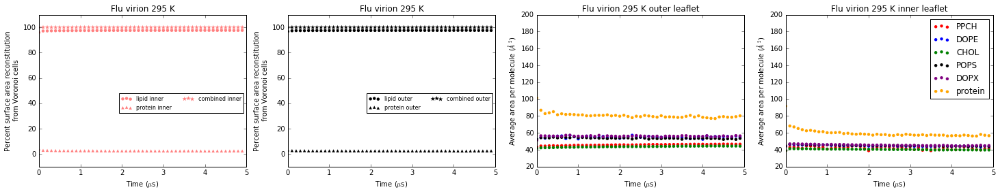

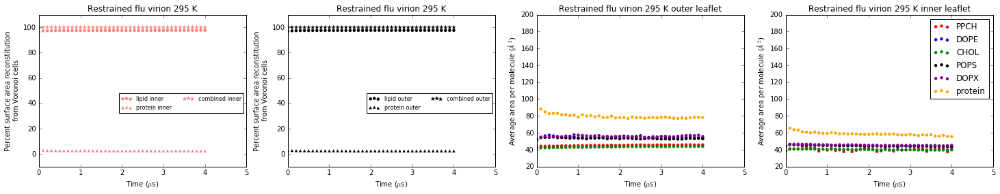

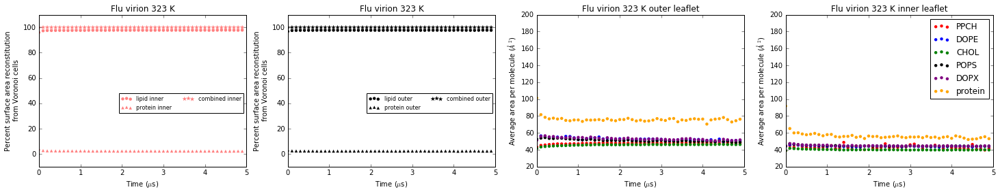

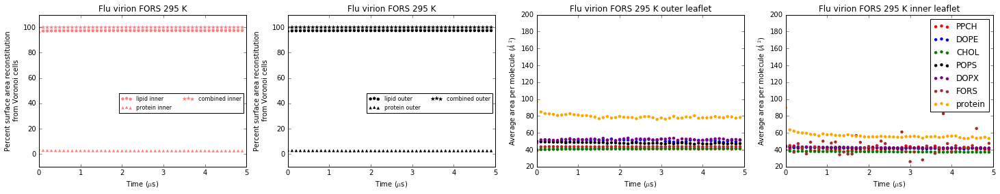

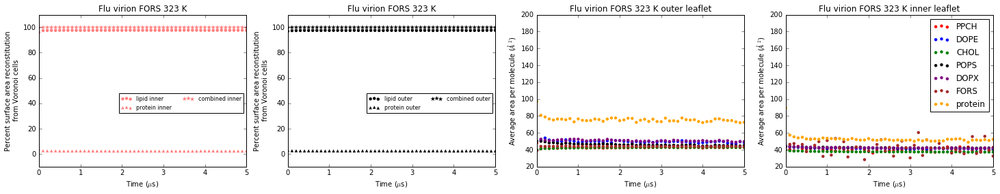

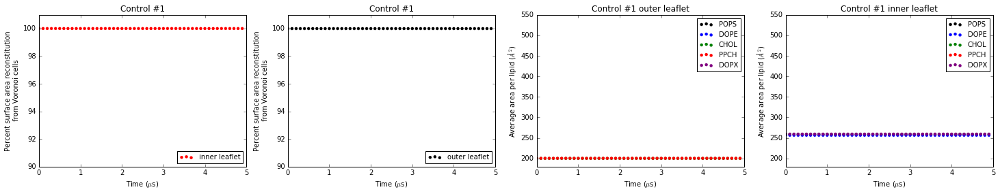

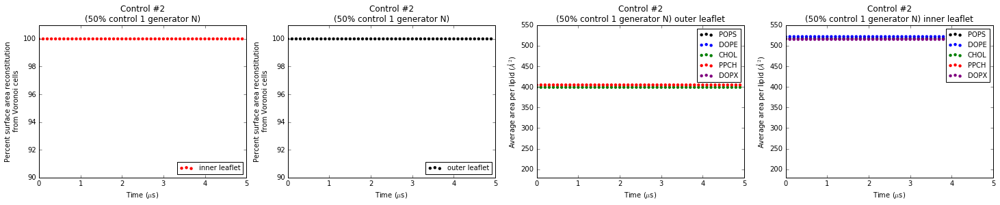

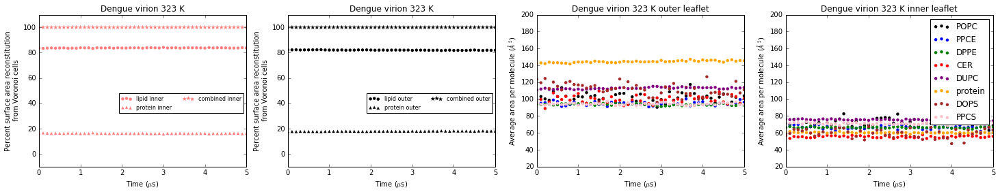

In [843]:
import voronoi_plotting_library
#start plotting test vesicle outer leaflet voronoi analysis results from above (now working to add inner leaflet results as well)
#now working to add plots for preliminary sim35 Voronoi parsing results

#plot sim33 area per molecule results:
fig2 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig2,list_frame_numbers=sim33_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=sim33_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=sim33_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Flu vesicle',dictionary_headgroup_data=sim33_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None)
#plot sim35 area per molecule results:
fig3 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig3,list_frame_numbers=sim35_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 295 K',dictionary_headgroup_data=sim35_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim35_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim35_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim36 area per molecule results:
fig4 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig4,list_frame_numbers=sim36_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Restrained flu virion 295 K',dictionary_headgroup_data=sim36_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim36_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim36_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim37 area per molecule results:
fig5 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig5,list_frame_numbers=sim37_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion 323 K',dictionary_headgroup_data=sim37_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim37_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim37_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim38 area per molecule results:
fig6 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig6,list_frame_numbers=sim38_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion FORS 295 K',dictionary_headgroup_data=sim38_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim38_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim38_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot sim39 area per molecule results:
fig7 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig7,list_frame_numbers=sim39_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Flu virion FORS 323 K',dictionary_headgroup_data=sim39_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=sim39_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=sim39_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet)
#plot control #1 area per molecule results:
fig8 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig8,list_frame_numbers=control_1_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=control_1_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=control_1_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Control #1',dictionary_headgroup_data=control_1_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None,control_condition=1, output_file = 'control_1_area_per_molecule_results.png')
#plot control #2 area per molecule results:
fig9 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig9,list_frame_numbers=control_2_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=control_2_list_percent_surface_area_reconstitution,list_percent_surface_area_reconstitution_inner_leaflet=control_2_list_percent_surface_area_reconstitution_inner_leaflet,protein_present=None,simulation_title='Control #2\n(50% control 1 generator N)',dictionary_headgroup_data=control_2_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=None,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=None,list_percent_surface_area_reconstitution_from_proteins_only=None,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=None,control_condition=1, output_file = 'control_2_area_per_molecule_results.png')
#plot dengue area per molecule results:
fig10 = plt.figure()
voronoi_plotting_library.area_per_molecule_plotting(figure_object=fig10,list_frame_numbers=dengue_list_frame_numbers_stage_2,list_percent_surface_area_reconstitution=None,list_percent_surface_area_reconstitution_inner_leaflet=None,protein_present='yes',simulation_title='Dengue virion 323 K',dictionary_headgroup_data=dengue_dictionary_headgroup_data,list_percent_surface_area_reconstitution_from_lipids_only=dengue_list_percent_surface_area_reconstitution_from_lipids_only,list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,list_percent_surface_area_reconstitution_from_proteins_only=dengue_list_percent_surface_area_reconstitution_from_proteins_only,list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet=dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,dengue_condition=1)

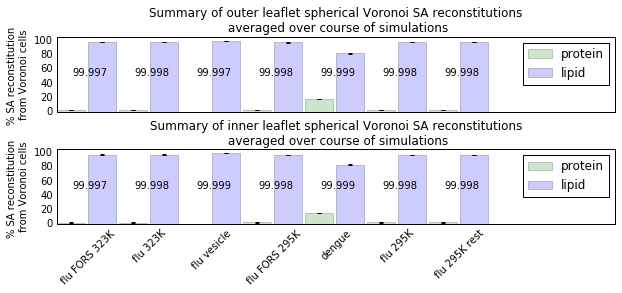

In [53]:
#work to summarize the above plots in a more condensed format suitable for a single SBCB seminar slide (and eventually a paper figure maybe)
#first, I want a row of plots summarizing the surface area reconstitution results
fig_summarize_SA_reconstitution = plt.figure()
ax_outer_leaflet = fig_summarize_SA_reconstitution.add_subplot('211')
ax_inner_leaflet = fig_summarize_SA_reconstitution.add_subplot('212')

dictionary_surface_area_reconstitution = {'dengue': {'inner': {'protein': dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, 'lipid': dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet}, 'outer': {'protein': dengue_list_percent_surface_area_reconstitution_from_proteins_only, 'lipid': dengue_list_percent_surface_area_reconstitution_from_lipids_only}}, 'flu vesicle': {'inner': {'lipid': sim33_list_percent_surface_area_reconstitution_inner_leaflet}, 'outer': {'lipid': sim33_list_percent_surface_area_reconstitution}}, 'flu 295K': {'inner': {'protein': sim35_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, 'lipid': sim35_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet}, 'outer': {'protein': sim35_list_percent_surface_area_reconstitution_from_proteins_only, 'lipid': sim35_list_percent_surface_area_reconstitution_from_lipids_only}}, 'flu 323K': {'inner': {'protein': sim37_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, 'lipid':sim37_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet}, 'outer': {'protein': sim37_list_percent_surface_area_reconstitution_from_proteins_only , 'lipid':sim37_list_percent_surface_area_reconstitution_from_lipids_only}},'flu 295K rest': {'inner': {'protein': sim36_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, 'lipid':sim36_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet}, 'outer': {'protein': sim36_list_percent_surface_area_reconstitution_from_proteins_only, 'lipid': sim36_list_percent_surface_area_reconstitution_from_lipids_only}},'flu FORS 295K': {'inner': {'protein': sim38_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, 'lipid': sim38_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet}, 'outer': {'protein':sim38_list_percent_surface_area_reconstitution_from_proteins_only , 'lipid':sim38_list_percent_surface_area_reconstitution_from_lipids_only}},'flu FORS 323K': {'inner': {'protein':sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, 'lipid':sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet}, 'outer': {'protein': sim39_list_percent_surface_area_reconstitution_from_proteins_only, 'lipid': sim39_list_percent_surface_area_reconstitution_from_lipids_only}}}

def plot_percent_SA_data(axis, xaxis_position, data_dict, simulation_condition, index, list_tick_positions, counter):
    color_dict = {'protein': 'green', 'lipid': 'blue'}
    list_available_species = data_dict.keys() #will only have lipid for sim33; both protein and lipid for all others
    sum_species_percent_reconstitutions = 0
    if len(list_available_species) < 2:
        xaxis_position += 1
    for species in list_available_species:
        average_percent_SA_reconstitution = numpy.average(data_dict[species])
        std_percent_SA_reconstitution = numpy.std(data_dict[species])
        sum_species_percent_reconstitutions += average_percent_SA_reconstitution
        if index == 0: #to generate legend labels only once
            axis.bar(xaxis_position, average_percent_SA_reconstitution, yerr=std_percent_SA_reconstitution, alpha = 0.2, width = 0.9, color = color_dict[species], label = species, error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
        else:
            axis.bar(xaxis_position, average_percent_SA_reconstitution, yerr=std_percent_SA_reconstitution, alpha = 0.2, width = 0.9, color = color_dict[species], error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
            
        xaxis_position += 1
    axis.text(list_tick_positions[counter] - 0.5, 50, '%.3f' % sum_species_percent_reconstitutions)
        
x_positions = numpy.arange(20)   
index = 0
list_xtick_labels = []
list_tick_positions = [1,3,5,7,9,11,13]
counter = 0

for simulation_condition, subdictionary in dictionary_surface_area_reconstitution.iteritems():
    list_xtick_labels.append(simulation_condition)
    #print 'simulation_condition:', simulation_condition
    inner_leaflet_data_dict = subdictionary['inner']
    outer_leaflet_data_dict = subdictionary['outer']
    #print 'outer_leaflet_data_dict.keys():', outer_leaflet_data_dict.keys()
    plot_percent_SA_data(ax_outer_leaflet, x_positions[index], outer_leaflet_data_dict, simulation_condition, index, list_tick_positions, counter)
    plot_percent_SA_data(ax_inner_leaflet, x_positions[index], inner_leaflet_data_dict, simulation_condition, index, list_tick_positions, counter)
    counter += 1
    index += 2
    
for axis in [ax_outer_leaflet, ax_inner_leaflet]:
    axis.set_xlim(0,18)
    axis.set_ylim(0,105)
    axis.set_ylabel('% SA reconstitution \nfrom Voronoi cells')
    axis.set_xticks([1,3,5,7,9,11,13])
    axis.legend()
    axis.tick_params(axis = 'both', which = 'both', bottom = 'off', top = 'off', left = 'off', right = 'off')
    
ax_outer_leaflet.set_title('Summary of outer leaflet spherical Voronoi SA reconstitutions\n averaged over course of simulations')
#ax_outer_leaflet.legend()
ax_inner_leaflet.set_title('Summary of inner leaflet spherical Voronoi SA reconstitutions\n averaged over course of simulations')
ax_inner_leaflet.set_xticklabels(list_xtick_labels, rotation=45)
ax_outer_leaflet.set_xticks([])
#ax_inner_leaflet.legend()
fig_summarize_SA_reconstitution.subplots_adjust(hspace=0.5, bottom = 0.25)
fig_summarize_SA_reconstitution.set_size_inches(10, 4)
fig_summarize_SA_reconstitution.savefig('summarize_SA_reconstitution_spherical_Voronoi.png', dpi = 300)

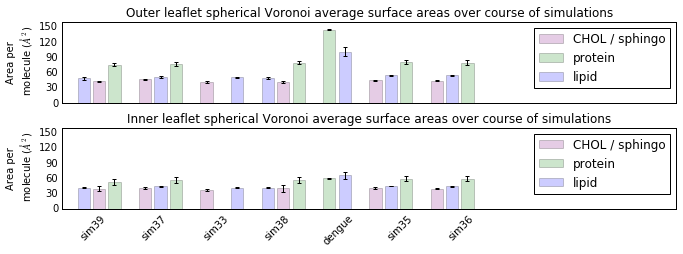

In [54]:
#work to generate a 2-row plot summarizing area per molecule results for both leaflets of all simulation conditions (for SBCB seminar slide, etc.)
fig_area_per_molecule_tracking_summary = plt.figure()
ax_outer = fig_area_per_molecule_tracking_summary.add_subplot('211')
ax_inner = fig_area_per_molecule_tracking_summary.add_subplot('212')

dengue_aggregate_list_lipid_surface_areas_outer_leaflet = []
dengue_aggregate_list_lipid_surface_areas_inner_leaflet = []

plot_x_position = 0
dengue_lipid_species_counter = 0
protein_label_counter = 0
lipid_label_counter = 0
list_xtick_labels = []
sphingo_label_counter = 0

for data_dict, condition in zip([sim39_dictionary_headgroup_data,sim37_dictionary_headgroup_data,sim33_dictionary_headgroup_data,sim38_dictionary_headgroup_data,dengue_dictionary_headgroup_data, sim35_dictionary_headgroup_data , sim36_dictionary_headgroup_data],['sim39','sim37','sim33','sim38','dengue', 'sim35','sim36']):
    flu_aggregate_list_sphingolipid_CHOL_surface_areas_outer_leaflet = []
    flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet = []
    flu_aggregate_list_other_lipid_surface_areas_outer_leaflet = []
    flu_aggregate_list_other_lipid_surface_areas_inner_leaflet = []
    list_xtick_labels.append(condition)
    flu_CHOL_sphingo_counter = 0
    flu_other_lipid_counter = 0
    plot_x_position += 1
    for molecular_species_name, subdictionary in data_dict.iteritems():
        if molecular_species_name == 'protein': #protein treated separately for both dengue and flu conditions
            outer_leaflet_protein_list_surface_area_average_values = subdictionary['voronoi_cell_avg_values_list']
            inner_leaflet_protein_list_surface_area_average_values = subdictionary['voronoi_cell_avg_values_list_inner_leaflet']
            outer_leaflet_protein_SA_overall_avg = numpy.average(outer_leaflet_protein_list_surface_area_average_values)
            inner_leaflet_protein_SA_overall_avg = numpy.average(inner_leaflet_protein_list_surface_area_average_values)
            outer_leaflet_protein_SA_overall_std = numpy.std(outer_leaflet_protein_list_surface_area_average_values)
            inner_leaflet_protein_SA_overall_std = numpy.std(inner_leaflet_protein_list_surface_area_average_values)
            if protein_label_counter == 0:
                ax_outer.bar(plot_x_position,outer_leaflet_protein_SA_overall_avg, yerr = outer_leaflet_protein_SA_overall_std, alpha = 0.2, color = 'green',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'protein')
                ax_inner.bar(plot_x_position,inner_leaflet_protein_SA_overall_avg, yerr = inner_leaflet_protein_SA_overall_std, alpha = 0.2, color = 'green',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'protein')
                protein_label_counter += 1
            else:
                ax_outer.bar(plot_x_position,outer_leaflet_protein_SA_overall_avg, yerr = outer_leaflet_protein_SA_overall_std, alpha = 0.2, color = 'green',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
                ax_inner.bar(plot_x_position,inner_leaflet_protein_SA_overall_avg, yerr = inner_leaflet_protein_SA_overall_std, alpha = 0.2, color = 'green',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
            plot_x_position += 1
        elif condition == 'dengue': #for dengue, all lipids will be treated in the same category in each leaflet
            outer_leaflet_lipid_list_SA_avg_values = subdictionary['voronoi_cell_avg_values_list']
            inner_leaflet_lipid_list_SA_avg_values = subdictionary['voronoi_cell_avg_values_list_inner_leaflet']
            dengue_aggregate_list_lipid_surface_areas_outer_leaflet.extend(outer_leaflet_lipid_list_SA_avg_values)
            dengue_aggregate_list_lipid_surface_areas_inner_leaflet.extend(inner_leaflet_lipid_list_SA_avg_values)
            dengue_lipid_species_counter += 1
            if dengue_lipid_species_counter == 7: #only do the actual plotting once the full set of dengue lipid data has been collected
                dengue_outer_leaflet_lipid_SA_overall_avg = numpy.average(dengue_aggregate_list_lipid_surface_areas_outer_leaflet)
                dengue_inner_leaflet_lipid_SA_overall_avg = numpy.average(dengue_aggregate_list_lipid_surface_areas_inner_leaflet)
                dengue_outer_leaflet_lipid_SA_overall_std = numpy.std(dengue_aggregate_list_lipid_surface_areas_outer_leaflet)
                dengue_inner_leaflet_lipid_SA_overall_std = numpy.std(dengue_aggregate_list_lipid_surface_areas_inner_leaflet)
                ax_outer.bar(plot_x_position,dengue_outer_leaflet_lipid_SA_overall_avg, yerr = dengue_outer_leaflet_lipid_SA_overall_std, alpha = 0.2, color= 'blue',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'lipid')
                ax_inner.bar(plot_x_position,dengue_inner_leaflet_lipid_SA_overall_avg, yerr = dengue_inner_leaflet_lipid_SA_overall_std, alpha = 0.2, color= 'blue',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'lipid')
                plot_x_position += 1
        else: #deal with flu lipids
            if molecular_species_name in ['CHOL', 'PPCH', 'FORS']: #condense CHOL + sphingolipids together
                outer_leaflet_lipid_list_SA_avg_values = subdictionary['voronoi_cell_avg_values_list']
                inner_leaflet_lipid_list_SA_avg_values = subdictionary['voronoi_cell_avg_values_list_inner_leaflet']
                flu_aggregate_list_sphingolipid_CHOL_surface_areas_outer_leaflet.extend(outer_leaflet_lipid_list_SA_avg_values)
                flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet.extend(inner_leaflet_lipid_list_SA_avg_values)
                flu_CHOL_sphingo_counter += 1
                if condition in ['sim38', 'sim39'] and flu_CHOL_sphingo_counter == 3: #plot after necessary lipids are accounted for
                    flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet = numpy.array(flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet)[~numpy.isnan(flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet)] #have some issues with nan values in inner leaflet for sims38,39
                    flu_CHOL_sphingo_outer_overall_avg = numpy.average(flu_aggregate_list_sphingolipid_CHOL_surface_areas_outer_leaflet)
                    flu_CHOL_sphingo_inner_overall_avg = numpy.average(flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet)
                    flu_CHOL_sphingo_outer_overall_std = numpy.std(flu_aggregate_list_sphingolipid_CHOL_surface_areas_outer_leaflet)
                    flu_CHOL_sphingo_inner_overall_std = numpy.std(flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet)
                    if sphingo_label_counter == 0:
                        ax_outer.bar(plot_x_position,flu_CHOL_sphingo_outer_overall_avg, yerr = flu_CHOL_sphingo_outer_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'CHOL / sphingo')
                        ax_inner.bar(plot_x_position,flu_CHOL_sphingo_inner_overall_avg, yerr = flu_CHOL_sphingo_inner_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'CHOL / sphingo')
                        sphingo_label_counter += 1
                    else:
                        ax_outer.bar(plot_x_position,flu_CHOL_sphingo_outer_overall_avg, yerr = flu_CHOL_sphingo_outer_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
                        ax_inner.bar(plot_x_position,flu_CHOL_sphingo_inner_overall_avg, yerr = flu_CHOL_sphingo_inner_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
                    plot_x_position += 1
                elif condition in ['sim33', 'sim35', 'sim36', 'sim37'] and flu_CHOL_sphingo_counter == 2:
                    flu_CHOL_sphingo_outer_overall_avg = numpy.average(flu_aggregate_list_sphingolipid_CHOL_surface_areas_outer_leaflet)
                    flu_CHOL_sphingo_inner_overall_avg = numpy.average(flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet)
                    flu_CHOL_sphingo_outer_overall_std = numpy.std(flu_aggregate_list_sphingolipid_CHOL_surface_areas_outer_leaflet)
                    flu_CHOL_sphingo_inner_overall_std = numpy.std(flu_aggregate_list_sphingolipid_CHOL_surface_areas_inner_leaflet)
                    if sphingo_label_counter == 0:
                        ax_outer.bar(plot_x_position,flu_CHOL_sphingo_outer_overall_avg, yerr = flu_CHOL_sphingo_outer_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'CHOL / sphingo')
                        ax_inner.bar(plot_x_position,flu_CHOL_sphingo_inner_overall_avg, yerr = flu_CHOL_sphingo_inner_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1), label = 'CHOL / sphingo')
                        sphingo_label_counter += 1
                    else:
                        ax_outer.bar(plot_x_position,flu_CHOL_sphingo_outer_overall_avg, yerr = flu_CHOL_sphingo_outer_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
                        ax_inner.bar(plot_x_position,flu_CHOL_sphingo_inner_overall_avg, yerr = flu_CHOL_sphingo_inner_overall_std, alpha = 0.2, color= 'purple',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
                    plot_x_position += 1
                    if condition == 'sim33': #adding a spacer due to lack of protein in sim33
                        plot_x_position += 1
            else: #condense the remaining lipids
                outer_leaflet_lipid_list_SA_avg_values = subdictionary['voronoi_cell_avg_values_list']
                inner_leaflet_lipid_list_SA_avg_values = subdictionary['voronoi_cell_avg_values_list_inner_leaflet']
                flu_aggregate_list_other_lipid_surface_areas_outer_leaflet.extend(outer_leaflet_lipid_list_SA_avg_values) 
                flu_aggregate_list_other_lipid_surface_areas_inner_leaflet.extend(inner_leaflet_lipid_list_SA_avg_values)
                flu_other_lipid_counter += 1
                if flu_other_lipid_counter == 3: #accounting for DOPX, DOPE, POPS before plotting
                    flu_other_lipids_outer_overall_avg = numpy.average(flu_aggregate_list_other_lipid_surface_areas_outer_leaflet)
                    flu_other_lipids_inner_overall_avg = numpy.average(flu_aggregate_list_other_lipid_surface_areas_inner_leaflet)
                    flu_other_lipids_outer_overall_std = numpy.std(flu_aggregate_list_other_lipid_surface_areas_outer_leaflet)
                    flu_other_lipids_inner_overall_std = numpy.std(flu_aggregate_list_other_lipid_surface_areas_inner_leaflet)
                    ax_outer.bar(plot_x_position,flu_other_lipids_outer_overall_avg, yerr = flu_other_lipids_outer_overall_std, alpha = 0.2, color= 'blue',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
                    ax_inner.bar(plot_x_position,flu_other_lipids_inner_overall_avg, yerr = flu_other_lipids_inner_overall_std, alpha = 0.2, color= 'blue',error_kw=dict(ecolor= 'k', lw=1, capsize=2, capthick=1))
                    plot_x_position += 1
                    
xticks_array = numpy.arange(2,40,4)

for axis in [ax_outer, ax_inner]:
    axis.set_xlim(0,40)
    axis.set_xticks(xticks_array)
    axis.tick_params(axis = 'both', which = 'both', bottom = 'off', top = 'off', left = 'off', right = 'off')
    axis.legend()
    axis.set_ylim(0,160)
    axis.set_yticks(numpy.arange(0,160,30))
    axis.set_ylabel('Area per\n molecule ($\AA^2$)')
    
ax_outer.set_title('Outer leaflet spherical Voronoi average surface areas over course of simulations')
ax_inner.set_title('Inner leaflet spherical Voronoi average surface areas over course of simulations')
ax_outer.set_xticks([])
ax_inner.set_xticklabels(list_xtick_labels, rotation=45)
fig_area_per_molecule_tracking_summary.subplots_adjust(hspace=0.3, bottom = 0.25)
fig_area_per_molecule_tracking_summary.set_size_inches(11, 4)


In [55]:
ax_inner.set_xticklabels(['flu FORS 323K', 'flu 323K', 'flu vesicle', 'flu FORS 295K', 'dengue', 'flu 295K', 'flu 295K rest'])
fig_area_per_molecule_tracking_summary.savefig('area_per_molecule_tracking_summary.png', dpi = 300)

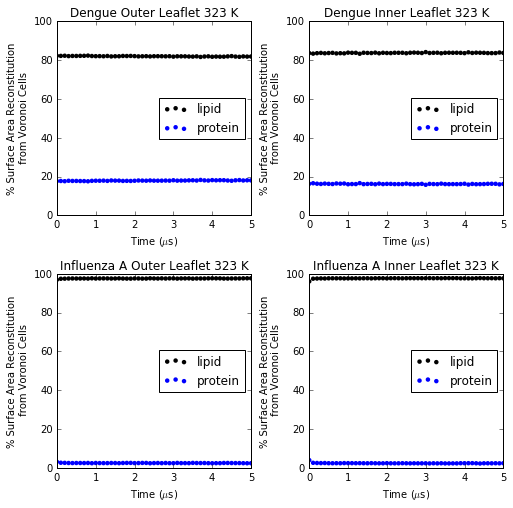

In [56]:
#rough work to update Figure S4 for dengue manuscript:

figure_S4_dengue_paper = plt.figure()

ax = figure_S4_dengue_paper.add_subplot(2,2,1)
dengue_time_array = numpy.arange(len(dengue_list_percent_surface_area_reconstitution_from_lipids_only)) / 10.
ax.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_lipids_only,c = 'k', label = 'lipid',edgecolor='none')
ax.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_proteins_only,c = 'blue', label = 'protein',edgecolor='none')
ax.set_title('Dengue Outer Leaflet 323 K')
ax.set_xlabel('Time ($\mu$s)')
ax.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax.set_ylim(0,100)
ax.legend(loc = 7)
ax.set_xlim(0,5)

ax2 = figure_S4_dengue_paper.add_subplot(2,2,2)
ax2.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet,c = 'k', label = 'lipid',edgecolor='none')
ax2.scatter(dengue_time_array,dengue_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet,c = 'blue', label = 'protein',edgecolor='none')
ax2.set_title('Dengue Inner Leaflet 323 K')
ax2.set_xlabel('Time ($\mu$s)')
ax2.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax2.set_ylim(0,100)
ax2.legend(loc = 7)
ax2.set_xlim(0,5)

ax3 = figure_S4_dengue_paper.add_subplot(2,2,3)
flu_time_array = numpy.arange(len(sim39_list_percent_surface_area_reconstitution_from_lipids_only)) / 10.
ax3.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_lipids_only, c = 'k', label = 'lipid',edgecolor='none')
ax3.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_proteins_only, c = 'blue', label = 'protein',edgecolor='none')
ax3.set_title('Influenza A Outer Leaflet 323 K')
ax3.set_xlabel('Time ($\mu$s)')
ax3.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax3.set_ylim(0,100)
ax3.legend(loc = 7)
ax3.set_xlim(0,5)

ax4 = figure_S4_dengue_paper.add_subplot(2,2,4)
ax4.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_lipids_only_inner_leaflet, c = 'k', label = 'lipid',edgecolor='none')
ax4.scatter(flu_time_array, sim39_list_percent_surface_area_reconstitution_from_proteins_only_inner_leaflet, c = 'blue', label = 'protein',edgecolor='none')
ax4.set_title('Influenza A Inner Leaflet 323 K')
ax4.set_xlabel('Time ($\mu$s)')
ax4.set_ylabel('% Surface Area Reconstitution\n from Voronoi Cells')
ax4.set_ylim(0,100)
ax4.legend(loc = 7)
ax4.set_xlim(0,5)

figure_S4_dengue_paper.subplots_adjust(wspace = 0.3, hspace = 0.3)
figure_S4_dengue_paper.set_size_inches(8,8)
figure_S4_dengue_paper.savefig('Figure_S4.png', dpi = 300)

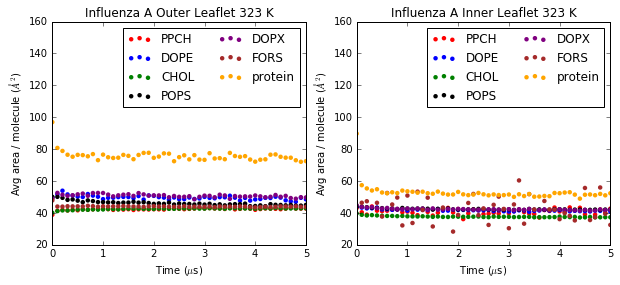

In [57]:
#rough work to produce Figure S5 for dengue manuscript

figure_S5_dengue_paper = plt.figure()

color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
#array_time_values = numpy.array(list_frame_numbers) / 10000. #microseconds

ax = figure_S5_dengue_paper.add_subplot('121')
for residue_name, subdictionary in sim39_dictionary_headgroup_data.iteritems():
    color = color_dict[residue_name]
    array_voronoi_cell_areas = numpy.array(subdictionary['voronoi_cell_avg_values_list'])
    array_time_values = numpy.arange(len(array_voronoi_cell_areas)) / 10.
    ax.scatter(array_time_values,array_voronoi_cell_areas,label=residue_name,edgecolor='None',color=color)
    
ax.legend(loc=1,ncol=2)
ax.set_ylabel('Avg area / molecule ($\AA^2$)')
ax.set_xlim(0,5)
ax.set_xlabel('Time ($\mu$s)')
ax.set_title('Influenza A Outer Leaflet 323 K')
ax.set_ylim(20,160)

ax2 = figure_S5_dengue_paper.add_subplot('122')
for residue_name, subdictionary in sim39_dictionary_headgroup_data.iteritems():
    color = color_dict[residue_name]
    array_voronoi_cell_areas = numpy.array(subdictionary['voronoi_cell_avg_values_list_inner_leaflet'])
    array_time_values = numpy.arange(len(array_voronoi_cell_areas)) / 10.
    ax2.scatter(array_time_values,array_voronoi_cell_areas,label=residue_name,edgecolor='None',color=color)

ax2.legend(loc=1,ncol=2)
ax2.set_ylabel('Avg area / molecule ($\AA^2$)')
ax2.set_xlim(0,5)
ax2.set_xlabel('Time ($\mu$s)')
ax2.set_title('Influenza A Inner Leaflet 323 K')
ax2.set_ylim(20,160)

figure_S5_dengue_paper.set_size_inches(10,4)
figure_S5_dengue_paper.savefig('Figure_S5.png', dpi = 300)

***Update:*** properly splitting the flu proteins into individual TMDs for the purpose of the Voronoi diagrams does not seem to substantially close the gap with dengue (i.e., a substantially higher percentage of the dengue surface area is accounted for by protein TMDs compared to influenza A)

The above plots are a good start for the flu vesicle outer leaflet voronoi parsing. The area per molecule values look more reasonable now. For example, previous DPD simulations for CHOL gave an area of 40.3 A$^2$ (de Meyer and Smit, 2009), and previous monolayer experiments produced an area of 41 A$^2$ for CHOL (Brzozowska and Figaszewski, 2002). Note that the area per molecule plot isn't currently displaying the standard deviations values, which are very large. That might be something to investigate.

The flu vesicle inner leaflet results are now included as well. As with the outer leaflet, the % surface area reconstitution from the Voronoi cells is excellent. The area per molecule for the inner leaflet shows evidence of really tight packing -- CHOL is well below the usual ~40 A$^2$ value, and all lipids seem to be dipping to tighter packing over the course of the 5 $\mu$s simulation. While one might argue that this is evidence that the system has not equilibrated, there is little we can do about this because of the computational cost of the simulations (and most biophysical parameters did appear to be stable). As with the outer leaflet, it will likely eventually be of interest to investigate the standard deviation of the area per molecule values. Finally, I will probably want to firmly establish the basis of the large fluctuations for inner leaflet PPCH -- my suspicion is that this is simply the result of an extremely low PPCH population in this leaflet. 

time to produce plots: 44.0825351477 minutes


/sansom/n22/bioc1009/anaconda_python/anaconda/lib/python2.7/site-packages/matplotlib/axes/_axes.py:519: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


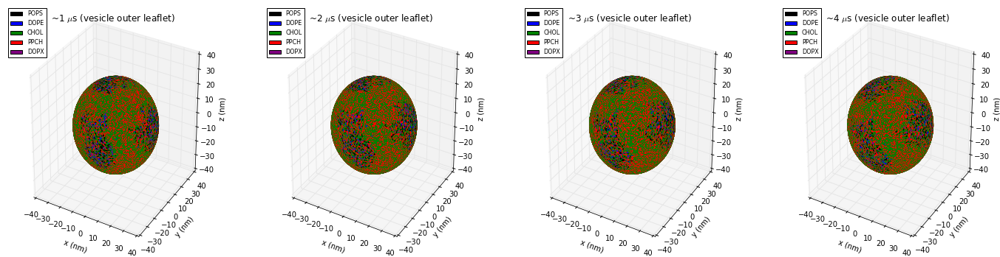

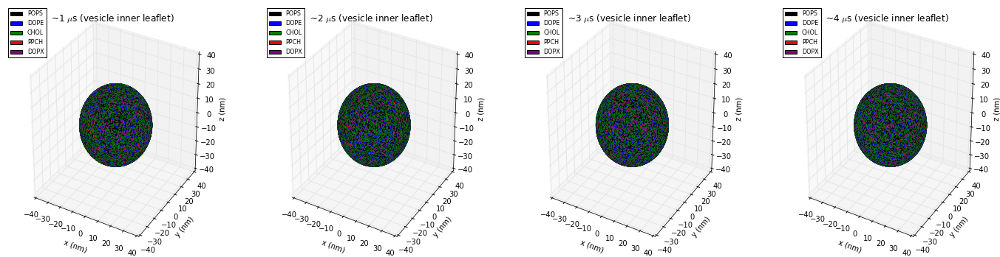

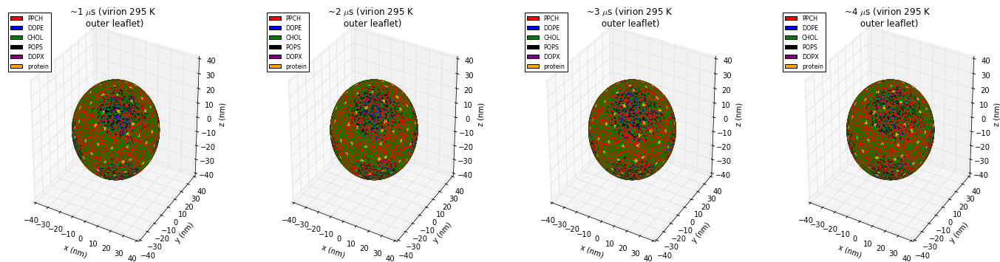

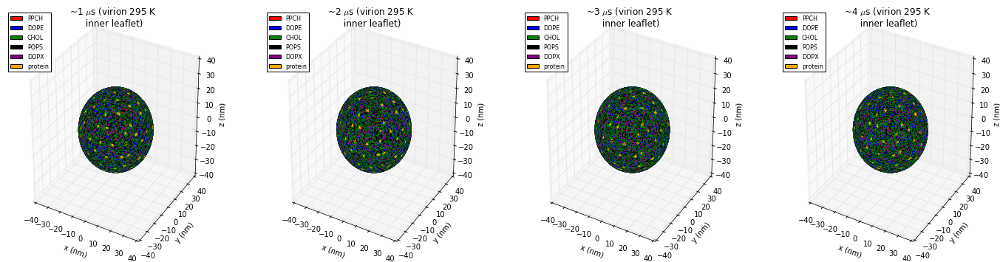

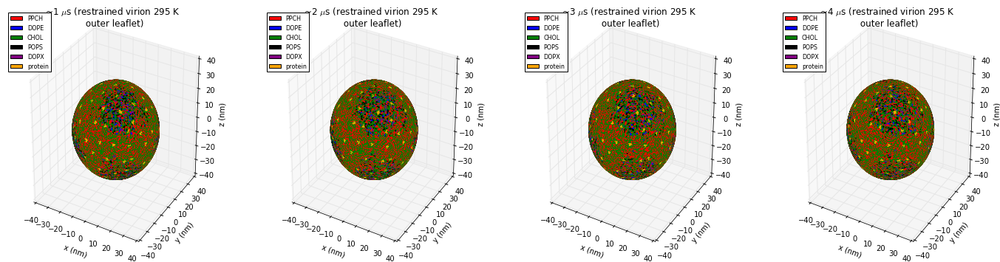

...

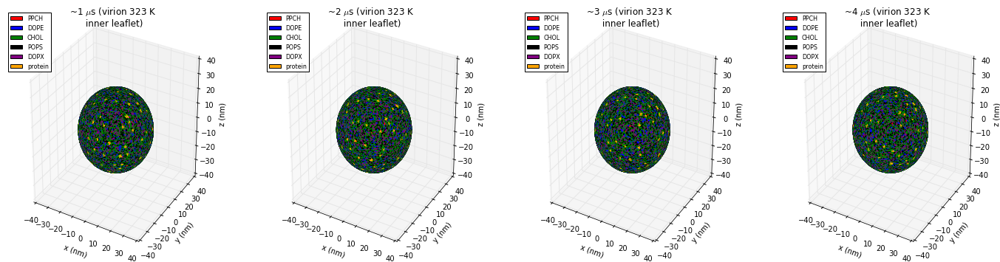

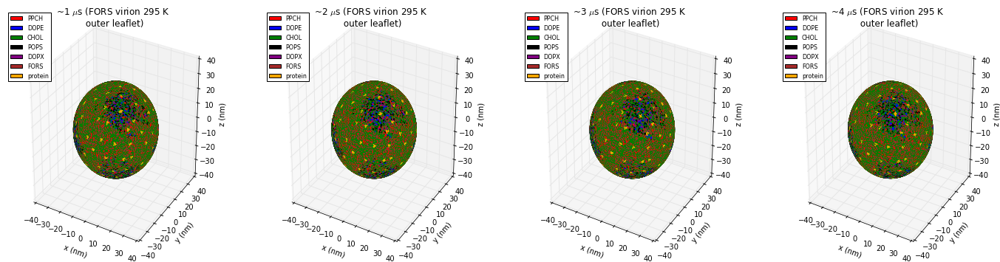

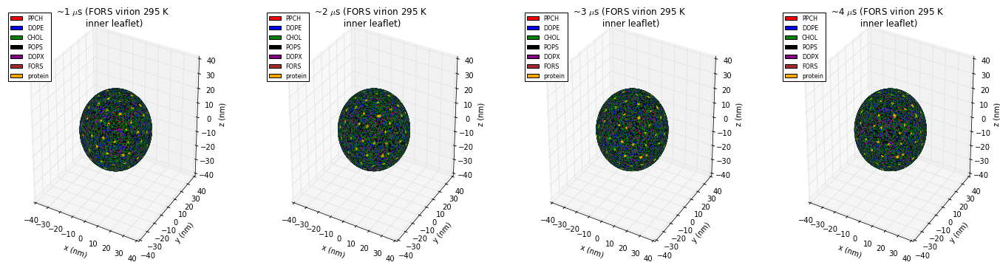

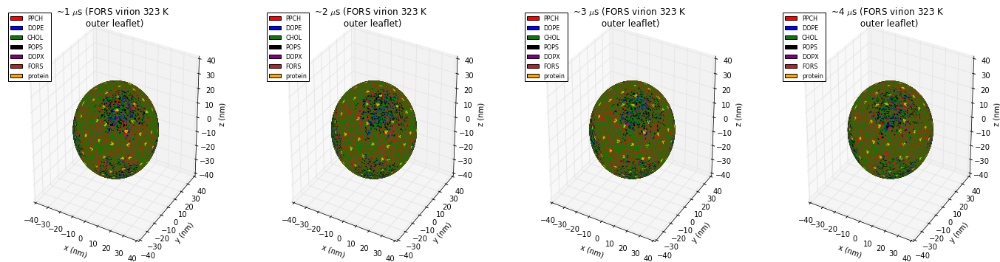

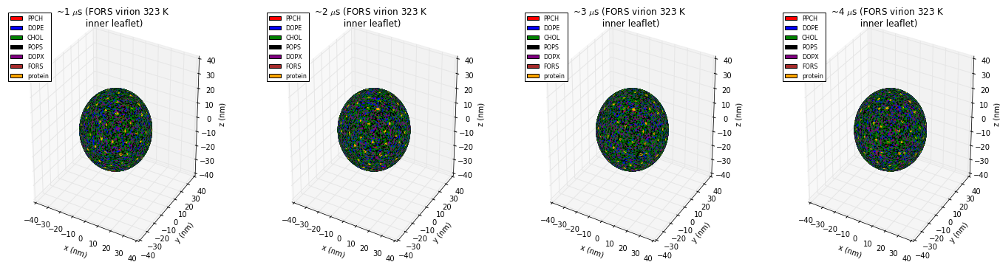

In [58]:
#now for sample spherical Voronoi diagrams for flu vesicle outer leaflet parsing (now working to include inner leaflet as well)
import time
start_time = time.time()

#flu vesicle outer leaflet:
fig3 = plt.figure()
list_voronoi_indices = [7,17,27,37] #start ~ 1 microsecond and work toward ~4 microseconds by skipping 10 indices each time (note that the index values are sensitive to the coarseness of the data parsing prior to this code)
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig3,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','vesicle outer leaflet',sim33_dictionary_headgroup_data)

#flu vesicle inner leaflet:
fig4 = plt.figure()
list_voronoi_indices = [7,17,27,37] #start ~ 1 microsecond and work toward ~4 microseconds by skipping 10 indices each time (note that the index values are sensitive to the coarseness of the data parsing prior to this code)
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig4,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','vesicle inner leaflet',sim33_dictionary_headgroup_data)

#sim35 outer leaflet
fig5 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig5,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 295 K\n outer leaflet',sim35_dictionary_headgroup_data)

#sim35 inner leaflet
fig6 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig6,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 295 K\n inner leaflet',sim35_dictionary_headgroup_data)

#sim36 outer leaflet
fig_sim36_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] #sim36 is shorter so maybe have to be careful here
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim36_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','restrained virion 295 K\n outer leaflet',sim36_dictionary_headgroup_data)

#sim36 inner leaflet
fig_sim36_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim36_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','restrained virion 295 K\n inner leaflet',sim36_dictionary_headgroup_data)

#sim37 outer leaflet
fig_sim37_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim37_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 323 K\n outer leaflet',sim37_dictionary_headgroup_data)

#sim37 inner leaflet
fig_sim37_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim37_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 323 K\n inner leaflet',sim37_dictionary_headgroup_data)

#sim38 outer leaflet
fig_sim38_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim38_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 295 K\n outer leaflet',sim38_dictionary_headgroup_data)

#sim38 inner leaflet
fig_sim38_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim38_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 295 K\n inner leaflet',sim38_dictionary_headgroup_data)

#sim39 outer leaflet
fig_sim39_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40] 
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim39_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 323 K\n outer leaflet',sim39_dictionary_headgroup_data)

#sim39 inner leaflet
fig_sim39_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_sim39_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 323 K\n inner leaflet',sim39_dictionary_headgroup_data)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

time to produce plots: 1.29999970198 minutes


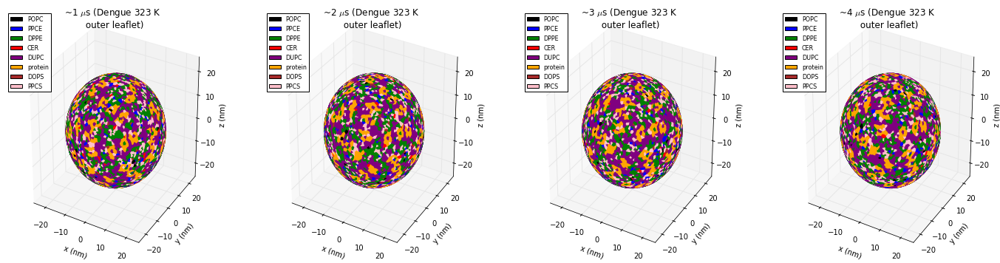

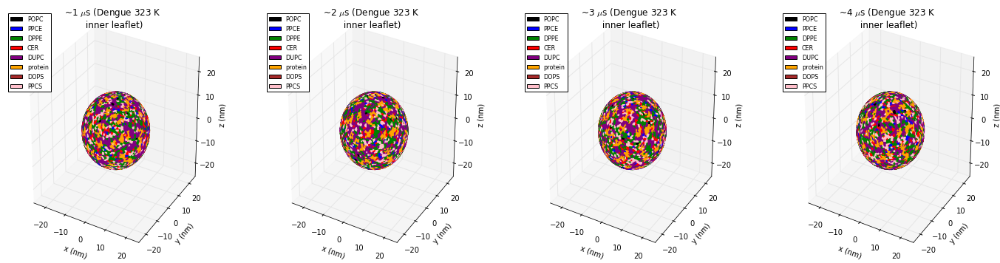

In [59]:
#dengue Voronoi plots (testing phase)
import time #takes a long time to generate these plots -- quantify this while I'm testing dengue plots
start_time = time.time()

fig_dengue_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_dengue_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Dengue 323 K\n outer leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

fig_dengue_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_dengue_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Dengue 323 K\n inner leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

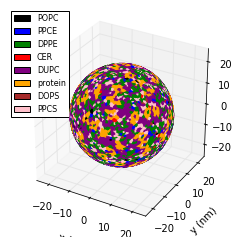

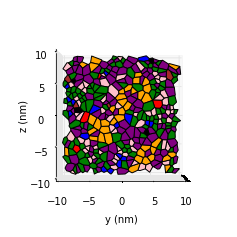

In [60]:
#work to produce high-quality spherical Voronoi images (outer leaflet) at 4us for Dengue 323K and FORS Flu 323K to be used in upcoming SBCB seminar
from matplotlib.patches import Rectangle

dengue_color_dict = {'POPC':'black','PPCE':'blue','DPPE':'green','CER':'red','DUPC':'purple','protein':'orange','DOPS':'brown','PPCS':'pink'}
flu_color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}

#start with dengue at 4 us (outer leaflet):
fig_dengue_outer_leaflet_4us = plt.figure()
fig_dengue_outer_leaflet_4us_zoom = plt.figure()
dengue_list_residue_names = []
ax = fig_dengue_outer_leaflet_4us.add_subplot('111', projection = '3d')
ax_zoom = fig_dengue_outer_leaflet_4us_zoom.add_subplot('111', projection = '3d')
list_residue_names = []
for species_name, subdictionary in dengue_dictionary_headgroup_data.iteritems():
    list_vertex_arrays = subdictionary['voronoi_cell_list_vertex_arrays'][40]
    color = dengue_color_dict[species_name]
    for vertex_array in list_vertex_arrays:
        polygon = Poly3DCollection([vertex_array/10.],alpha=1.0) #convert to nm
        polygon.set_color(color)
        ax.add_collection3d(polygon)
        if numpy.abs(vertex_array[...,1:]).max() <= 99 and vertex_array[...,0].max() >= 0:
            polygon_zoom = Poly3DCollection([vertex_array/10.],alpha=1.0) #convert to nm
            polygon_zoom.set_color(color)
            polygon_zoom.set_edgecolor('black')
            ax_zoom.add_collection3d(polygon_zoom)
    list_residue_names.append(species_name)
list_legend_objects = [Rectangle((0, 0), 1, 1, fc=dengue_color_dict[residue_name]) for residue_name in list_residue_names]
ax.legend(list_legend_objects,list_residue_names,loc=2,prop={'size':8})
ax.set_xlabel('\nx (nm)'); ax.set_ylabel('\ny (nm)'); ax.set_zlabel('\nz (nm)')
ax.set_xlim(-25,25);ax.set_ylim(-25,25);ax.set_zlim(-25,25);
ax_zoom.set_xlim(0,40);
ax_zoom.set_ylim(-10,10);ax_zoom.set_zlim(-10,10);
ax_zoom.azim = 0; ax_zoom.elev = 0
ax_zoom.w_xaxis.set_ticklabels([''])
ax_zoom.set_zlabel('z (nm)')
ax_zoom.set_ylabel('\ny (nm)')
fig_dengue_outer_leaflet_4us.set_size_inches(4,4)
fig_dengue_outer_leaflet_4us_zoom.set_size_inches(4,4)
fig_dengue_outer_leaflet_4us.savefig('dengue_outer_leaflet_4us.png', dpi = 300)
fig_dengue_outer_leaflet_4us_zoom.savefig('dengue_outer_leaflet_4us_zoom.png', dpi = 300)

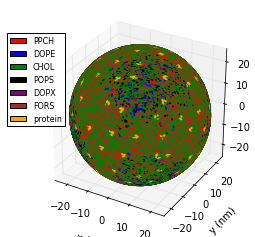

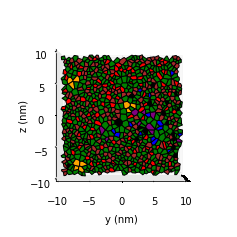

In [61]:
#and now for FORS Flu 323K at 4us (outer leaflet):
fig_sim39_outer_leaflet_4us = plt.figure()
fig_sim39_outer_leaflet_4us_zoom = plt.figure()
sim39_list_residue_names = []
ax = fig_sim39_outer_leaflet_4us.add_subplot('111', projection = '3d')
ax_zoom = fig_sim39_outer_leaflet_4us_zoom.add_subplot('111', projection = '3d')
list_residue_names = []
for species_name, subdictionary in sim39_dictionary_headgroup_data.iteritems():
    list_vertex_arrays = subdictionary['voronoi_cell_list_vertex_arrays'][40]
    color = flu_color_dict[species_name]
    for vertex_array in list_vertex_arrays:
        polygon = Poly3DCollection([vertex_array/10.],alpha=1.0) #convert to nm
        polygon.set_color(color)
        ax.add_collection3d(polygon)
        if numpy.abs(vertex_array[...,1:]).max() <= 99 and vertex_array[...,0].max() >= 0:
            polygon_zoom = Poly3DCollection([vertex_array/10.],alpha=1.0) #convert to nm
            polygon_zoom.set_color(color)
            polygon_zoom.set_edgecolor('black')
            ax_zoom.add_collection3d(polygon_zoom)
    list_residue_names.append(species_name)
list_legend_objects = [Rectangle((0, 0), 1, 1, fc=flu_color_dict[residue_name]) for residue_name in list_residue_names]
ax.legend(list_legend_objects,list_residue_names,loc=2,prop={'size':8}, bbox_to_anchor = [-0.1,0.9])
ax.set_xlabel('\nx (nm)'); ax.set_ylabel('\ny (nm)'); ax.set_zlabel('\nz (nm)')
ax.set_xlim(-25,25);ax.set_ylim(-25,25);ax.set_zlim(-25,25);
ax_zoom.set_xlim(0,40);
ax_zoom.set_ylim(-10,10);ax_zoom.set_zlim(-10,10);
ax_zoom.azim = 0; ax_zoom.elev = 0
ax_zoom.w_xaxis.set_ticklabels([''])
ax_zoom.set_zlabel('z (nm)')
ax_zoom.set_ylabel('\ny (nm)')
fig_sim39_outer_leaflet_4us.set_size_inches(4,4)
fig_sim39_outer_leaflet_4us_zoom.set_size_inches(4,4)
fig_sim39_outer_leaflet_4us.savefig('sim39_outer_leaflet_4us.png', dpi = 300)
fig_sim39_outer_leaflet_4us_zoom.savefig('sim39_outer_leaflet_4us_zoom.png', dpi = 300)

time to produce plots: 14.3494177341 minutes


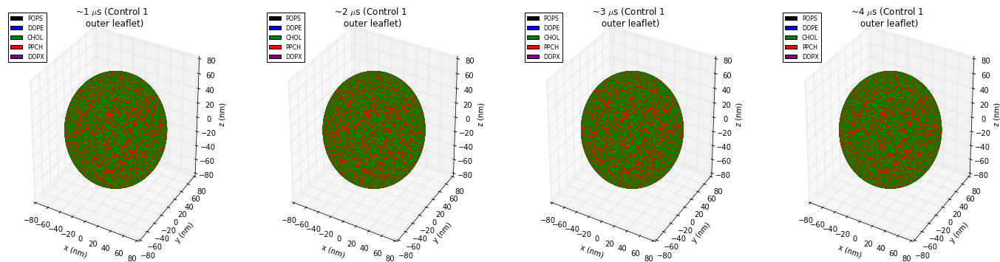

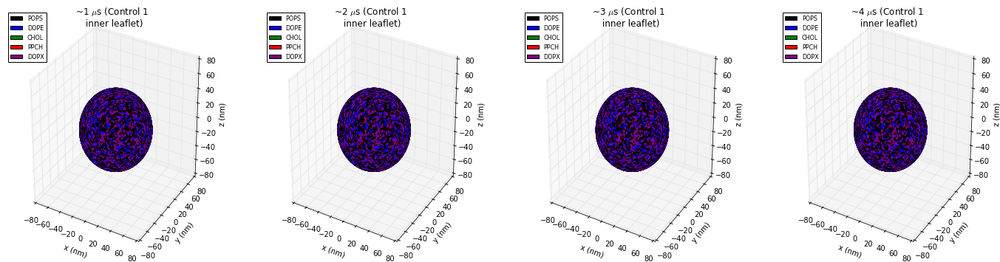

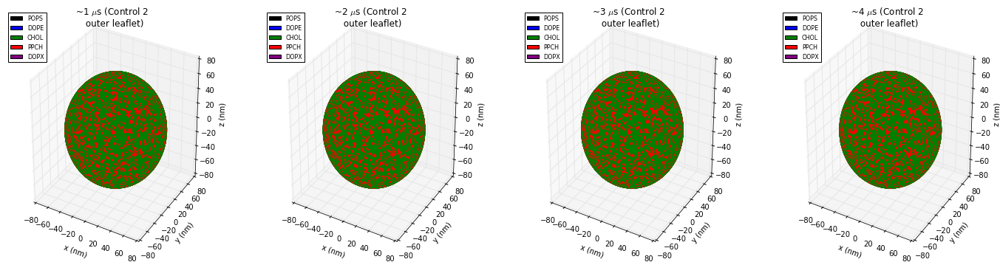

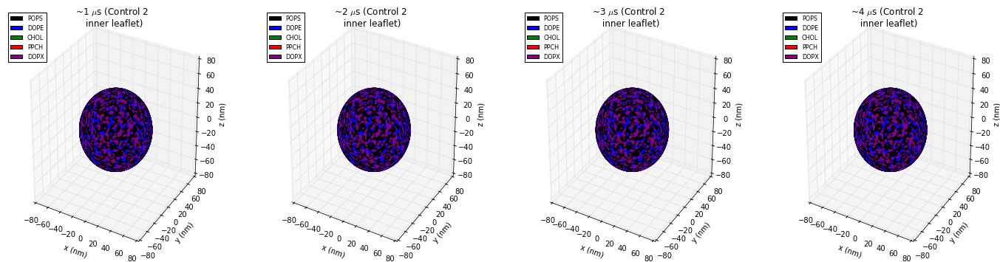

In [62]:
#control Voronoi plots:
import time 
start_time = time.time()

fig_control_1_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_control_1_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 1 \n outer leaflet',control_1_dictionary_headgroup_data,control_condition=1)

fig_control_1_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_control_1_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 1 \n inner leaflet',control_1_dictionary_headgroup_data,control_condition=1)

fig_control_2_outer_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_control_2_outer_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 2 \n outer leaflet',control_2_dictionary_headgroup_data,control_condition=1)

fig_control_2_inner_leaflet = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams(fig_control_2_inner_leaflet,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 2 \n inner leaflet',control_2_dictionary_headgroup_data,control_condition=1)

print 'time to produce plots:', (time.time() - start_time) / 60., 'minutes'

The Voronoi diagrams from the flu vesicle simulation (outer leaflet) look quite sensible. CHOL and PPCH dominate, as expected. The domain segregation is almost certainly the result of the inner leaflet species involuting to the outer leaflet during equilibration / hole closure. By visual inspection, it is actually rather difficult to find any differences between these diagrams from different time points. This is also not particularly surprising given the extremely high CHOL concentration and the extremely slow diffusion of the lipid species.

The next logical step will probably be to extend the analysis workflow above to include the flu vesicle *inner* leaflet.

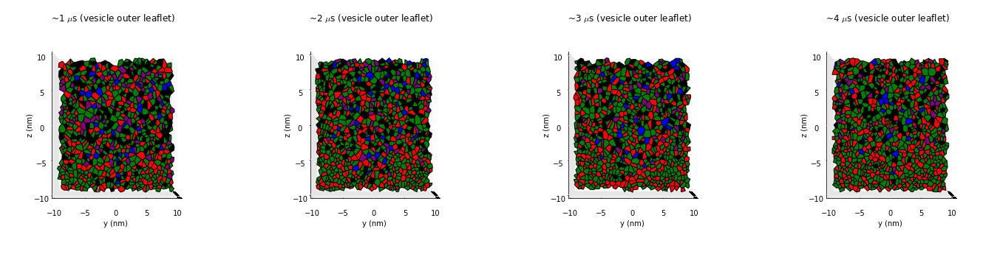

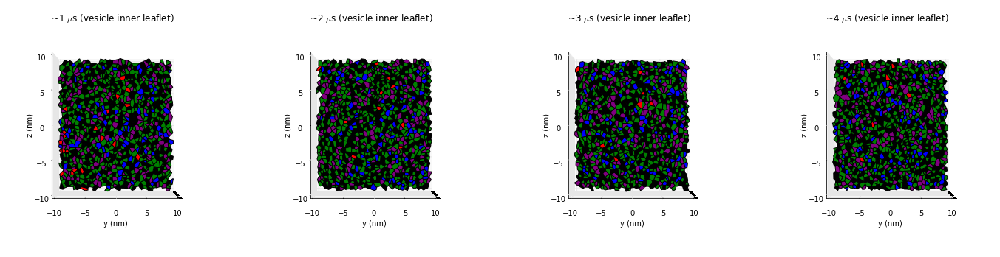

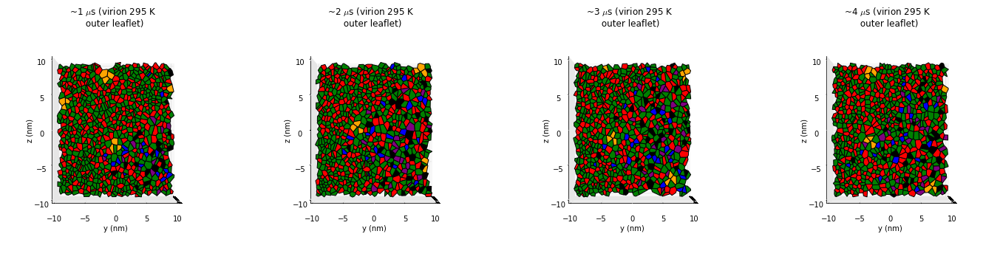

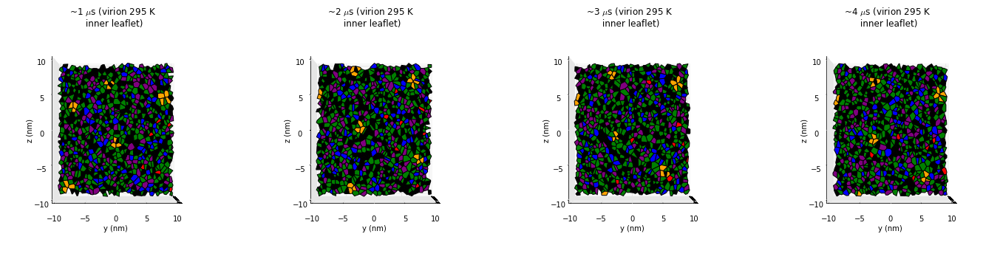

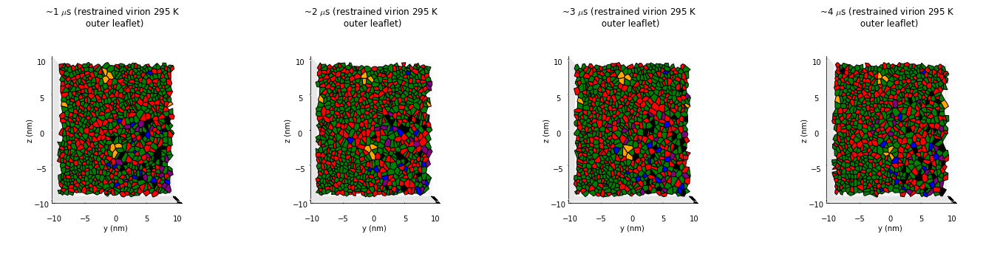

...

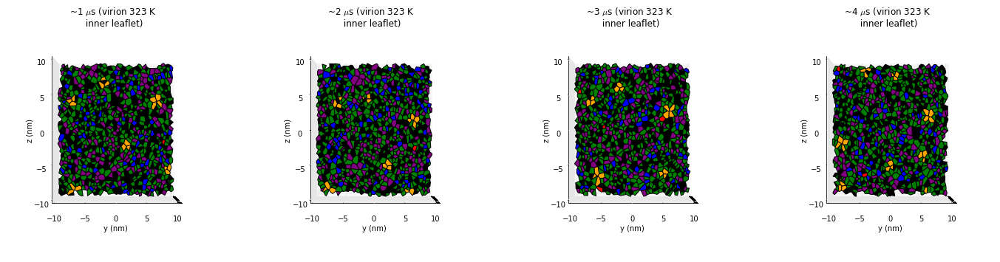

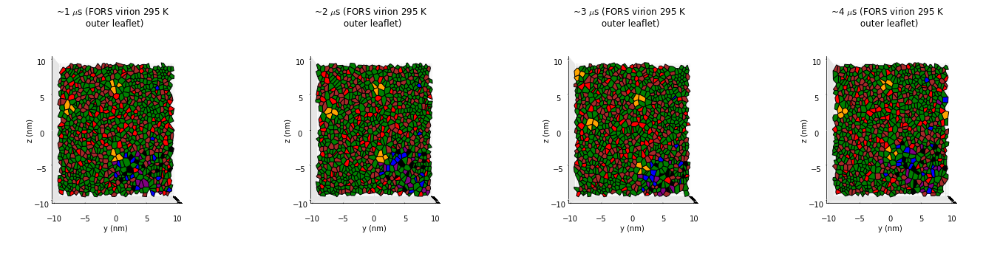

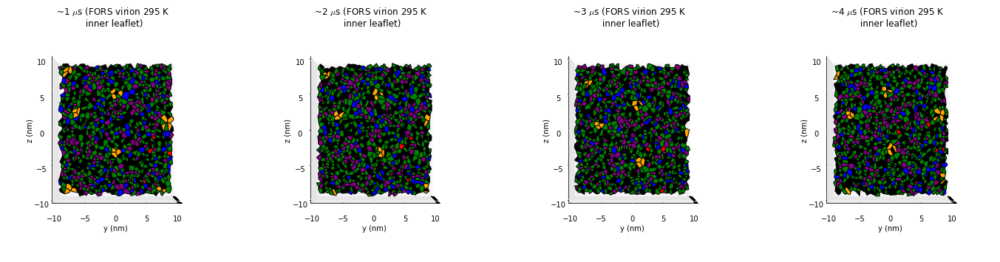

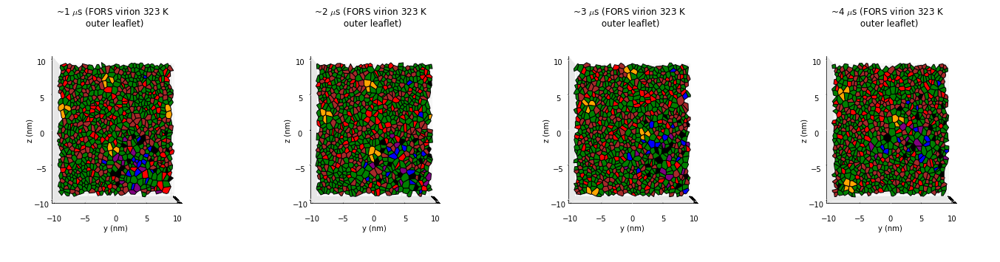

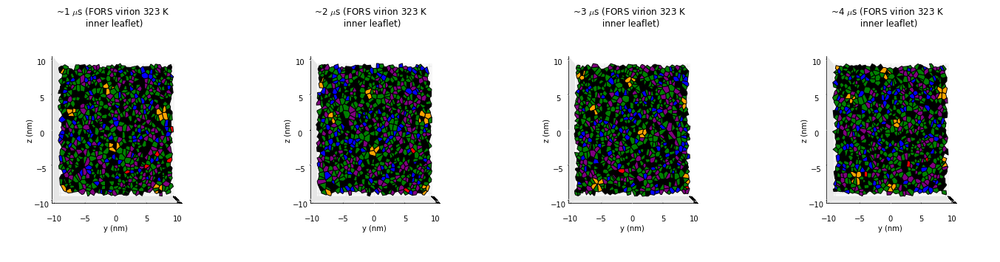

In [63]:
#plot matching zoom-in views of Voronoi diagrams (so Voronoi cells can be seen more clearly)
#sim33 outer leaflet:
fig7 = plt.figure()
list_voronoi_indices = [7,17,27,37] 
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig7,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','vesicle outer leaflet',sim33_dictionary_headgroup_data)
#sim33 inner leaflet:
fig8 = plt.figure()
list_voronoi_indices = [7,17,27,37] 
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig8,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','vesicle inner leaflet',sim33_dictionary_headgroup_data)
#sim35 outer leaflet:
fig9 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig9,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 295 K\n outer leaflet',sim35_dictionary_headgroup_data)
#sim35 inner leaflet:
fig10 = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig10,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 295 K\n inner leaflet',sim35_dictionary_headgroup_data)

#sim36 outer leaflet:
fig_sim36_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim36_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','restrained virion 295 K\n outer leaflet',sim36_dictionary_headgroup_data)
#sim36 inner leaflet:
fig_sim36_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim36_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','restrained virion 295 K\n inner leaflet',sim36_dictionary_headgroup_data)

#sim37 outer leaflet:
fig_sim37_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim37_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','virion 323 K\n outer leaflet',sim37_dictionary_headgroup_data)
#sim37 inner leaflet:
fig_sim37_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim37_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','virion 323 K\n inner leaflet',sim37_dictionary_headgroup_data)

#sim38 outer leaflet:
fig_sim38_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim38_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 295 K\n outer leaflet',sim38_dictionary_headgroup_data)
#sim38 inner leaflet:
fig_sim38_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim38_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 295 K\n inner leaflet',sim38_dictionary_headgroup_data)

#sim39 outer leaflet:
fig_sim39_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim39_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','FORS virion 323 K\n outer leaflet',sim39_dictionary_headgroup_data)
#sim39 inner leaflet:
fig_sim39_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_sim39_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','FORS virion 323 K\n inner leaflet',sim39_dictionary_headgroup_data)

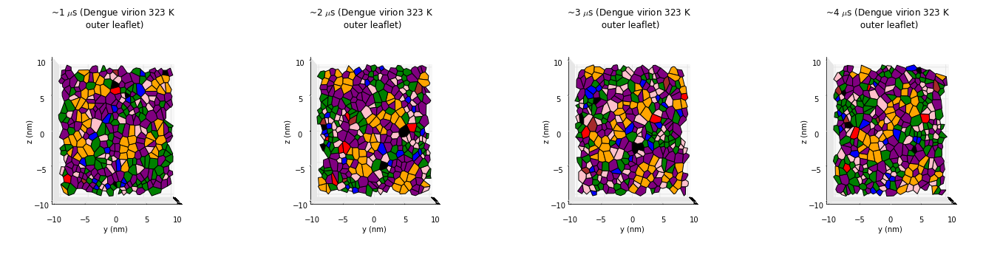

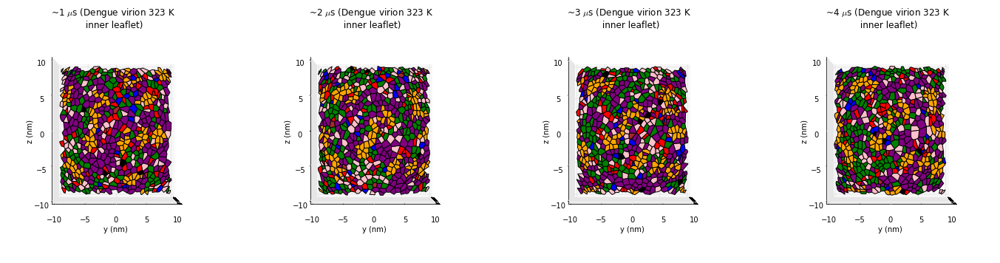

In [64]:
#test zoom plots for dengue condition:

#dengue outer leaflet:
fig_dengue_zoom_outer = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_dengue_zoom_outer,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Dengue virion 323 K\n outer leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)

#dengue inner leaflet:
fig_dengue_zoom_inner = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_dengue_zoom_inner,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Dengue virion 323 K\n inner leaflet',dengue_dictionary_headgroup_data,dengue_condition=1)


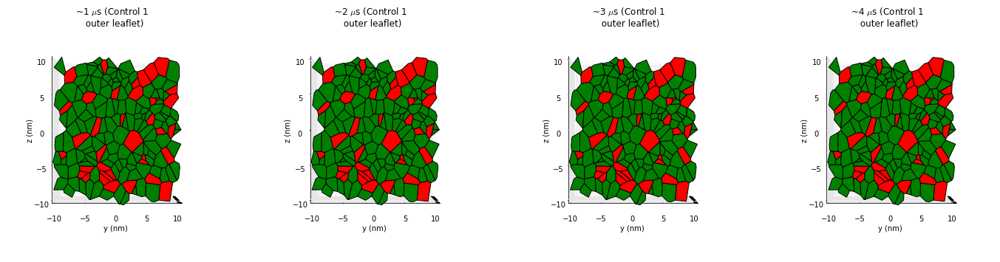

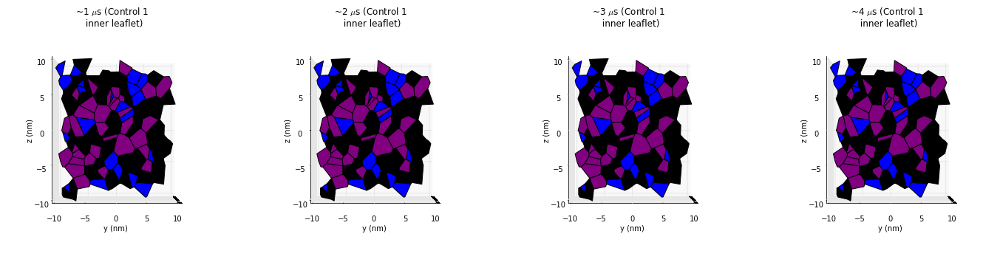

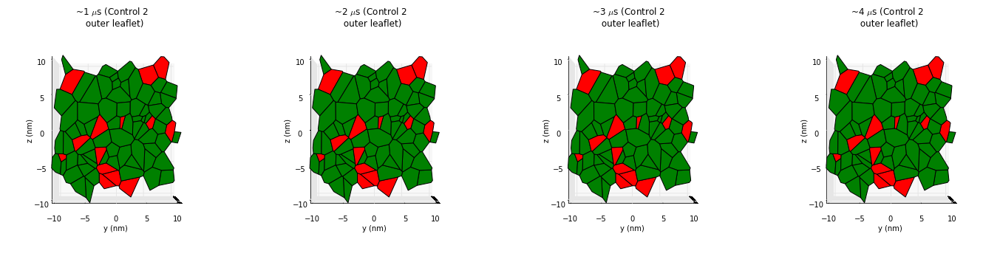

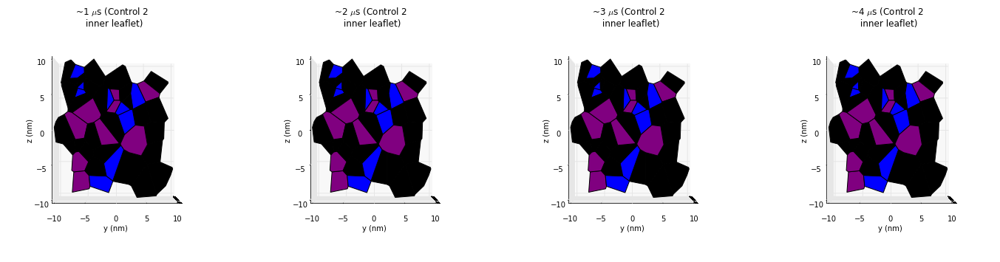

In [872]:
#test zoom plots for control conditions:
#debug blank spaces by plotting generators for these control zoom-in plots

fig_control_1_outer_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_control_1_outer_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 1 \n outer leaflet',control_1_dictionary_headgroup_data,None, outfile_name = 'control_1_outer_leaflet_zoom.png')

fig_control_1_inner_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_control_1_inner_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 1 \n inner leaflet',control_1_dictionary_headgroup_data,None, outfile_name= 'control_1_inner_leaflet_zoom.png')

fig_control_2_outer_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_control_2_outer_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays','Control 2 \n outer leaflet',control_2_dictionary_headgroup_data,None, outfile_name= 'control_2_outer_leaflet_zoom.png')

fig_control_2_inner_leaflet_zoom = plt.figure()
list_voronoi_indices = [10,20,30,40]
voronoi_plotting_library.plot_sample_Voronoi_diagrams_zoom(fig_control_2_inner_leaflet_zoom,list_voronoi_indices,'voronoi_cell_list_vertex_arrays_inner_leaflet','Control 2 \n inner leaflet',control_2_dictionary_headgroup_data,None, outfile_name= 'control_2_inner_leaflet_zoom.png')


In [66]:
#raw neighbour analysis for dengue simulation condition
dengue_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(dengue_dictionary_headgroup_data)

In [67]:
%%time
dengue_inner_leaflet_neighbour_dict_0_us, dengue_outer_leaflet_neighbour_dict_0_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 0)

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [68]:
%%time
dengue_inner_leaflet_neighbour_dict_1_us, dengue_outer_leaflet_neighbour_dict_1_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 10) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [69]:
%%time
dengue_inner_leaflet_neighbour_dict_2_us, dengue_outer_leaflet_neighbour_dict_2_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 20) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [70]:
%%time
dengue_inner_leaflet_neighbour_dict_3_us, dengue_outer_leaflet_neighbour_dict_3_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 30) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [71]:
%%time
dengue_inner_leaflet_neighbour_dict_4_us, dengue_outer_leaflet_neighbour_dict_4_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 40) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

In [72]:
%%time
dengue_inner_leaflet_neighbour_dict_5_us, dengue_outer_leaflet_neighbour_dict_5_us = dengue_neighbour_instance.identify_voronoi_neighbours(frame_index = 50) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER results dict produced.
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS results dict produced.
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPC ( voronoi_cell_list_vertex_arrays )
POPC results dict produced.
PPCE ( voronoi_cell_list_vertex_arrays )
PPCE results dict produced.
DPPE ( voronoi_cell_list_vertex_arrays )
DPPE results dict produced.
CER ( voronoi_cell_list_vertex_arrays )
CER 

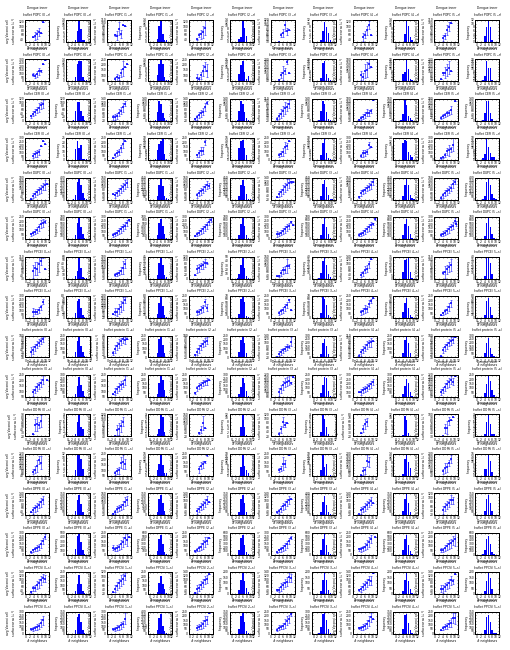

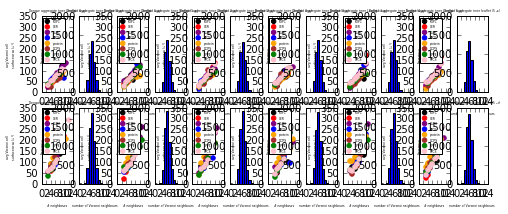

In [790]:
%matplotlib inline 
# %matplotlib notebook doesn't actually improve the plot display because you can only pan along the axes of a single plot, not the entire panel space
#dengue raw neighbour analysis panel plot
molecular_species_count_dictionary = {'POPC': 77, 'PPCE': 319, 'DPPE': 2412, 'CER': 420, 'DUPC': 3117, 'DOPS': 63, 'PPCS': 1467, 'protein': 720 * 2} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
color_dict = {'POPC':'black','PPCE':'blue','DPPE':'green','CER':'red','DUPC':'purple','protein':'orange','DOPS':'brown','PPCS':'pink'}

fig_testing_neighbour_results_dengue = plt.figure()
fig_testing_neighbour_aggregate_results_dengue = plt.figure()
dengue_raw_voronoi_analysis_plotting_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_dengue, dengue_inner_leaflet_neighbour_dict_0_us, dengue_outer_leaflet_neighbour_dict_0_us, simulation_type='dengue')
dengue_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'Dengue', fig_testing_neighbour_aggregate_results_dengue, color_dict, 8.5, 11, [dengue_inner_leaflet_neighbour_dict_1_us,dengue_inner_leaflet_neighbour_dict_2_us,dengue_inner_leaflet_neighbour_dict_3_us,dengue_inner_leaflet_neighbour_dict_4_us,dengue_inner_leaflet_neighbour_dict_5_us], [dengue_outer_leaflet_neighbour_dict_1_us,dengue_outer_leaflet_neighbour_dict_2_us,dengue_outer_leaflet_neighbour_dict_3_us,dengue_outer_leaflet_neighbour_dict_4_us,dengue_outer_leaflet_neighbour_dict_5_us], ['0 $\mu$s', '1 $\mu$s','2 $\mu$s','3 $\mu$s','4 $\mu$s','5 $\mu$s'], hspace = 0.8, wspace = 0.7)
fig_testing_neighbour_results_dengue.savefig('raw_neighbour_voronoi_results_dengue.png', dpi = 300, bbox_inches = 'tight')
fig_testing_neighbour_aggregate_results_dengue.savefig('aggregate_raw_neighbour_voronoi_results_dengue.png', dpi = 300)

In [74]:
#dengue species-based neighbour analysis work
dengue_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(dengue_dictionary_headgroup_data)

In [75]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_0us, outer_leaflet_dengue_neighbour_dict_species_specific_0us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 3min 29s, sys: 16.8 s, total: 3min 46s
Wall time: 4min 2s


In [76]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_1us, outer_leaflet_dengue_neighbour_dict_species_specific_1us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 3min 24s, sys: 27.6 s, total: 3min 51s
Wall time: 4min 14s


In [77]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_2us, outer_leaflet_dengue_neighbour_dict_species_specific_2us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 3min 16s, sys: 19 s, total: 3min 35s
Wall time: 3min 54s


In [78]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_3us, outer_leaflet_dengue_neighbour_dict_species_specific_3us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 3min 6s, sys: 19.1 s, total: 3min 25s
Wall time: 3min 43s


In [79]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_4us, outer_leaflet_dengue_neighbour_dict_species_specific_4us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 3min 20s, sys: 14.1 s, total: 3min 34s
Wall time: 3min 47s


In [80]:
%%time
inner_leaflet_dengue_neighbour_dict_species_specific_5us, outer_leaflet_dengue_neighbour_dict_species_specific_5us = dengue_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 50) 

POPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DPPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CER ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DUPC ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPC ( voronoi_cell_list_vertex_arrays )
PPCE ( voronoi_cell_list_vertex_arrays )
DPPE ( voronoi_cell_list_vertex_arrays )
CER ( voronoi_cell_list_vertex_arrays )
DUPC ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
DOPS ( voronoi_cell_list_vertex_arrays )
PPCS ( voronoi_cell_list_vertex_arrays )
CPU times: user 3min 30s, sys: 18.6 s, total: 3min 48s
Wall time: 4min 4s


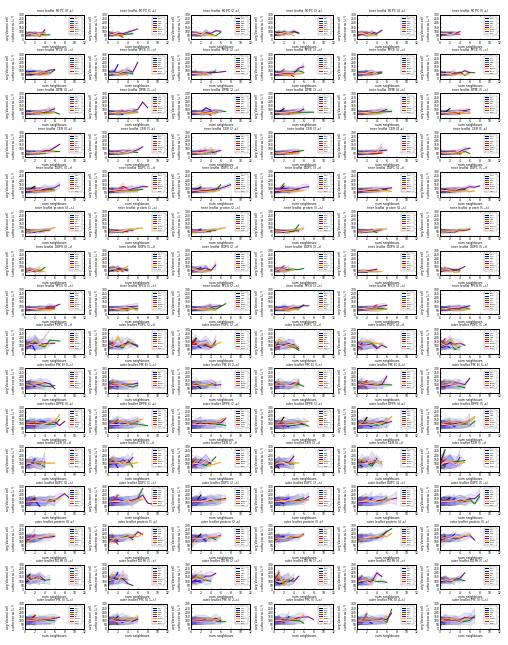

In [810]:
#plots for dengue neighbour species-based analysis
fig_neighbour_species_dengue = plt.figure()
dengue_neighbour_species_plot_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_dengue, inner_leaflet_dengue_neighbour_dict_species_specific_0us, outer_leaflet_dengue_neighbour_dict_species_specific_0us, simulation_type= 'dengue')
dengue_neighbour_species_plot_instance.plot(num_lipid_species = 8, timestamp_list_microseconds = [0, 1, 2, 3, 4, 5], list_additional_inner_leaflet_dicts = [inner_leaflet_dengue_neighbour_dict_species_specific_1us, inner_leaflet_dengue_neighbour_dict_species_specific_2us, inner_leaflet_dengue_neighbour_dict_species_specific_3us, inner_leaflet_dengue_neighbour_dict_species_specific_4us, inner_leaflet_dengue_neighbour_dict_species_specific_5us], list_additional_outer_leaflet_dicts = [outer_leaflet_dengue_neighbour_dict_species_specific_1us, outer_leaflet_dengue_neighbour_dict_species_specific_2us, outer_leaflet_dengue_neighbour_dict_species_specific_3us, outer_leaflet_dengue_neighbour_dict_species_specific_4us, outer_leaflet_dengue_neighbour_dict_species_specific_5us], area_range = (0, 300), max_num_neighbours=14, outfile_path='dengue_species_specific_panel.png', hspace=0.6, wspace=0.4)

In [82]:
#sim39 raw neighbour analysis
sim39_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(sim39_dictionary_headgroup_data)

In [83]:
%%time
sim39_inner_leaflet_neighbour_dict_0_us, sim39_outer_leaflet_neighbour_dict_0_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 0) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( vor

In [84]:
%%time
sim39_inner_leaflet_neighbour_dict_1_us, sim39_outer_leaflet_neighbour_dict_1_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 10) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results di

In [85]:
%%time
sim39_inner_leaflet_neighbour_dict_2_us, sim39_outer_leaflet_neighbour_dict_2_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 20) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_a

In [86]:
%%time
sim39_inner_leaflet_neighbour_dict_3_us, sim39_outer_leaflet_neighbour_dict_3_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 30) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
Problematic spherical polygon SA calculation.
CHOL results di

In [87]:
%%time
sim39_inner_leaflet_neighbour_dict_4_us, sim39_outer_leaflet_neighbour_dict_4_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 40) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
POPS results dict produced.
DOPX ( vor

In [88]:
%%time
sim39_inner_leaflet_neighbour_dict_5_us, sim39_outer_leaflet_neighbour_dict_5_us = sim39_neighbour_instance.identify_voronoi_neighbours(frame_index = 50) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results di

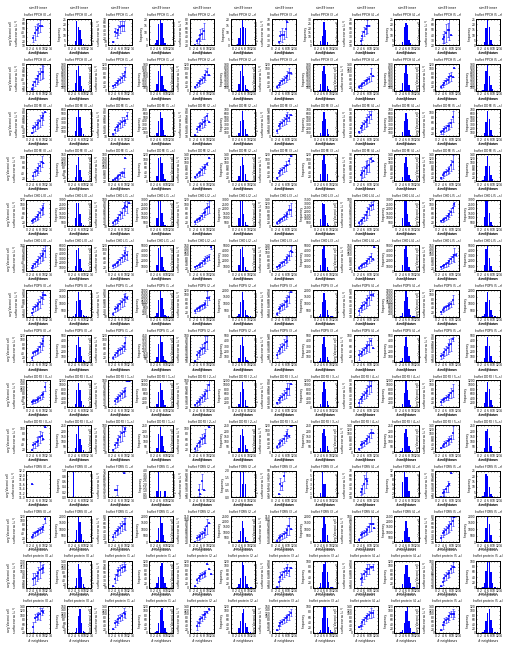

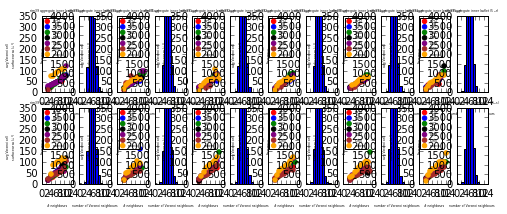

In [787]:
#sim39 raw neighbour data plot:
color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
molecular_species_count_dictionary = {'POPS': 6288, 'DOPX': 3753, 'DOPE': 2111, 'CHOL': 22829, 'FORS':5337, 'PPCH': 2594, 'protein': 2 * (80 * 3 + 12 * 4 + 15 * 4)} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
fig_testing_neighbour_results_sim39 = plt.figure()
fig_testing_neighbour_aggregate_results_sim39 = plt.figure()
sim39_raw_voronoi_analysis_plotting_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_sim39, sim39_inner_leaflet_neighbour_dict_0_us, sim39_outer_leaflet_neighbour_dict_0_us, simulation_type='flu')
sim39_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'sim39', fig_testing_neighbour_aggregate_results_sim39, color_dict, 8.5, 11, [sim39_inner_leaflet_neighbour_dict_1_us,sim39_inner_leaflet_neighbour_dict_2_us,sim39_inner_leaflet_neighbour_dict_3_us,sim39_inner_leaflet_neighbour_dict_4_us,sim39_inner_leaflet_neighbour_dict_5_us], [sim39_outer_leaflet_neighbour_dict_1_us,sim39_outer_leaflet_neighbour_dict_2_us,sim39_outer_leaflet_neighbour_dict_3_us,sim39_outer_leaflet_neighbour_dict_4_us,sim39_outer_leaflet_neighbour_dict_5_us], ['0 $\mu$s', '1 $\mu$s','2 $\mu$s','3 $\mu$s','4 $\mu$s','5 $\mu$s'], general_plots_xmax = 14, aggregate_ymax = 4000, hspace = 0.7, wspace = 0.7)
fig_testing_neighbour_results_sim39.savefig('raw_neighbour_voronoi_results_sim39.png', dpi = 300, bbox_inches = 'tight')
fig_testing_neighbour_aggregate_results_sim39.savefig('aggregate_raw_neighbour_voronoi_results_sim39.png', dpi = 300)

In [90]:
#sim39 species-specific neighbour analysis
sim39_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(sim39_dictionary_headgroup_data)

In [91]:
%%time
sim39_inner_leaflet_neighbour_dict_by_species_0us, sim39_outer_leaflet_neighbour_dict_by_species_0us = sim39_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 
sim39_inner_leaflet_neighbour_dict_by_species_1us, sim39_outer_leaflet_neighbour_dict_by_species_1us = sim39_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 
sim39_inner_leaflet_neighbour_dict_by_species_2us, sim39_outer_leaflet_neighbour_dict_by_species_2us = sim39_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 
sim39_inner_leaflet_neighbour_dict_by_species_3us, sim39_outer_leaflet_neighbour_dict_by_species_3us = sim39_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 
sim39_inner_leaflet_neighbour_dict_by_species_4us, sim39_outer_leaflet_neighbour_dict_by_species_4us = sim39_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 
sim39_inner_leaflet_neighbour_dict_by_species_5us, sim39_outer_leaflet_neighbour_dict_by_species_5us = sim39_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 50) 


PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
POPS ( voronoi_cell_list_vertex_arrays )
DOPX ( voronoi_cell_list_vertex_arrays )
FORS ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( vor

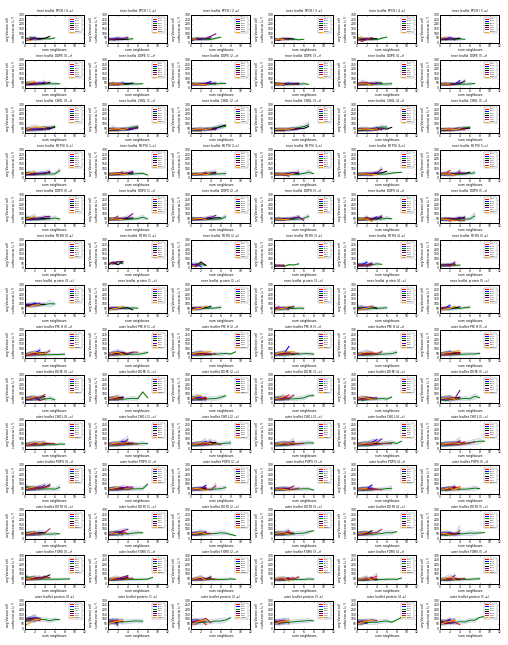

In [811]:
fig_neighbour_species_sim39 = plt.figure()

sim39_neighbour_species_plot_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_sim39, sim39_inner_leaflet_neighbour_dict_by_species_0us, sim39_outer_leaflet_neighbour_dict_by_species_0us, simulation_type = 'flu')
sim39_neighbour_species_plot_instance.plot(num_lipid_species = 7, timestamp_list_microseconds = [0, 1, 2, 3, 4, 5], list_additional_inner_leaflet_dicts = [sim39_inner_leaflet_neighbour_dict_by_species_1us, sim39_inner_leaflet_neighbour_dict_by_species_2us, sim39_inner_leaflet_neighbour_dict_by_species_3us, sim39_inner_leaflet_neighbour_dict_by_species_4us, sim39_inner_leaflet_neighbour_dict_by_species_5us], list_additional_outer_leaflet_dicts = [sim39_outer_leaflet_neighbour_dict_by_species_1us, sim39_outer_leaflet_neighbour_dict_by_species_2us, sim39_outer_leaflet_neighbour_dict_by_species_3us, sim39_outer_leaflet_neighbour_dict_by_species_4us, sim39_outer_leaflet_neighbour_dict_by_species_5us], area_range = (0, 300), max_num_neighbours = 14, outfile_path = 'sim39_species_specific_panel.png', hspace=0.6, wspace=0.4)

In [93]:
#raw neighbour analysis for sim38
sim38_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(sim38_dictionary_headgroup_data)

In [94]:
%%time
sim38_inner_leaflet_neighbour_dict_0_us, sim38_outer_leaflet_neighbour_dict_0_us = sim38_neighbour_instance.identify_voronoi_neighbours(frame_index = 0)
sim38_inner_leaflet_neighbour_dict_1_us, sim38_outer_leaflet_neighbour_dict_1_us = sim38_neighbour_instance.identify_voronoi_neighbours(frame_index = 10)
sim38_inner_leaflet_neighbour_dict_2_us, sim38_outer_leaflet_neighbour_dict_2_us = sim38_neighbour_instance.identify_voronoi_neighbours(frame_index = 20)
sim38_inner_leaflet_neighbour_dict_3_us, sim38_outer_leaflet_neighbour_dict_3_us = sim38_neighbour_instance.identify_voronoi_neighbours(frame_index = 30)
sim38_inner_leaflet_neighbour_dict_4_us, sim38_outer_leaflet_neighbour_dict_4_us = sim38_neighbour_instance.identify_voronoi_neighbours(frame_index = 40)
sim38_inner_leaflet_neighbour_dict_5_us, sim38_outer_leaflet_neighbour_dict_5_us = sim38_neighbour_instance.identify_voronoi_neighbours(frame_index = 49)

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( vor

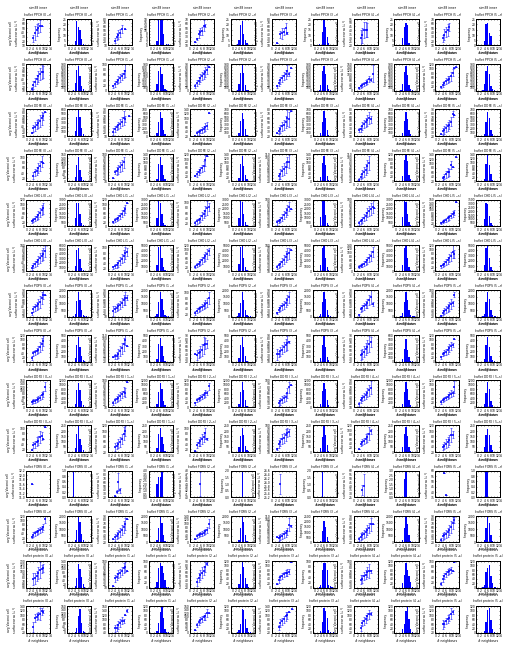

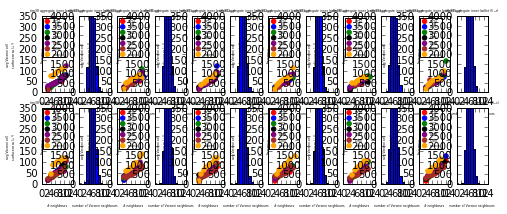

In [786]:
#sim38 raw neighbour plot
color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
molecular_species_count_dictionary = {'POPS': 6288, 'DOPX': 3753, 'DOPE': 2111, 'CHOL': 22829, 'FORS':5337, 'PPCH': 2594, 'protein': 2 * (80 * 3 + 12 * 4 + 15 * 4)} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
fig_testing_neighbour_results_sim38 = plt.figure()
fig_testing_neighbour_aggregate_results_sim38 = plt.figure()
sim38_raw_voronoi_analysis_plotting_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_sim38, sim38_inner_leaflet_neighbour_dict_0_us, sim38_outer_leaflet_neighbour_dict_0_us, simulation_type='flu')
sim38_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'sim38', fig_testing_neighbour_aggregate_results_sim38, color_dict, 8.5, 11, [sim38_inner_leaflet_neighbour_dict_1_us,sim38_inner_leaflet_neighbour_dict_2_us,sim38_inner_leaflet_neighbour_dict_3_us,sim38_inner_leaflet_neighbour_dict_4_us,sim38_inner_leaflet_neighbour_dict_5_us], [sim38_outer_leaflet_neighbour_dict_1_us,sim38_outer_leaflet_neighbour_dict_2_us,sim38_outer_leaflet_neighbour_dict_3_us,sim38_outer_leaflet_neighbour_dict_4_us,sim38_outer_leaflet_neighbour_dict_5_us], ['0 $\mu$s', '1 $\mu$s','2 $\mu$s','3 $\mu$s','4 $\mu$s','5 $\mu$s'], general_plots_xmax = 14, aggregate_ymax = 4000, hspace = 0.7, wspace = 0.7)
fig_testing_neighbour_results_sim38.savefig('raw_neighbour_voronoi_results_sim38.png', dpi = 300, bbox_inches = 'tight')
fig_testing_neighbour_aggregate_results_sim38.savefig('aggregate_raw_neighbour_voronoi_results_sim38.png', dpi = 300)

In [96]:
#sim38 species-specific neighbour analysis:
sim38_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(sim38_dictionary_headgroup_data)

In [97]:
%%time
sim38_inner_leaflet_neighbour_dict_by_species_0us, sim38_outer_leaflet_neighbour_dict_by_species_0us = sim38_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 
sim38_inner_leaflet_neighbour_dict_by_species_1us, sim38_outer_leaflet_neighbour_dict_by_species_1us = sim38_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 
sim38_inner_leaflet_neighbour_dict_by_species_2us, sim38_outer_leaflet_neighbour_dict_by_species_2us = sim38_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 
sim38_inner_leaflet_neighbour_dict_by_species_3us, sim38_outer_leaflet_neighbour_dict_by_species_3us = sim38_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 
sim38_inner_leaflet_neighbour_dict_by_species_4us, sim38_outer_leaflet_neighbour_dict_by_species_4us = sim38_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 
sim38_inner_leaflet_neighbour_dict_by_species_5us, sim38_outer_leaflet_neighbour_dict_by_species_5us = sim38_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 49) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
FORS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
POPS ( voronoi_cell_list_vertex_arrays )
DOPX ( voronoi_cell_list_vertex_arrays )
FORS ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
Problematic spherical polygon SA calculation.
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( vor

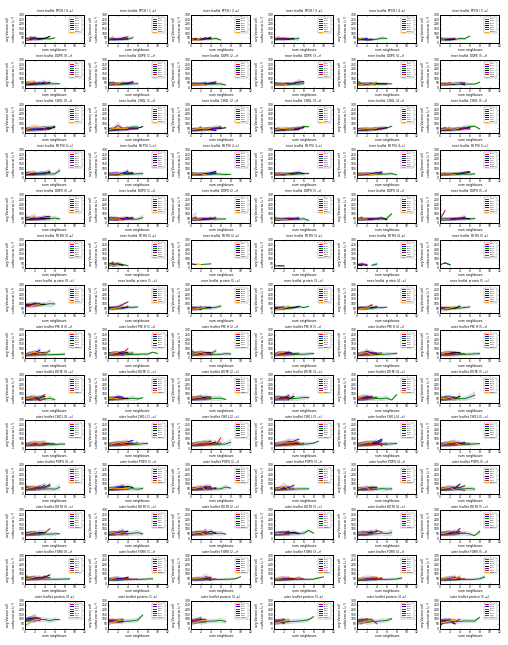

In [812]:
fig_neighbour_species_sim38 = plt.figure()

sim38_neighbour_species_plot_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_sim38, sim38_inner_leaflet_neighbour_dict_by_species_0us, sim38_outer_leaflet_neighbour_dict_by_species_0us, simulation_type = 'flu')
sim38_neighbour_species_plot_instance.plot(num_lipid_species = 7, timestamp_list_microseconds = [0, 1, 2, 3, 4, 5], list_additional_inner_leaflet_dicts = [sim38_inner_leaflet_neighbour_dict_by_species_1us, sim38_inner_leaflet_neighbour_dict_by_species_2us, sim38_inner_leaflet_neighbour_dict_by_species_3us, sim38_inner_leaflet_neighbour_dict_by_species_4us, sim38_inner_leaflet_neighbour_dict_by_species_5us], list_additional_outer_leaflet_dicts = [sim38_outer_leaflet_neighbour_dict_by_species_1us, sim38_outer_leaflet_neighbour_dict_by_species_2us, sim38_outer_leaflet_neighbour_dict_by_species_3us, sim38_outer_leaflet_neighbour_dict_by_species_4us, sim38_outer_leaflet_neighbour_dict_by_species_5us], area_range = (0, 300), max_num_neighbours = 14,outfile_path = 'sim38_species_specific_panel.png', hspace=0.6, wspace=0.4)

In [99]:
%%time
#raw neighbour analysis for sim37
sim37_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(sim37_dictionary_headgroup_data)

sim37_inner_leaflet_neighbour_dict_0_us, sim37_outer_leaflet_neighbour_dict_0_us = sim37_neighbour_instance.identify_voronoi_neighbours(frame_index = 0)
sim37_inner_leaflet_neighbour_dict_1_us, sim37_outer_leaflet_neighbour_dict_1_us = sim37_neighbour_instance.identify_voronoi_neighbours(frame_index = 10)
sim37_inner_leaflet_neighbour_dict_2_us, sim37_outer_leaflet_neighbour_dict_2_us = sim37_neighbour_instance.identify_voronoi_neighbours(frame_index = 20)
sim37_inner_leaflet_neighbour_dict_3_us, sim37_outer_leaflet_neighbour_dict_3_us = sim37_neighbour_instance.identify_voronoi_neighbours(frame_index = 30)
sim37_inner_leaflet_neighbour_dict_4_us, sim37_outer_leaflet_neighbour_dict_4_us = sim37_neighbour_instance.identify_voronoi_neighbours(frame_index = 40)
sim37_inner_leaflet_neighbour_dict_5_us, sim37_outer_leaflet_neighbour_dict_5_us = sim37_neighbour_instance.identify_voronoi_neighbours(frame_index = 49)

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results dict produced.
protein ( voronoi_cell_list_vertex_arrays )
protein results dict produ

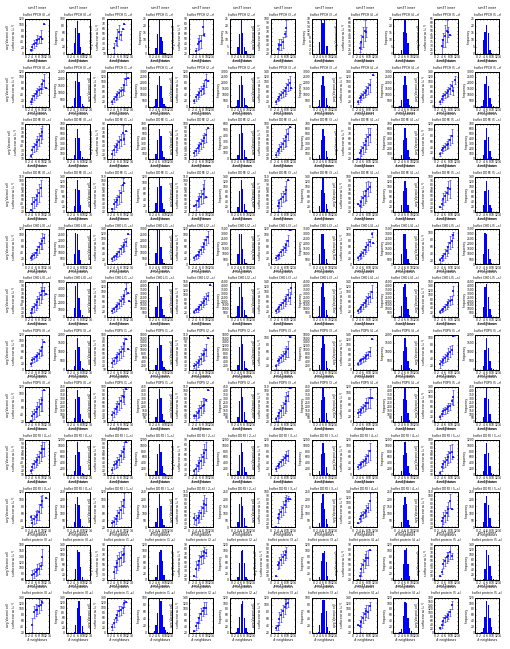

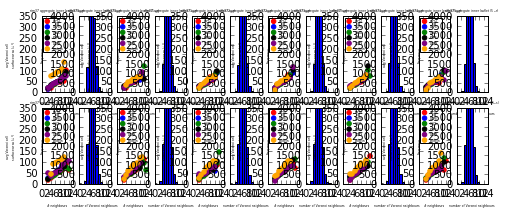

In [782]:
#sim37 raw neighbour plot
color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
molecular_species_count_dictionary = {'POPS': 6288, 'DOPX': 3753, 'DOPE': 2111, 'CHOL': 22829, 'PPCH': 7931, 'protein': 2 * (80 * 3 + 12 * 4 + 15 * 4)} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
fig_testing_neighbour_results_sim37 = plt.figure()
fig_testing_neighbour_aggregate_results_sim37 = plt.figure()
sim37_raw_voronoi_analysis_plotting_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_sim37, sim37_inner_leaflet_neighbour_dict_0_us, sim37_outer_leaflet_neighbour_dict_0_us, simulation_type='flu')
sim37_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'sim37', fig_testing_neighbour_aggregate_results_sim37, color_dict, 8.5, 11, [sim37_inner_leaflet_neighbour_dict_1_us,sim37_inner_leaflet_neighbour_dict_2_us,sim37_inner_leaflet_neighbour_dict_3_us,sim37_inner_leaflet_neighbour_dict_4_us,sim37_inner_leaflet_neighbour_dict_5_us], [sim37_outer_leaflet_neighbour_dict_1_us,sim37_outer_leaflet_neighbour_dict_2_us,sim37_outer_leaflet_neighbour_dict_3_us,sim37_outer_leaflet_neighbour_dict_4_us,sim37_outer_leaflet_neighbour_dict_5_us], ['0 $\mu$s', '1 $\mu$s','2 $\mu$s','3 $\mu$s','4 $\mu$s','5 $\mu$s'], general_plots_xmax = 14, aggregate_ymax = 4000, hspace = 0.5, wspace = 0.7)
fig_testing_neighbour_results_sim37.savefig('raw_neighbour_voronoi_results_sim37.png', dpi = 300, bbox_inches = 'tight')
fig_testing_neighbour_aggregate_results_sim37.savefig('aggregate_raw_neighbour_voronoi_results_sim37.png', dpi = 300)

In [101]:
%%time
#sim37 species-specific neighbour analysis:
sim37_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(sim37_dictionary_headgroup_data)
sim37_inner_leaflet_neighbour_dict_by_species_0us, sim37_outer_leaflet_neighbour_dict_by_species_0us = sim37_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 
sim37_inner_leaflet_neighbour_dict_by_species_1us, sim37_outer_leaflet_neighbour_dict_by_species_1us = sim37_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 
sim37_inner_leaflet_neighbour_dict_by_species_2us, sim37_outer_leaflet_neighbour_dict_by_species_2us = sim37_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 
sim37_inner_leaflet_neighbour_dict_by_species_3us, sim37_outer_leaflet_neighbour_dict_by_species_3us = sim37_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 
sim37_inner_leaflet_neighbour_dict_by_species_4us, sim37_outer_leaflet_neighbour_dict_by_species_4us = sim37_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 
sim37_inner_leaflet_neighbour_dict_by_species_5us, sim37_outer_leaflet_neighbour_dict_by_species_5us = sim37_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 49) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
POPS ( voronoi_cell_list_vertex_arrays )
DOPX ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_lea

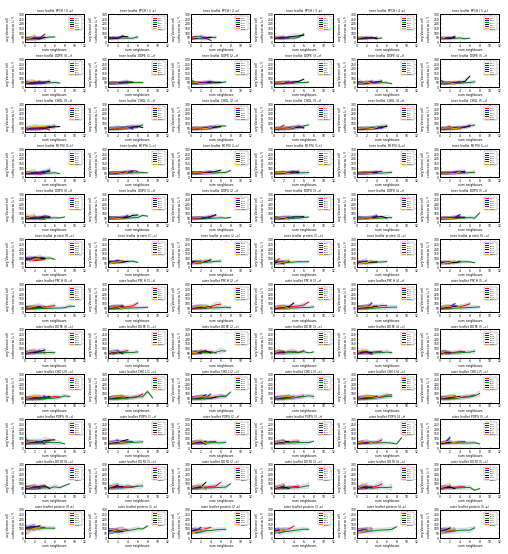

In [813]:
#sim37 species-specific neighbour panel plot
fig_neighbour_species_sim37 = plt.figure()
sim37_neighbour_species_plot_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_sim37, sim37_inner_leaflet_neighbour_dict_by_species_0us, sim37_outer_leaflet_neighbour_dict_by_species_0us, simulation_type = 'flu')
sim37_neighbour_species_plot_instance.plot(num_lipid_species = 7, timestamp_list_microseconds = [0, 1, 2, 3, 4, 5], list_additional_inner_leaflet_dicts = [sim37_inner_leaflet_neighbour_dict_by_species_1us, sim37_inner_leaflet_neighbour_dict_by_species_2us, sim37_inner_leaflet_neighbour_dict_by_species_3us, sim37_inner_leaflet_neighbour_dict_by_species_4us, sim37_inner_leaflet_neighbour_dict_by_species_5us], list_additional_outer_leaflet_dicts = [sim37_outer_leaflet_neighbour_dict_by_species_1us, sim37_outer_leaflet_neighbour_dict_by_species_2us, sim37_outer_leaflet_neighbour_dict_by_species_3us, sim37_outer_leaflet_neighbour_dict_by_species_4us, sim37_outer_leaflet_neighbour_dict_by_species_5us], area_range = (0, 300), max_num_neighbours = 14, outfile_path='sim37_species_specific_panel.png', hspace=0.6, wspace=0.4)

In [103]:
%%time
#start work on raw neighbour analysis for sim36
sim36_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(sim36_dictionary_headgroup_data)
sim36_inner_leaflet_neighbour_dict_0_us, sim36_outer_leaflet_neighbour_dict_0_us = sim36_neighbour_instance.identify_voronoi_neighbours(frame_index = 0)
sim36_inner_leaflet_neighbour_dict_1_us, sim36_outer_leaflet_neighbour_dict_1_us = sim36_neighbour_instance.identify_voronoi_neighbours(frame_index = 10)
sim36_inner_leaflet_neighbour_dict_2_us, sim36_outer_leaflet_neighbour_dict_2_us = sim36_neighbour_instance.identify_voronoi_neighbours(frame_index = 20)
sim36_inner_leaflet_neighbour_dict_3_us, sim36_outer_leaflet_neighbour_dict_3_us = sim36_neighbour_instance.identify_voronoi_neighbours(frame_index = 30)
sim36_inner_leaflet_neighbour_dict_3pt5_us, sim36_outer_leaflet_neighbour_dict_3pt5_us = sim36_neighbour_instance.identify_voronoi_neighbours(frame_index = 35)
sim36_inner_leaflet_neighbour_dict_4_us, sim36_outer_leaflet_neighbour_dict_4_us = sim36_neighbour_instance.identify_voronoi_neighbours(frame_index = 40)

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results dict produced.
protein ( voronoi_cell_list_vertex_arrays )
protein results dict produ

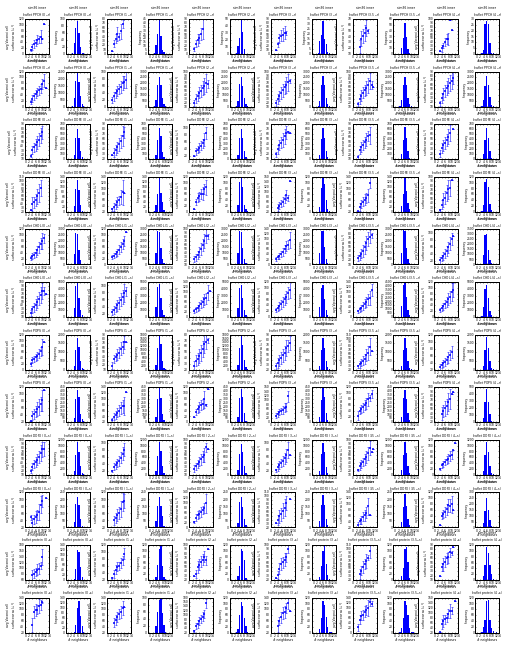

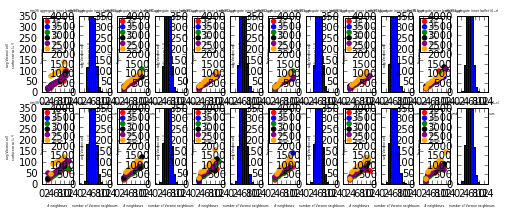

In [780]:
#sim36 raw neighbour plot
color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
molecular_species_count_dictionary = {'POPS': 6288, 'DOPX': 3753, 'DOPE': 2111, 'CHOL': 22829, 'PPCH': 7931, 'protein': 2 * (80 * 3 + 12 * 4 + 15 * 4)} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
fig_testing_neighbour_results_sim36 = plt.figure()
fig_testing_neighbour_aggregate_results_sim36 = plt.figure()
sim36_raw_voronoi_analysis_plotting_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_sim36, sim36_inner_leaflet_neighbour_dict_0_us, sim36_outer_leaflet_neighbour_dict_0_us, simulation_type='flu')
sim36_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'sim36', fig_testing_neighbour_aggregate_results_sim36, color_dict, 8.5, 11, [sim36_inner_leaflet_neighbour_dict_1_us,sim36_inner_leaflet_neighbour_dict_2_us,sim36_inner_leaflet_neighbour_dict_3_us,sim36_inner_leaflet_neighbour_dict_3pt5_us,sim36_inner_leaflet_neighbour_dict_4_us], [sim36_outer_leaflet_neighbour_dict_1_us,sim36_outer_leaflet_neighbour_dict_2_us,sim36_outer_leaflet_neighbour_dict_3_us,sim36_outer_leaflet_neighbour_dict_3pt5_us,sim36_outer_leaflet_neighbour_dict_4_us], ['0 $\mu$s', '1 $\mu$s','2 $\mu$s','3 $\mu$s','3.5 $\mu$s','4 $\mu$s'], general_plots_xmax = 14, aggregate_ymax = 4000, hspace = 0.5, wspace = 0.7)
fig_testing_neighbour_results_sim36.savefig('raw_neighbour_voronoi_results_sim36.png', dpi = 300, bbox_inches = 'tight')
fig_testing_neighbour_aggregate_results_sim36.savefig('aggregate_raw_neighbour_voronoi_results_sim36.png', dpi = 300)

In [105]:
%%time
#sim36 species-specific neighbour analysis:
sim36_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(sim36_dictionary_headgroup_data)
sim36_inner_leaflet_neighbour_dict_by_species_0us, sim36_outer_leaflet_neighbour_dict_by_species_0us = sim36_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 
sim36_inner_leaflet_neighbour_dict_by_species_1us, sim36_outer_leaflet_neighbour_dict_by_species_1us = sim36_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 
sim36_inner_leaflet_neighbour_dict_by_species_2us, sim36_outer_leaflet_neighbour_dict_by_species_2us = sim36_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 
sim36_inner_leaflet_neighbour_dict_by_species_3us, sim36_outer_leaflet_neighbour_dict_by_species_3us = sim36_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 
sim36_inner_leaflet_neighbour_dict_by_species_3pt5us, sim36_outer_leaflet_neighbour_dict_by_species_3pt5us = sim36_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 35) 
sim36_inner_leaflet_neighbour_dict_by_species_4us, sim36_outer_leaflet_neighbour_dict_by_species_4us = sim36_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
POPS ( voronoi_cell_list_vertex_arrays )
DOPX ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHO

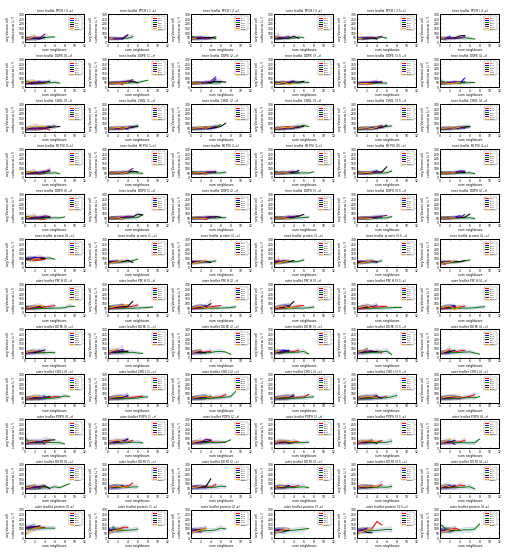

In [814]:
#sim36 species-specific neighbour panel plot
fig_neighbour_species_sim36 = plt.figure()
sim36_neighbour_species_plot_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_sim36, sim36_inner_leaflet_neighbour_dict_by_species_0us, sim36_outer_leaflet_neighbour_dict_by_species_0us, simulation_type='flu')
sim36_neighbour_species_plot_instance.plot(num_lipid_species = 7, timestamp_list_microseconds = [0, 1, 2, 3, 3.5, 4], list_additional_inner_leaflet_dicts = [sim36_inner_leaflet_neighbour_dict_by_species_1us, sim36_inner_leaflet_neighbour_dict_by_species_2us, sim36_inner_leaflet_neighbour_dict_by_species_3us, sim36_inner_leaflet_neighbour_dict_by_species_3pt5us, sim36_inner_leaflet_neighbour_dict_by_species_4us], list_additional_outer_leaflet_dicts = [sim36_outer_leaflet_neighbour_dict_by_species_1us, sim36_outer_leaflet_neighbour_dict_by_species_2us, sim36_outer_leaflet_neighbour_dict_by_species_3us, sim36_outer_leaflet_neighbour_dict_by_species_3pt5us, sim36_outer_leaflet_neighbour_dict_by_species_4us], area_range = (0, 300), max_num_neighbours = 14, outfile_path = 'sim36_species_specific_panel.png', hspace=0.6, wspace=0.4)

In [107]:
%%time
#raw neighbour analysis for sim35
sim35_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(sim35_dictionary_headgroup_data)
sim35_inner_leaflet_neighbour_dict_0_us, sim35_outer_leaflet_neighbour_dict_0_us = sim35_neighbour_instance.identify_voronoi_neighbours(frame_index = 0)
sim35_inner_leaflet_neighbour_dict_1_us, sim35_outer_leaflet_neighbour_dict_1_us = sim35_neighbour_instance.identify_voronoi_neighbours(frame_index = 10)
sim35_inner_leaflet_neighbour_dict_2_us, sim35_outer_leaflet_neighbour_dict_2_us = sim35_neighbour_instance.identify_voronoi_neighbours(frame_index = 20)
sim35_inner_leaflet_neighbour_dict_3_us, sim35_outer_leaflet_neighbour_dict_3_us = sim35_neighbour_instance.identify_voronoi_neighbours(frame_index = 30)
sim35_inner_leaflet_neighbour_dict_4_us, sim35_outer_leaflet_neighbour_dict_4_us = sim35_neighbour_instance.identify_voronoi_neighbours(frame_index = 40)
sim35_inner_leaflet_neighbour_dict_5_us, sim35_outer_leaflet_neighbour_dict_5_us = sim35_neighbour_instance.identify_voronoi_neighbours(frame_index = 49)

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX results dict produced.
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results dict produced.
protein ( voronoi_cell_list_vertex_arrays )
protein results dict produ

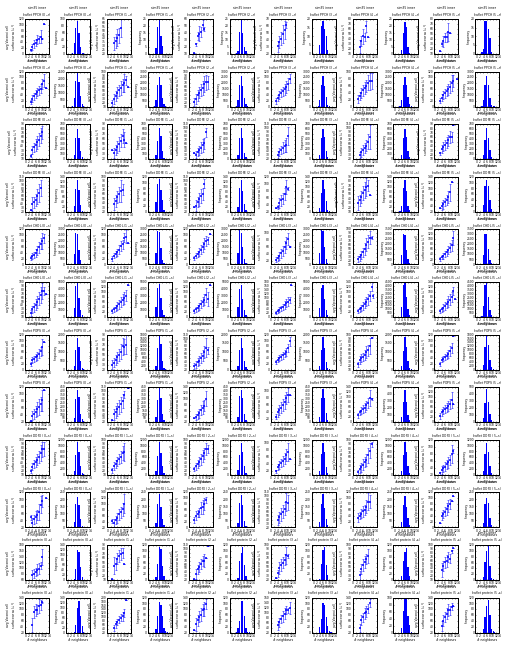

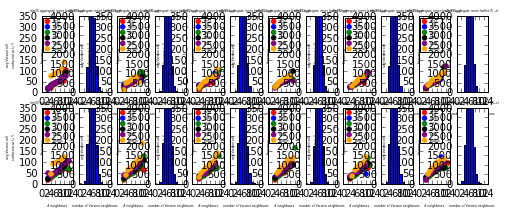

In [778]:
#sim35 raw neighbour plot
color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
molecular_species_count_dictionary = {'POPS': 6288, 'DOPX': 3753, 'DOPE': 2111, 'CHOL': 22829, 'PPCH': 7931, 'protein': 2 * (80 * 3 + 12 * 4 + 15 * 4)} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
fig_testing_neighbour_results_sim35 = plt.figure()
fig_testing_neighbour_aggregate_results_sim35 = plt.figure()
sim35_raw_voronoi_analysis_plotting_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_sim35, sim35_inner_leaflet_neighbour_dict_0_us, sim35_outer_leaflet_neighbour_dict_0_us, simulation_type='flu')
sim35_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'sim35', fig_testing_neighbour_aggregate_results_sim35, color_dict, 8.5, 11, [sim35_inner_leaflet_neighbour_dict_1_us,sim35_inner_leaflet_neighbour_dict_2_us,sim35_inner_leaflet_neighbour_dict_3_us,sim35_inner_leaflet_neighbour_dict_4_us,sim35_inner_leaflet_neighbour_dict_5_us], [sim35_outer_leaflet_neighbour_dict_1_us,sim35_outer_leaflet_neighbour_dict_2_us,sim35_outer_leaflet_neighbour_dict_3_us,sim35_outer_leaflet_neighbour_dict_4_us,sim35_outer_leaflet_neighbour_dict_5_us], ['0 $\mu$s', '1 $\mu$s','2 $\mu$s','3 $\mu$s','4 $\mu$s','5 $\mu$s'], general_plots_xmax = 14, aggregate_ymax = 4000, hspace = 0.5, wspace = 0.7)
fig_testing_neighbour_results_sim35.savefig('raw_neighbour_voronoi_results_sim35.png', dpi = 300, bbox_inches = 'tight')
fig_testing_neighbour_aggregate_results_sim35.savefig('aggregate_raw_neighbour_voronoi_results_sim35.png', dpi = 300)

In [109]:
%%time
#sim35 species-specific neighbour analysis:
sim35_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(sim35_dictionary_headgroup_data)
sim35_inner_leaflet_neighbour_dict_by_species_0us, sim35_outer_leaflet_neighbour_dict_by_species_0us = sim35_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 
sim35_inner_leaflet_neighbour_dict_by_species_1us, sim35_outer_leaflet_neighbour_dict_by_species_1us = sim35_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 
sim35_inner_leaflet_neighbour_dict_by_species_2us, sim35_outer_leaflet_neighbour_dict_by_species_2us = sim35_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 
sim35_inner_leaflet_neighbour_dict_by_species_3us, sim35_outer_leaflet_neighbour_dict_by_species_3us = sim35_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 
sim35_inner_leaflet_neighbour_dict_by_species_4us, sim35_outer_leaflet_neighbour_dict_by_species_4us = sim35_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 
sim35_inner_leaflet_neighbour_dict_by_species_5us, sim35_outer_leaflet_neighbour_dict_by_species_5us = sim35_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 49) 

PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
POPS ( voronoi_cell_list_vertex_arrays )
DOPX ( voronoi_cell_list_vertex_arrays )
protein ( voronoi_cell_list_vertex_arrays )
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
protein ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHO

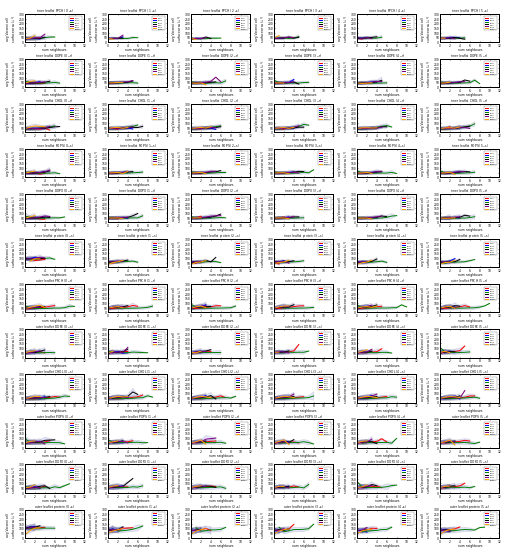

In [815]:
#sim35 species-specific neighbour panel plot
fig_neighbour_species_sim35 = plt.figure()
sim35_neighbour_species_plot_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_sim35, sim35_inner_leaflet_neighbour_dict_by_species_0us, sim35_outer_leaflet_neighbour_dict_by_species_0us, simulation_type='flu')
sim35_neighbour_species_plot_instance.plot(num_lipid_species = 7, timestamp_list_microseconds = [0, 1, 2, 3, 4, 5], list_additional_inner_leaflet_dicts = [sim35_inner_leaflet_neighbour_dict_by_species_1us, sim35_inner_leaflet_neighbour_dict_by_species_2us, sim35_inner_leaflet_neighbour_dict_by_species_3us, sim35_inner_leaflet_neighbour_dict_by_species_4us, sim35_inner_leaflet_neighbour_dict_by_species_5us], list_additional_outer_leaflet_dicts = [sim35_outer_leaflet_neighbour_dict_by_species_1us, sim35_outer_leaflet_neighbour_dict_by_species_2us, sim35_outer_leaflet_neighbour_dict_by_species_3us, sim35_outer_leaflet_neighbour_dict_by_species_4us, sim35_outer_leaflet_neighbour_dict_by_species_5us], area_range = (0, 300), max_num_neighbours = 14, outfile_path='sim35_species_specific_panel.png', hspace=0.6, wspace=0.4)

In [111]:
%%time
#start work on raw neighbour analysis for sim33
sim33_neighbour_instance = voronoi_analysis_library.voronoi_neighbour_analysis(sim33_dictionary_headgroup_data)
#the changes in projected leaflet radii are inferred directly from the Voronoi cell coordinates in the data dictionary (and the leaflet projections to perfect spheres are performed in voronoi_analysis_loop above)
sim33_inner_leaflet_neighbour_dict_0_us, sim33_outer_leaflet_neighbour_dict_0_us = sim33_neighbour_instance.identify_voronoi_neighbours(frame_index = 0)
sim33_inner_leaflet_neighbour_dict_1_us, sim33_outer_leaflet_neighbour_dict_1_us = sim33_neighbour_instance.identify_voronoi_neighbours(frame_index = 10)
sim33_inner_leaflet_neighbour_dict_2_us, sim33_outer_leaflet_neighbour_dict_2_us = sim33_neighbour_instance.identify_voronoi_neighbours(frame_index = 20)
sim33_inner_leaflet_neighbour_dict_3_us, sim33_outer_leaflet_neighbour_dict_3_us = sim33_neighbour_instance.identify_voronoi_neighbours(frame_index = 30)
sim33_inner_leaflet_neighbour_dict_4_us, sim33_outer_leaflet_neighbour_dict_4_us = sim33_neighbour_instance.identify_voronoi_neighbours(frame_index = 40)

POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
CHOL results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
DOPX results dict produced.
( voronoi_cell_list_vertex_arrays_inner_leaflet ) overall results dict produced.
POPS ( voronoi_cell_list_vertex_arrays )
POPS results dict produced.
DOPE ( voronoi_cell_list_vertex_arrays )
DOPE results dict produced.
CHOL ( voronoi_cell_list_vertex_arrays )
CHOL results dict produced.
PPCH ( voronoi_cell_list_vertex_arrays )
PPCH results dict produced.
DOPX ( voronoi_cell_list_vertex_arrays )
DOPX results dict produced.
( voronoi_cell_list_vertex_arrays ) overall results dict produced.


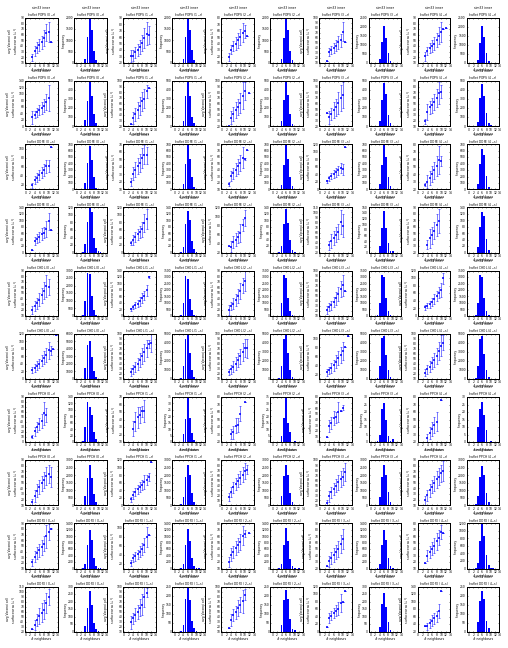

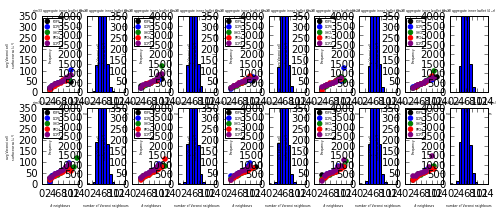

In [775]:
#sim33 raw neighbour plot
color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
molecular_species_count_dictionary = {'POPS': 6802, 'DOPX': 4081, 'DOPE': 2268, 'CHOL': 23804, 'PPCH': 8389} #for ensuring that total frequencies of a given molecular species match the amount of that species in the system
fig_testing_neighbour_results_sim33 = plt.figure()
fig_testing_neighbour_aggregate_results_sim33 = plt.figure()
sim33_raw_voronoi_analysis_plotting_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_raw(fig_testing_neighbour_results_sim33, sim33_inner_leaflet_neighbour_dict_0_us, sim33_outer_leaflet_neighbour_dict_0_us, simulation_type='flu')
sim33_raw_voronoi_analysis_plotting_instance.plot(molecular_species_count_dictionary, 'sim33', fig_testing_neighbour_aggregate_results_sim33, color_dict, 8.5, 11, [sim33_inner_leaflet_neighbour_dict_1_us,sim33_inner_leaflet_neighbour_dict_2_us,sim33_inner_leaflet_neighbour_dict_3_us,sim33_inner_leaflet_neighbour_dict_4_us], [sim33_outer_leaflet_neighbour_dict_1_us,sim33_outer_leaflet_neighbour_dict_2_us,sim33_outer_leaflet_neighbour_dict_3_us,sim33_outer_leaflet_neighbour_dict_4_us], ['0 $\mu$s', '1 $\mu$s','2 $\mu$s','3 $\mu$s','4 $\mu$s'], general_plots_xmax = 14, aggregate_ymax = 4000)
fig_testing_neighbour_results_sim33.savefig('raw_neighbour_voronoi_results_sim33.png', dpi = 300, bbox_inches = 'tight')
fig_testing_neighbour_aggregate_results_sim33.savefig('aggregate_raw_neighbour_voronoi_results_sim33.png', dpi = 300)

In [113]:
%%time
#sim33 species-specific neighbour analysis:
sim33_neighbour_instance_by_species = voronoi_analysis_library.voronoi_neighbour_analysis_by_type(sim33_dictionary_headgroup_data)
sim33_inner_leaflet_neighbour_dict_by_species_0us, sim33_outer_leaflet_neighbour_dict_by_species_0us = sim33_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 0) 
sim33_inner_leaflet_neighbour_dict_by_species_1us, sim33_outer_leaflet_neighbour_dict_by_species_1us = sim33_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 10) 
sim33_inner_leaflet_neighbour_dict_by_species_2us, sim33_outer_leaflet_neighbour_dict_by_species_2us = sim33_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 20) 
sim33_inner_leaflet_neighbour_dict_by_species_3us, sim33_outer_leaflet_neighbour_dict_by_species_3us = sim33_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 30) 
sim33_inner_leaflet_neighbour_dict_by_species_4us, sim33_outer_leaflet_neighbour_dict_by_species_4us = sim33_neighbour_instance_by_species.identify_voronoi_neighbours(frame_index = 40) 

POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
Problematic spherical polygon SA calculation.
POPS ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
PPCH ( voronoi_cell_list_vertex_arrays )
DOPX ( voronoi_cell_list_vertex_arrays )
POPS ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPE ( voronoi_cell_list_vertex_arrays_inner_leaflet )
CHOL ( voronoi_cell_list_vertex_arrays_inner_leaflet )
PPCH ( voronoi_cell_list_vertex_arrays_inner_leaflet )
DOPX ( voronoi_cell_list_vertex_arrays_inner_leaflet )
POPS ( voronoi_cell_list_vertex_arrays )
DOPE ( voronoi_cell_list_vertex_arrays )
CHOL ( voronoi_cell_list_vertex_arrays )
PPCH ( voronoi_cell_list_verte

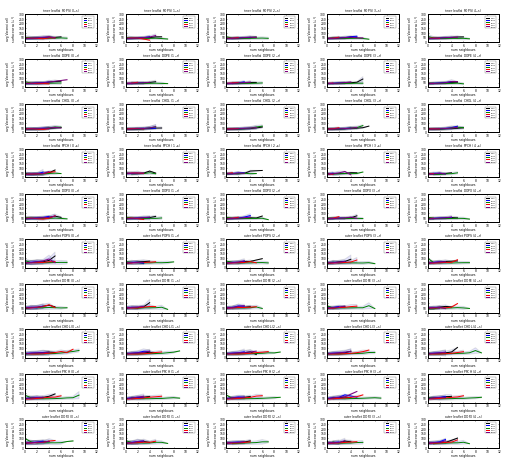

In [817]:
#sim33 species-specific neighbour panel plot
fig_neighbour_species_sim33 = plt.figure()
sim33_neighbour_species_plot_instance = voronoi_plotting_library.plot_voronoi_neighbour_data_species_specific(fig_neighbour_species_sim33, sim33_inner_leaflet_neighbour_dict_by_species_0us, sim33_outer_leaflet_neighbour_dict_by_species_0us, simulation_type= 'flu')
sim33_neighbour_species_plot_instance.plot(num_lipid_species = 7, timestamp_list_microseconds = [0, 1, 2, 3, 4], list_additional_inner_leaflet_dicts = [sim33_inner_leaflet_neighbour_dict_by_species_1us, sim33_inner_leaflet_neighbour_dict_by_species_2us, sim33_inner_leaflet_neighbour_dict_by_species_3us, sim33_inner_leaflet_neighbour_dict_by_species_4us], list_additional_outer_leaflet_dicts = [sim33_outer_leaflet_neighbour_dict_by_species_1us, sim33_outer_leaflet_neighbour_dict_by_species_2us, sim33_outer_leaflet_neighbour_dict_by_species_3us, sim33_outer_leaflet_neighbour_dict_by_species_4us], area_range = (0, 300), max_num_neighbours = 14, outfile_path='sim33_species_specific_panel.png', hspace=0.6, wspace=0.4)

In [115]:
#rough work to test code involved in producing specific example cases of a molecular species surrouned by N neighbours


In [116]:
%%time
#as an example, do min and max raw neighbour Voronoi cell extraction analysis for sim39 at 4 us / outer leaflet CHOL
sim39_raw_neighbour_instance_for_sample_plot = voronoi_analysis_library.voronoi_neighbour_analysis(sim39_dictionary_headgroup_data)
sim39_dict_sample_neighbour_results_4_us_outer_leaflet_CHOL_11_neighbours = sim39_raw_neighbour_instance_for_sample_plot.sample_neighbour_data(40, 'CHOL', 11, 'outer')
sim39_dict_sample_neighbour_results_4_us_outer_leaflet_CHOL_3_neighbours = sim39_raw_neighbour_instance_for_sample_plot.sample_neighbour_data(40, 'CHOL', 3, 'outer')

CPU times: user 2min 46s, sys: 3.44 s, total: 2min 50s
Wall time: 2min 51s


In [117]:
%%time
#perform a similar raw neighbour max/min analysis at the same time point for the dengue simulation
dengue_raw_neighbour_instance_for_sample_plot = voronoi_analysis_library.voronoi_neighbour_analysis(dengue_dictionary_headgroup_data)
dengue_dict_sample_neighbour_results_4_us_outer_leaflet_DUPC_11_neighbours = dengue_raw_neighbour_instance_for_sample_plot.sample_neighbour_data(40, 'DUPC', 11, 'outer')
dengue_dict_sample_neighbour_results_4_us_outer_leaflet_DUPC_3_neighbours = dengue_raw_neighbour_instance_for_sample_plot.sample_neighbour_data(40, 'DUPC', 3, 'outer')

CPU times: user 4.08 s, sys: 8.43 ms, total: 4.09 s
Wall time: 4.09 s


In [177]:
dengue_dict_sample_neighbour_results_4_us_outer_leaflet_DUPC_3_neighbours

{'central_cell': array([[-210.90312689,   26.10892476,   29.85557094],
        [-211.56828089,   28.70617519,   21.63279976],
        [-212.52642159,   18.7776801 ,   23.08850055]]),
 'neighbours': defaultdict(<function voronoi_analysis_library.default_factory>,
             {'DPPE': [array([[-210.86975089,   26.18938752,   30.02039539],
                      [-209.72554614,   33.67768694,   30.56417345],
                      [-208.95097028,   42.0705703 ,   24.95434096],
                      [-209.01641775,   41.97008344,   24.57252952],
                      [-209.34942   ,   41.170447  ,   23.04288692],
                      [-211.51450212,   30.50170108,   19.60667292],
                      [-211.56828089,   28.70617519,   21.63279976],
                      [-210.90312689,   26.10892476,   29.85557094]])],
              'DUPC': [array([[-210.86975089,   26.18938752,   30.02039539],
                      [-210.53958283,   23.5310422 ,   34.24228547],
                      [-210.

In [471]:
###### rough work for part of Figure (sample_neighbours)
#rough work as I attempt to extract the coordinates of the original residues corresponding to the Voronoi regions plotted below (requested by Mark)
print engine_dengue['universe_object.trajectory.n_frames'], engine_sim39['universe_object.trajectory.n_frames']
#should use ~frame 4000 for dengue and ~frame 40000 for sim39
import os
import subprocess
import MDAnalysis.analysis.align
# import additional library I want to use for determining if a point is inside a spherical polygon:
import spherical_geometry
import spherical_geometry.polygon

def generate_coordinate_files_for_renders(engine, working_path, outfile_name, frame_index, central_lipid_species_headgroup_selection, all_lipid_selection, neighbour_dict, output_image_file, xyz_rotations, projection_radius, virus_type, neighbour_resid_dict = None, universe_name = 'universe_object', scale_value = 1.0, all_protein_selection=None):
    '''Generate appropriate .gro files to be used for rendering molecular equivalent of Voronoi sample neighbour diagrams. May also call the actual render code eventually.'''
    try: 
        os.mkdir(working_path)
    except:
        pass
    #pull out dengue DUPC coords at 4 us and project to the 214.6 A outer leaflet radius used for Voronoi analysis
    ar_frame_indexing = engine.execute('{universe_name}.trajectory[{frame_index}]'.format(frame_index=frame_index, universe_name=universe_name))
    engine.execute('time_string = {universe_name}.trajectory.ts'.format(frame_index=frame_index, universe_name=universe_name))
    print 'time_string for trajectory on remote ipython engine:', engine['time_string']
    engine.execute('central_selection = {universe_name}.select_atoms("{central_lipid_species_headgroup_selection}")'.format(central_lipid_species_headgroup_selection = central_lipid_species_headgroup_selection, universe_name=universe_name))
    engine.execute('all_lipid_centroid = {universe_name}.select_atoms("{all_lipid_selection}").centroid()'.format(all_lipid_selection=all_lipid_selection, universe_name=universe_name)) 
    engine.execute('central_coordinates = central_selection.coordinates()')
    central_species_Cartesian_coords = engine['central_coordinates']
    all_lipid_centroid = engine['all_lipid_centroid']
    print 'all_lipid_centroid:', all_lipid_centroid
    central_species_Cartesian_coords = central_species_Cartesian_coords - all_lipid_centroid

    spherical_coords = voronoi_analysis_library.convert_cartesian_array_to_spherical_array(central_species_Cartesian_coords) # i.e., all spherical coords for DUPC PO4 particles
    sorted_radial_distance_array = numpy.sort(spherical_coords[...,0])
    conservative_max_value = sorted_radial_distance_array[-2] #avoid floater
    conservative_min_value = sorted_radial_distance_array[1] #avoid floater
    midpoint_radial_distance = (conservative_min_value + conservative_max_value) / 2.0
    outer_leaflet_spherical_coord_array = spherical_coords[spherical_coords[...,0] > midpoint_radial_distance]
    outer_leaflet_spherical_coord_array[...,0] = projection_radius
    outer_leaflet_projection_Cartesian_coords = voronoi_analysis_library.convert_spherical_array_to_cartesian_array(outer_leaflet_spherical_coord_array) # i.e., all Cartesian coords for *outer leaflet projected* DUPC PO4 particles
    
    central_Voronoi_cell_coordinate_array = neighbour_dict['central_cell']
    #closed_central_Voronoi_polygon = numpy.concatenate((central_Voronoi_cell_coordinate_array, central_Voronoi_cell_coordinate_array[0,...].reshape(1,3)))
    #print 'closed_central_Voronoi_polygon:', closed_central_Voronoi_polygon
    #spherical_polygon = spherical_geometry.polygon.SphericalPolygon(closed_central_Voronoi_polygon)
    
    
    #print 'outer_leaflet_projection_Cartesian_coords.shape:', outer_leaflet_projection_Cartesian_coords.shape
    #inner_leaflet_spherical_coord_array = spherical_coords[spherical_coords[...,0] < midpoint_radial_distance]
    #print '**debug: inner leaflet (remainder of DUPC PO4) shape:', inner_leaflet_spherical_coord_array.shape
    
    #calculate the index of the *projected outer leaflet DUPC* that is closest to the centroid of the central Voronoi cell
    centroid_central_cell = numpy.array([numpy.average(neighbour_dict['central_cell'], axis=0)])
    print 'centroid_central_cell:', centroid_central_cell
    
    
    
    
    
    distance_matrix = scipy.spatial.distance.cdist(outer_leaflet_projection_Cartesian_coords, centroid_central_cell, metric='euclidean')
    print 'distance between centroid of central Voronoi cell and closest projected outer leaflet DUPC PO4 coordinate:', distance_matrix.min() # this value seems rather large at the moment?!
    row_index_closest_projected = numpy.where(distance_matrix == distance_matrix.min())[0][0] #should be the index of the projected outer leaflet DUPC PO4 particle located in the central Voronoi cell of interest (note that this index is within the context of the projected outer leaflet DUPC PO4 particles **only**)
    print 'row_index_closest_projected:', row_index_closest_projected
    
    
    central_projected_spherical_coords = numpy.array([outer_leaflet_spherical_coord_array[row_index_closest_projected]]) # i.e., spherical coordinate for central DUPC PO4 of interest
    print 'central_projected_spherical_coords:', central_projected_spherical_coords
    central_projected_Cartesian_coords = voronoi_analysis_library.convert_spherical_array_to_cartesian_array(central_projected_spherical_coords)
    print 'central_projected_Cartesian_coords:', voronoi_analysis_library.convert_spherical_array_to_cartesian_array(central_projected_spherical_coords)
    print 'central_projected_Cartesian_coords adusted:', voronoi_analysis_library.convert_spherical_array_to_cartesian_array(central_projected_spherical_coords) + all_lipid_centroid
    
    #I should be able to find the matching index in the overall spherical coord array because theta and phi should still match (even though r has been projected)
    distance_matrix_2 = scipy.spatial.distance.cdist(spherical_coords[...,1:], central_projected_spherical_coords[...,1:])
    print 'distance_matrix_2.min():', distance_matrix_2.min()
    index_central_cell = numpy.where(distance_matrix_2 == distance_matrix_2.min())[0][0] #index within *all DUPC PO4 particles* (not just outer leaflet) that corresponds to the central DUPC PO4 of interest
    
    print 'index_central_cell:', index_central_cell
    central_cell_cartesian_coords = central_species_Cartesian_coords[index_central_cell] #haven't added the lipid centroid back yet though
    print 'central_cell_cartesian_coords:', central_cell_cartesian_coords
    
    central_cell_headgroup_coords_original_universe = central_cell_cartesian_coords + all_lipid_centroid
    print 'central_cell_headgroup_coords_original_universe:', central_cell_headgroup_coords_original_universe #for visual ID of appropriate resids in VMD
    ar_1 = engine.execute('write_selection = {universe_name}.select_atoms("({all_lipid_selection} or {all_protein_selection}) and (point {x} {y} {z} {distance})")'.format(all_lipid_selection = all_lipid_selection, x=central_cell_headgroup_coords_original_universe[0], y=central_cell_headgroup_coords_original_universe[1], z=central_cell_headgroup_coords_original_universe[2], distance=25.0, universe_name=universe_name, all_protein_selection=all_protein_selection)) #residues are getting merged together so W and WF particles are showing up in lipid residues, but I think we can just remove the W / WF in VMD renders -- in the future the universes should be generated in MDA using .tpr files instead so that the residues are contiguously numbered
    output_gro_filepath = os.path.join(working_path, outfile_name)
    engine.execute('num_residues_write_selection = write_selection.n_residues') # debug
    engine.execute('residues_write_selection = write_selection.residues') # debug
    
    #engine.execute('for residue, resid in zip(residues_write_selection, range(len(residues_write_selection))): residue.atoms.resids = resid') # ugly, but resetting resids to sequential / unique values to avoid degenerate resids in written .gro file
    
    engine.execute('resnames_write_selection = [residue.atoms[0].resname for residue in residues_write_selection]') # debug
    engine.execute('residue_particle_counts_write_selection = [residue.n_atoms for residue in residues_write_selection]') # debug
    engine.execute('resids_write_selection = [residue.resid for residue in residues_write_selection]') # debug
    print '**debug: num_residues_write_selection:', engine['num_residues_write_selection']
    print '**debug: resnames_write_selection:', engine['resnames_write_selection']
    print '**debug: residue_particle_counts_write_selection:', engine['residue_particle_counts_write_selection']
    print '**debug: len(residue_particle_counts_write_selection):', len(engine['residue_particle_counts_write_selection'])
    print '**debug: resids_write_selection:', engine['resids_write_selection']
    print '**debug: len(set(resids_write_selection)):', len(set(engine['resids_write_selection']))
    
    ar_2 = engine.execute('write_selection.residues.atoms.write("{outfile}")'.format(outfile = output_gro_filepath))
    
    # perform the VMD render
    output_image_file = os.path.join(working_path, output_image_file)
    list_neighbour_resids = []
    for value in neighbour_resid_dict.values():
        list_neighbour_resids.extend(value)
    resid_values = ' '.join([str(value) for value in list_neighbour_resids])
    subprocess.call('vmd -dispdev text < render_sample_neighbours.tcl -args {gro_file} {output_image_file} {num_resid_values} {resid_values} {xyz_rotations} {virus_type} {scale_value}'.format(gro_file = output_gro_filepath, output_image_file = output_image_file, resid_values = resid_values, num_resid_values = len(list_neighbour_resids), xyz_rotations = xyz_rotations, virus_type=virus_type, scale_value=scale_value), shell = True)
    return ar_1, ar_2
    

5001 50013


In [494]:
dengue_frame_index = 4000
# generate coord files for:

# dengue central DUPC with 11 neighbours at 4 us:
ar_1, ar_2 = generate_coordinate_files_for_renders(engine = engine_dengue, working_path = '/sansom/n22/bioc1009/spherical_Voronoi_virus_work/fig_sample_neighbours', outfile_name = 'dengue_coords_sample_neighbour_species_4_us_outer_leaflet_DUPC_11_neighbours.gro', frame_index = dengue_frame_index, central_lipid_species_headgroup_selection = "resname DUPC and name PO4", all_lipid_selection = "bynum 221041:314903", neighbour_dict = dengue_dict_sample_neighbour_results_4_us_outer_leaflet_DUPC_11_neighbours, output_image_file = 'dengue_323K_4us_DUPC_11_neighbours.tga', xyz_rotations = '180 0 50', projection_radius = 214.6, virus_type = 'dengue', neighbour_resid_dict = {'DUPC':[10666, 10703, 10781, 10787], 'PPCE':[10226, 10228, 10242], 'PPCS':[10911], 'DPPE':[10406, 10354]}, scale_value=0.9, all_protein_selection = 'bynum 1:221040') #pulling out the neighbour resids by visual inspection in VMD at the moment

# dengue central DUPC with 3 neighbours at 4 us:
ar_3, ar_4 = generate_coordinate_files_for_renders(engine = engine_dengue, working_path = '/sansom/n22/bioc1009/spherical_Voronoi_virus_work/fig_sample_neighbours', outfile_name = 'dengue_coords_sample_neighbour_species_4_us_outer_leaflet_DUPC_3_neighbours.gro', frame_index = dengue_frame_index, central_lipid_species_headgroup_selection = "resname DUPC and name PO4", all_lipid_selection = "bynum 221041:314903", neighbour_dict = dengue_dict_sample_neighbour_results_4_us_outer_leaflet_DUPC_3_neighbours, output_image_file = 'dengue_323K_4us_DUPC_3_neighbours.tga', xyz_rotations = '100 110 50', projection_radius = 214.6, virus_type = 'dengue', neighbour_resid_dict = {'DUPC':[10641, 10793, 10648], 'DPPE':[10398]}, scale_value=0.9, all_protein_selection = 'bynum 1:221040') #pulling out the neighbour resids by visual inspection in VMD at the moment

# flu central CHOL with 11 neighbours at 4 us: 
generate_coordinate_files_for_renders(engine = engine_sim39, working_path = '/sansom/n22/bioc1009/spherical_Voronoi_virus_work/fig_sample_neighbours', outfile_name = 'flu_coords_sample_neighbour_species_4_us_outer_leaflet_CHOL_11_neighbours.gro', frame_index = 40000, central_lipid_species_headgroup_selection = "resname CHOL and name ROH", all_lipid_selection = "resname PPCH or resname CHOL or resname POPS or resname DOPX or resname DOPE or resname FORS", neighbour_dict = sim39_dict_sample_neighbour_results_4_us_outer_leaflet_CHOL_11_neighbours, output_image_file = 'flu_323K_4us_CHOL_11_neighbours.tga', xyz_rotations = '80 0 160', projection_radius = 291.5, virus_type = 'flu', neighbour_resid_dict = {'CHOL':[18805, 20685, 28465, 21537, 19076, 21613], 'FORS':[38438, 39778, 36971], 'PPCH':[43589, 44353, 43168]}, scale_value=1.0, all_protein_selection='bynum 1:344388 and not resname PLM') #pulling out the neighbour resids by visual inspection in VMD at the moment

# flu central CHOL with 3 neighbours at 4 us: 
generate_coordinate_files_for_renders(engine = engine_sim39, working_path = '/sansom/n22/bioc1009/spherical_Voronoi_virus_work/fig_sample_neighbours', outfile_name = 'flu_coords_sample_neighbour_species_4_us_outer_leaflet_CHOL_3_neighbours.gro', frame_index = 40000, central_lipid_species_headgroup_selection = "resname CHOL and name ROH", all_lipid_selection = "resname PPCH or resname CHOL or resname POPS or resname DOPX or resname DOPE or resname FORS", neighbour_dict = sim39_dict_sample_neighbour_results_4_us_outer_leaflet_CHOL_3_neighbours, output_image_file = 'flu_323K_4us_CHOL_3_neighbours.tga', xyz_rotations = '-100 135 10', projection_radius = 291.5, virus_type = 'flu', neighbour_resid_dict = {'CHOL':[14272, 16350], 'DOPX':[11690], 'PPCH':[44540]}, scale_value=8.0,all_protein_selection='bynum 1:344388 and not resname PLM') #pulling out the neighbour resids by visual inspection in VMD at the moment

time_string for trajectory on remote ipython engine: < Timestep 4000 with unit cell dimensions [ 551.11932373  551.11932373  551.11938477   59.99999237   59.99999237
   90.        ] >
all_lipid_centroid: [ 451.61757029  391.08172549  228.72867903]
centroid_central_cell: [[ 145.7294415  -104.26407557 -117.65378003]]
distance between centroid of central Voronoi cell and closest projected outer leaflet DUPC PO4 coordinate: 4.85972390027
row_index_closest_projected: 243
central_projected_spherical_coords: [[ 214.6          -0.64792248    2.15457244]]
central_projected_Cartesian_coords: [[ 142.77119844 -108.06800614 -118.28292752]]
central_projected_Cartesian_coords adusted: [[ 594.38876873  283.01371935  110.44575151]]
distance_matrix_2.min(): 0.0
index_central_cell: 1378
central_cell_cartesian_coords: [ 129.10246145  -97.72170962 -106.95866713]
central_cell_headgroup_coords_original_universe: [ 580.72003174  293.36001587  121.7700119 ]
**debug: num_residues_write_selection: 310
**debug: r

(<AsyncResult: execute>, <AsyncResult: execute>)

In [167]:
ar_1.ready(), ar_2.ready(), ar_3.ready(), ar_4.ready()

(True, True, True, True)

CPU times: user 3.26 s, sys: 844 ms, total: 4.11 s
Wall time: 3.24 s


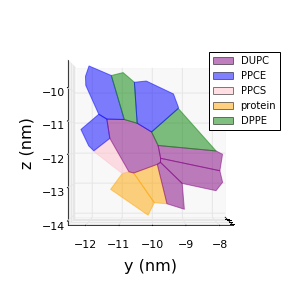

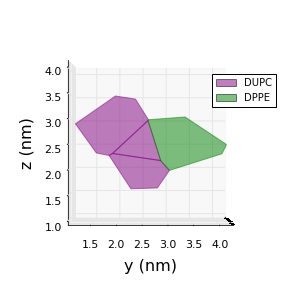

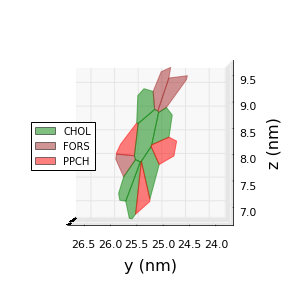

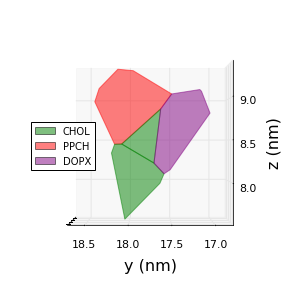

In [455]:
%%time
#produce the sample raw N neighbour Voronoi plots for dengue and sim39:
plot_instance_dengue_raw_N_neighbour_sample_DUPC_11_neighbours_4_us_outer_leaflet = voronoi_plotting_library.plot_sample_N_neighbours(dengue_dict_sample_neighbour_results_4_us_outer_leaflet_DUPC_11_neighbours,'DUPC','dengue')
plot_instance_dengue_raw_N_neighbour_sample_DUPC_11_neighbours_4_us_outer_leaflet.plot('Dengue representative case for \nDUPC surrounded by 11 neighbours (4 us)')
plot_instance_dengue_raw_N_neighbour_sample_DUPC_11_neighbours_4_us_outer_leaflet.save_plot('dengue_representative_case_DUPC_11_neighbours_4_us_outer_leaflet.png')

plot_instance_dengue_raw_N_neighbour_sample_DUPC_3_neighbours_4_us_outer_leaflet = voronoi_plotting_library.plot_sample_N_neighbours(dengue_dict_sample_neighbour_results_4_us_outer_leaflet_DUPC_3_neighbours,'DUPC','dengue')
plot_instance_dengue_raw_N_neighbour_sample_DUPC_3_neighbours_4_us_outer_leaflet.plot('Dengue representative case for \nDUPC surrounded by 3 neighbours (4 us)')
plot_instance_dengue_raw_N_neighbour_sample_DUPC_3_neighbours_4_us_outer_leaflet.save_plot('dengue_representative_case_DUPC_3_neighbours_4_us_outer_leaflet.png')

plot_instance_sim39_raw_N_neighbour_sample_CHOL_11_neighbours_4_us_outer_leaflet = voronoi_plotting_library.plot_sample_N_neighbours(sim39_dict_sample_neighbour_results_4_us_outer_leaflet_CHOL_11_neighbours,'CHOL','flu')
plot_instance_sim39_raw_N_neighbour_sample_CHOL_11_neighbours_4_us_outer_leaflet.plot('Flu representative case for \nCHOL surrounded by 11 neighbours (4 us)')
plot_instance_sim39_raw_N_neighbour_sample_CHOL_11_neighbours_4_us_outer_leaflet.save_plot('flu_representative_case_CHOL_11_neighbours_4_us_outer_leaflet.png')

plot_instance_sim39_raw_N_neighbour_sample_CHOL_3_neighbours_4_us_outer_leaflet = voronoi_plotting_library.plot_sample_N_neighbours(sim39_dict_sample_neighbour_results_4_us_outer_leaflet_CHOL_3_neighbours,'CHOL','flu')
plot_instance_sim39_raw_N_neighbour_sample_CHOL_3_neighbours_4_us_outer_leaflet.plot('Flu representative case for \nCHOL surrounded by 3 neighbours (4 us)')
plot_instance_sim39_raw_N_neighbour_sample_CHOL_3_neighbours_4_us_outer_leaflet.save_plot('flu_representative_case_CHOL_3_neighbours_4_us_outer_leaflet.png')

In [ ]:
#rough work to generate the paper figure named "isolated_raw"
for lipid_name, plot_title, plot_filename, list_of_dicts in [('DUPC', 'Dengue Inner Leaflet DUPC', 'dengue_inner_DUPC.png', [dengue_inner_leaflet_neighbour_dict_0_us, dengue_inner_leaflet_neighbour_dict_2_us, dengue_inner_leaflet_neighbour_dict_4_us]),('DUPC', 'Dengue Outer Leaflet DUPC', 'dengue_outer_DUPC.png', [dengue_outer_leaflet_neighbour_dict_0_us, dengue_outer_leaflet_neighbour_dict_2_us, dengue_outer_leaflet_neighbour_dict_4_us]), ('DOPE', 'Flu Inner Leaflet DOPE', 'flu_inner_DOPE.png', [sim39_inner_leaflet_neighbour_dict_0_us, sim39_inner_leaflet_neighbour_dict_2_us, sim39_inner_leaflet_neighbour_dict_4_us]),('CHOL', 'Flu Outer Leaflet CHOL', 'flu_outer_CHOL.png', [sim39_outer_leaflet_neighbour_dict_0_us, sim39_outer_leaflet_neighbour_dict_2_us, sim39_outer_leaflet_neighbour_dict_4_us])]:
    voronoi_plotting_library.plot_panel_fig_isolated_raw(dictionary_data_list = list_of_dicts, lipid_name = lipid_name, plot_title = plot_title, plot_filename = plot_filename, time_value_list_microseconds = [0, 2, 4])

In [ ]:
#rough work to generate images needed for paper figure named "aggregate_raw"
for dict_list, plot_title, filename in [([dengue_inner_leaflet_neighbour_dict_0_us, dengue_inner_leaflet_neighbour_dict_2_us, dengue_inner_leaflet_neighbour_dict_4_us], 'Dengue Inner Leaflet', 'dengue_inner_aggregate.png'),([dengue_outer_leaflet_neighbour_dict_0_us, dengue_outer_leaflet_neighbour_dict_2_us, dengue_outer_leaflet_neighbour_dict_4_us], 'Dengue Outer Leaflet', 'dengue_outer_aggregate.png'),([sim39_inner_leaflet_neighbour_dict_0_us, sim39_inner_leaflet_neighbour_dict_2_us, sim39_inner_leaflet_neighbour_dict_4_us], 'Flu Inner Leaflet', 'flu_inner_aggregate.png'),([sim39_outer_leaflet_neighbour_dict_0_us, sim39_outer_leaflet_neighbour_dict_2_us, sim39_outer_leaflet_neighbour_dict_4_us], 'Flu Outer Leaflet', 'flu_outer_aggregate.png')]:
    voronoi_plotting_library.plot_panel_fig_aggregate_raw(dictionary_data_list = dict_list, plot_title = plot_title, plot_filename = filename, time_value_list_microseconds = [0, 2, 4])

In [714]:
def axis_plotter(axis, dictionary, xlim, ylim, vert_line = None,  ylabel = None, xlabel = None, xlabel_fontsize = None, ylabel_fontsize = None, xtick_label_size = None, ytick_label_size = None):
    color_dict = {'POPS':'black','DOPE':'blue','CHOL':'green','PPCH':'red','DOPX':'purple','protein':'orange','FORS':'brown'}
    for neighbour_species_name, neighbour_count_dict in dictionary.iteritems():
        list_neighbour_counts = []
        list_avg_surface_areas = []
        list_std_dev_values = []
        for neighbour_count, list_surface_areas in neighbour_count_dict.iteritems():
            list_neighbour_counts.append(neighbour_count)
            surface_area_array = numpy.array(list_surface_areas)
            average_surface_area = numpy.average(surface_area_array)
            std_surface_area = numpy.std(surface_area_array) 
            list_avg_surface_areas.append(average_surface_area)
            list_std_dev_values.append(std_surface_area)
        axis.errorbar(numpy.array(list_neighbour_counts), list_avg_surface_areas, yerr = None, alpha = 1.0, label = neighbour_species_name, lw = 2.5, color = color_dict[neighbour_species_name]) 
        error_array = numpy.array(list_std_dev_values)
        array_avg_surface_areas = numpy.array(list_avg_surface_areas)
        #ax.set_xticks(numpy.arange(10))
        #ax.legend(prop={'size':8})
        axis.fill_between(numpy.array(list_neighbour_counts), array_avg_surface_areas - error_array, array_avg_surface_areas + error_array, alpha = 0.05)
        axis.set_ylim(0,160)
        axis.set_xlim(0,11)
        if vert_line is not None:
            axis.axvline(x = vert_line, color = 'k', lw = 4, alpha = 0.1) # vertical line at the starting neighbour count for CHOL
        if ylabel is not None:
            axis.set_ylabel(ylabel, fontsize = ylabel_fontsize)
        axis.set_xlabel(xlabel, fontsize = xlabel_fontsize)
        axis.tick_params(axis = 'x', labelsize = xtick_label_size)
        axis.tick_params(axis = 'y', labelsize = ytick_label_size)
            
def generate_figure_species_specific(sim39_dicts, sim38_dicts, sim37_dicts, title_fontsize = 16):
    '''For generating the plots to be used in figure named species_specific.'''
    fig = plt.figure()
    top_row_subplot_values = range(1,7)
    bottom_row_subplot_values = range(7,10)
    
    # top row is the selected sim39 plots
    for time_value, sim39_dict in zip(range(6),sim39_dicts):
        subplot_number = top_row_subplot_values.pop(0)
        ax = fig.add_subplot(2,6,subplot_number)
        
        plot_title_string = 'Flu (+FORS) protein \n{time_value} $\mu$s (323 K)'.format(time_value=time_value)
        ax.set_title(plot_title_string, fontsize = title_fontsize)
        
        if subplot_number == 1:
            ylabel = 'average Voronoi cell\n surface area ($\AA^2$)'
        else:
            ylabel = None
            
        axis_plotter(axis = ax, dictionary = sim39_dict['protein'], xlim = (0,11), ylim = (0,160), vert_line = 7, ylabel = ylabel, xlabel = '# neighbours', xlabel_fontsize = 24, ylabel_fontsize = 24, xtick_label_size = 22, ytick_label_size = 22)
        
    # place a custom legend below the final sim39 plot
    ax.legend(prop={'size':28}, bbox_to_anchor = [0.9,-0.3])
        
    # bottom row is the remaining selected plots from sims 38 & 37
    sim38_dict = sim38_dicts[0]
    subplot_number = bottom_row_subplot_values.pop(0)
    ax_sim38_PPCH_5us = fig.add_subplot(2,5,subplot_number)
    ax_sim38_PPCH_5us.set_title('Flu (+FORS) PPCH \n5 $\mu$s (295 K)', fontsize = title_fontsize)
    axis_plotter(axis = ax_sim38_PPCH_5us, dictionary = sim38_dict['PPCH'], xlim = (0,11), ylim = (0,160), vert_line = None, ylabel = 'average Voronoi cell\n surface area ($\AA^2$)', xlabel = '# neighbours', xlabel_fontsize = 24, ylabel_fontsize = 24, xtick_label_size = 22, ytick_label_size = 22)
        
    subplot_number = bottom_row_subplot_values.pop(0)
    ax_sim38_CHOL_5us = fig.add_subplot(2,5,subplot_number)
    ax_sim38_CHOL_5us.set_title('Flu (+FORS) CHOL \n5 $\mu$s (295 K)', fontsize = title_fontsize)
    axis_plotter(axis = ax_sim38_CHOL_5us, dictionary = sim38_dict['CHOL'], xlim = (0,11), ylim = (0,160), vert_line = None, xlabel = '# neighbours', xlabel_fontsize = 24, xtick_label_size = 22, ytick_label_size = 22)
    
    sim37_dict = sim37_dicts[0]
    subplot_number = bottom_row_subplot_values.pop(0)
    ax_sim37_CHOL_5us = fig.add_subplot(2,5,subplot_number)
    ax_sim37_CHOL_5us.set_title('Flu (-FORS) CHOL \n5 $\mu$s (323 K)', fontsize = title_fontsize)
    axis_plotter(axis = ax_sim37_CHOL_5us, dictionary = sim37_dict['CHOL'], xlim = (0,11), ylim = (0,160), vert_line = None, xlabel = '# neighbours', xlabel_fontsize = 24, xtick_label_size = 22, ytick_label_size = 22)
        
    fig.subplots_adjust(hspace=0.4, wspace = 0.3)
    fig.set_size_inches(24,12)
    fig.savefig('fig_species_specific.png', dpi = 300, bbox_inches = 'tight')

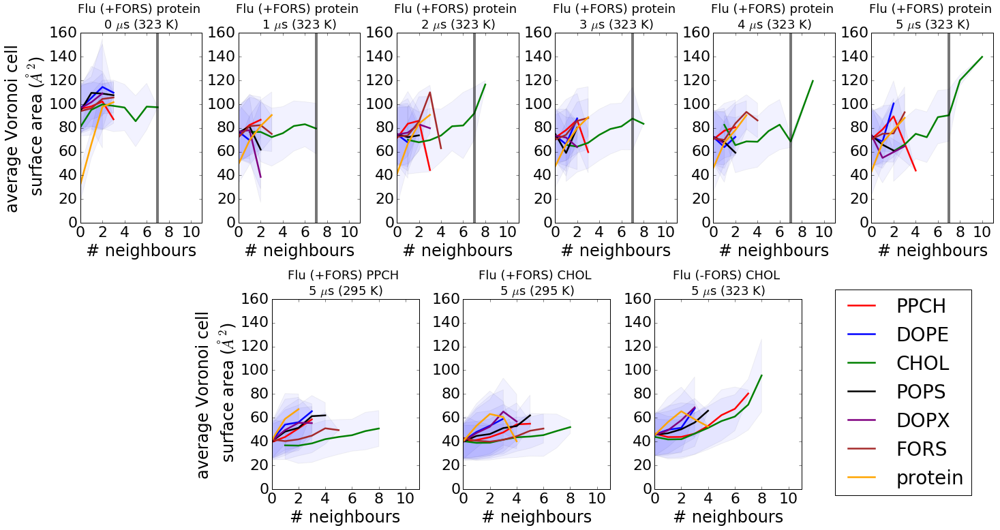

In [715]:
generate_figure_species_specific(sim39_dicts = [sim39_outer_leaflet_neighbour_dict_by_species_0us,
                                                sim39_outer_leaflet_neighbour_dict_by_species_1us, 
                                                sim39_outer_leaflet_neighbour_dict_by_species_2us,
                                                sim39_outer_leaflet_neighbour_dict_by_species_3us,
                                                sim39_outer_leaflet_neighbour_dict_by_species_4us, 
                                                sim39_outer_leaflet_neighbour_dict_by_species_5us], 
                                 sim38_dicts = [sim38_outer_leaflet_neighbour_dict_by_species_5us],
                                 sim37_dicts = [sim37_outer_leaflet_neighbour_dict_by_species_5us],
                                title_fontsize = 18)